### Eventi SEP WORST CASE SCENARIO


SECONDA SETTIMANA  
24/11-28/11

Una volta trovati i cataloghi principali, gli strumenti e i detector è tempo di scaricare flussi differenziali per ciascuno degli eventi SEP selezionati

-Flussi diff protoni 
-Flussi diff Ioni pesanti
-Flussi diff elettroni 


EVENTI SEP PER WORST CASE SCENARIO:

	1) SEP impulsivo          JAN 2005      spettro duro alte energie   
	2) SEP graduale           JUL 2012      colpisce STEREO-A
	3) SEP misto              OCT 2003      alta fluenza test durata   
	4) SEP cumulativo         MAY 2024      SC25 eventi ravvvicinati
	5) SEP multi-misurato     SEP 2017      spettro GOES/RAD Terra v Mars  
	6) SEP ioni pesanti       JUL 2000      ricco di particelle pesantiSEE
	7) SEP imprevisto       DEC 2006        vicino al minimo solare    



COSA SCARICARE:

	1) Flusso Protoni per TID e DOSE
		-Segnarsi che strumento era e dove si trovava per rescaling  
		-Flusso diff  part/cm s sr MeV per costrure spettro 
		-Risoluzione temporale  1-5 min o 1h
		-Scaricare il background 24h prima fondo
		-Longitudine Solare of [year] event

	2) Ioni pesanti per SEE
		-Usare ACE/SIS da CDAWeb
		-Flussi per Fe e Ossigeno O

	3) Elettroni solo se si ha tempo extra



NEXT: 

	-Scaricare flusso differenziale vs time
	-Scaricare la composizione in ioni e se c'è angolo pitch
	-Da GOES (geo) e ACE/STEREO/altri
	-Integrare ciascun canale $\phi(E)$
	-Fare fit per ottenere spettro energia

In [187]:
import numpy as np

## 1) Evento SEP impulsivo JAN 2005


- Evento impulsivo con picco 20 gennaio 2005
- Dati da Satellite GOES-11 
- EPS (energetic particle sensor):
    Energetic Particle Sensors (EPS) are solid-state detectors with pulse-height discrimination that measure proton, alpha-particle, and electron fluxes. The EPS telescope (channels P1-P3) and the dome D5 detector designs (channels P6 and P7) were the same from GOES-4 through GOES-15. The dome D3 (channels P4, E1, and E2) and dome D4 detector designs (channels P5 and E3) were the same from GOES-8 through GOES-15.

    The E1, E2, E3, and P1 channels respond to trapped outer radiation belt particles. The P2 channel may occasionally respond to trapped particles during magnetically disturbed conditions. P1–P7 measure fluxes that originate outside the magnetosphere–from the sun or the heart of the galaxy. Similarly, the alpha particle channels A1–A6 measure fluxes of solar- and galactic-origin helium-4 nuclei.

    The particle data also include significant secondary responses from higher energy particles, other species (especially proton contamination of electron channels E2 and E3), and directions outside the nominal detector entrance aperture. The data also include backgrounds that are caused by instrument noise, not by penetrating radiation. The integral proton fluxes are derived from the instrument channels and have been partially corrected for these effects. E2 (>2 MeV) and E3 (>4 MeV) electron data become unreliable during most solar energetic particle events (solar radiation storms). The alpha particle (helium-4 nuclei) channels are all differential channels.

- HEPAD 
    The HEPAD telescope consists of two silicon detectors and a photomultiplier tube (PMT) illuminated by a Cherenkov radiator. Triple coincidences between the two silicon detectors and the PMT are used to produce four proton channels and two alpha particle channels. There are three proton differential channels between 330 and 700 MeV and an integral channel above 700 MeV. The two alpha particle channels rarely report fluxes above backgrounds. HEPAD data are available from GOES-6 and GOES 8-15 (The GOES-7 instrument failed). The GOES-6 HEPAD first observed a SEP event with a ground level enhancement (GLE) in February 1984 (GLE 39). The final GLE observed by HEPAD (on GOES 13–15) was GLE 72 (September 2017).


I dati scaricati in seguito provengono da:

- https://www.ncei.noaa.gov/products/goes-1-15/space-weather-instruments

Science-Quality particles Data:
    When available, we strongly recommend using the science-quality data in your study. These data have been reprocessed to account for new calibrations, to account for dead time, or to flag backgrounds and contamination. The 1-minute averages of the GOES 13–15 EPEAD >0.8 and >2 MeV electron channels (E1 and E2) were reprocessed by NCEI with a science-quality algorithm. Key aspects of this algorithm that distinguished this product from the real-time SWPC product included (1) application of a dead-time correction and (2) replacing near-background values with fill values. NCEI has also calculated pitch angles for MAGED and MAGPD at 1-minute cadence using magnetic field measurements from the GOES 13–15 magnetometers.

The 1-minute average EPAD and MAGED/MAGPD pitch angles monthly files can be accessed from the GOES-SEM averages directory. They are contained in the NetCDF folders for GOES 13–15, and use the following file naming convention:

;gXX_epead_e13ew_1m_yyyymmdd_yyyymmdd_science_v1.0.0.nc.

gXX_pitch_angles_1m_yyymmdd_yyymmdd.nc”

The GOES EPEAD Science-Quality Electron Fluxes Algorithm Theoretical Basis Document and GOES 13–15 MAGE/PD Pitch Angles Algorithm Theoretical Basis Document provide a detailed description of the science-quality algorithm and product.

GOES-14 Science-quality Particle Data (2013-2017): High-resolution and averages (1min and 5min) from EPEAD, HEPAD and MAGED instruments. 


Header trovato alla riga: 454
Canali FLUSSO_PROTONI_CORRETTI trovati: ['p1_flux_c', 'p2_flux_c', 'p3_flux_c', 'p4_flux_c', 'p5_flux_c', 'p6_flux_c', 'p7_flux_c']


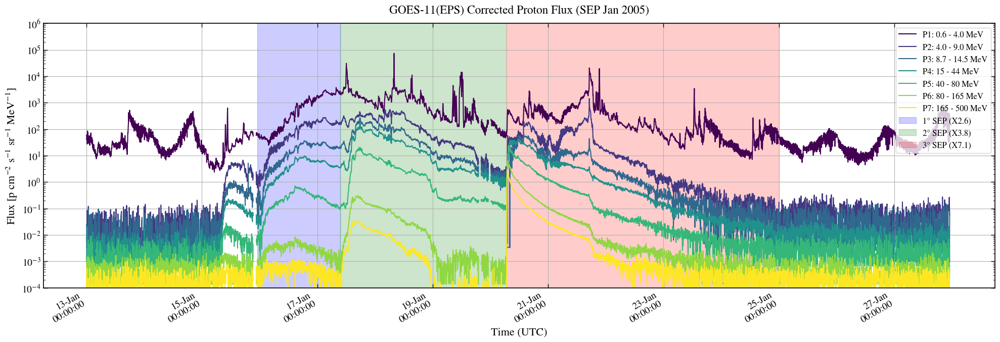

In [10]:
# Analisi dati GOES-11 EPS  5min

import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np


#font stile paper astrophysical journal AASTeX tipo LaTeX


# 1. FONT: Usiamo STIXGeneral che è il clone perfetto di Times New Roman/LaTeX
#    (Funziona anche se non hai LaTeX installato sul PC)
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.size'] = 14       # Testo leggibile
mpl.rcParams['axes.labelsize'] = 16  # Etichette assi più grandi
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 12

# 2. TICKS (Tacchette): Verso l'interno e su tutti i lati (Top/Right mirror)
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True      # Tacchette anche sopra
mpl.rcParams['ytick.right'] = True    # Tacchette anche a destra
mpl.rcParams['xtick.major.size'] = 6  # Lunghezza tacchette maggiori
mpl.rcParams['xtick.minor.size'] = 3  # Lunghezza tacchette minori
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0

# 3. ASSI E BORDI: Più spessi per risaltare
mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['axes.grid'] = False     # Niente griglia (o True se preferisci, ma alpha bassa)

# -----------------------------------------------------------------------

file_path = "File_scaricati_eventiSEP/Evento JAN 2005/g11_eps_5m_20050101_20050131.csv"


#Cerca dinamica header che dovrebbe partire con "time_tag" riga 455
header_line_index = 0
column_names = []

with open(file_path, "r") as f:
    for i, line in enumerate(f):
        if "time_tag" in line and "p1_flux" in line:
            header_line_index = i
            column_names = line.strip().split(",")
            break

print(f"Header trovato alla riga: {header_line_index}")


# Dataset 

df_jan2005 = pd.read_csv(file_path, skiprows=header_line_index + 1, header=None, names=column_names)
# quick print
#print(df_jan2005.head(10))


# PULIZIA DATI

df_jan2005["time_tag"] = pd.to_datetime(df_jan2005["time_tag"])
df_jan2005 = df_jan2005.set_index("time_tag")

#Nan values fix
df_jan2005 = df_jan2005.replace(-99999, np.nan)

# Scelgo solo i canali di FLUSSO DIFFERENZIALE CORRETTI  
#float p1_flux_c(record);
#p1_flux_c:description = "P1 Proton channel 0.6 - 4.0 MeV corrected.";

proton_cols = [c for c in df_jan2005.columns if c.startswith("p") and c.endswith("_flux_c")]

print(f"Canali FLUSSO_PROTONI_CORRETTI trovati: {proton_cols}")

# -----------------------------------------------------------------------
# -----------------------------------------------------------------------
# PLOT EVENTO 

#Etichette 
channel_map = {
    'p1_flux_c': 'P1: 0.6 - 4.0 MeV',
    'p2_flux_c': 'P2: 4.0 - 9.0 MeV',
    'p3_flux_c': 'P3: 8.7 - 14.5 MeV',
    'p4_flux_c': 'P4: 15 - 44 MeV',
    'p5_flux_c': 'P5: 40 - 80 MeV',
    'p6_flux_c': 'P6: 80 - 165 MeV',
    'p7_flux_c': 'P7: 165 - 500 MeV'
}


#Event range
start = "2005-01-13"
end = "2005-01-27"
df_evento_jan2005 = df_jan2005.loc[start:end]

plt.figure(figsize=(20, 7))

# Usa una colormap (es. Viridis o Jet)
colors = plt.cm.viridis(np.linspace(0, 1, len(proton_cols)))

for col, color in zip(proton_cols, colors):
    label_text = channel_map.get(col, col) 
    
    plt.plot(df_evento_jan2005.index, df_evento_jan2005[col], 
             label=label_text, 
             color=color, 
             linewidth=1.5)
    
# Shade events
for event_name, event_info in events.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)


# --- 4. FORMATTAZIONE FINALE ---
plt.yscale('log')
plt.ylim(1e-4, 1e6) # Aggiusta se necessario

# Etichette assi con LaTeX
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'GOES-11(EPS) Corrected Proton Flux (SEP Jan 2005)', pad=15)

# Formattazione asse temporale
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b\n%H:%M:%S'))
plt.gcf().autofmt_xdate()

# Legenda Stile Paper (senza box pesante, font leggermente più piccolo se serve)
plt.legend(frameon=True, loc='upper right', fontsize=12, handlelength=2)

plt.grid()
plt.tight_layout()
plt.show()

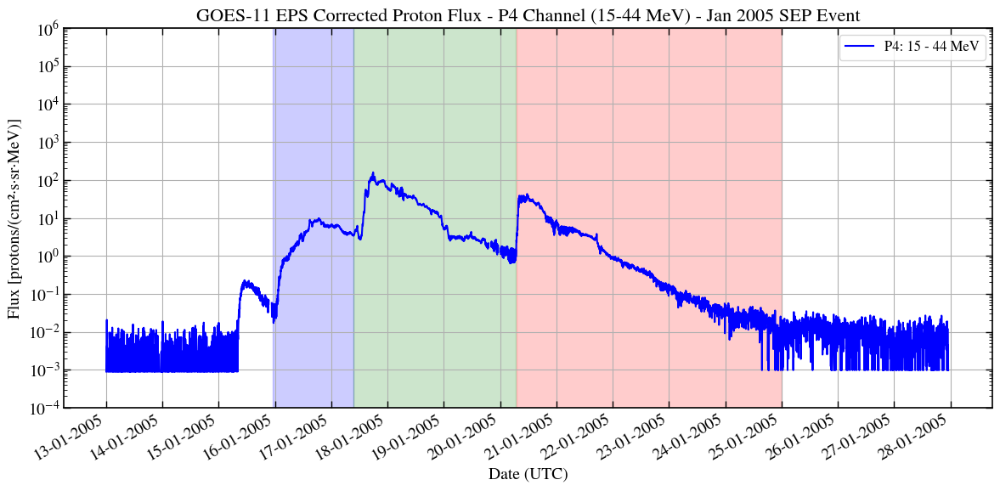

In [11]:
# plot of only p4 flux_c with every day marked
plt.figure(figsize=(12, 6))
plt.plot(df_evento_jan2005.index, df_evento_jan2005["p4_flux_c"], label='P4: 15 - 44 MeV', color='blue', linewidth=1.5)
plt.yscale("log")
plt.ylim(1e-4, 1e6)
plt.title("GOES-11 EPS Corrected Proton Flux - P4 Channel (15-44 MeV) - Jan 2005 SEP Event", fontsize=16)
plt.xlabel("Date (UTC)", fontsize=14)
plt.ylabel("Flux [protons/(cm²·s·sr·MeV)]", fontsize=14)
plt.grid()
plt.legend()


# Shade events
for event_name, event_info in events.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)


# fix: obtain current axes object before using its xaxis
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y'))
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()


## Pulizia Dati JAN 2005

Dati puliti: Zeri convertiti in NaN e interpolati correttamente.


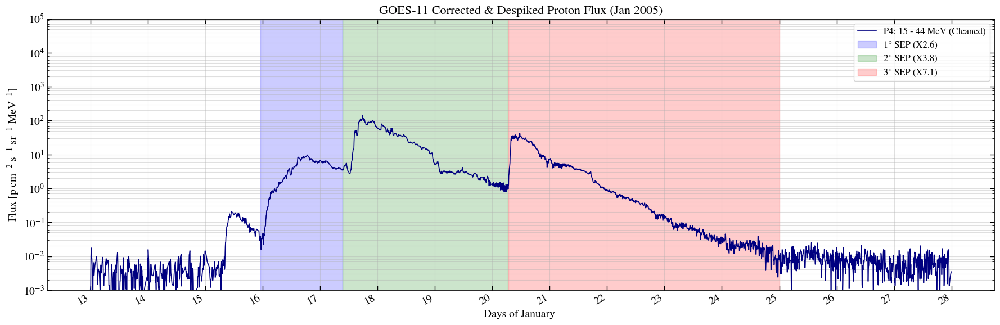

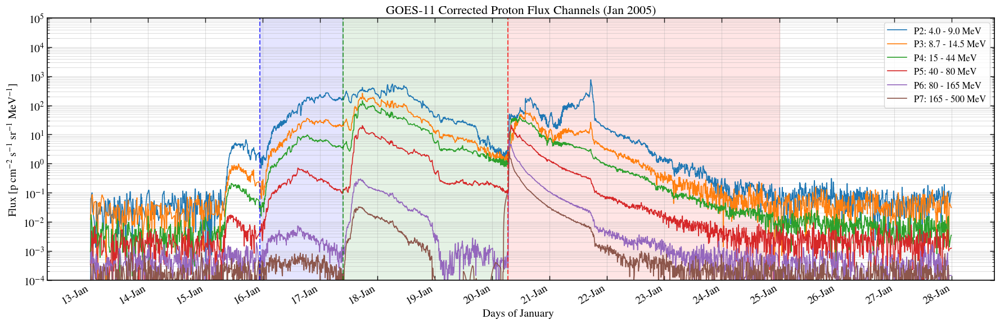

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# --- 1. DEFINIZIONE E SOTTRAZIONE BACKGROUND ---

# Definizione intervallo di quiete
start_bg = "2005-01-13 00:00:00"
end_bg = "2005-01-14 00:00:00"

df_bg = df_jan2005.loc[start_bg:end_bg]
background_mean = df_bg.mean()

# Sottrazione del background
# Nota: Lavoriamo su una copia per non toccare l'originale per sbaglio
df_corrected = df_evento_jan2005[proton_cols].copy() - background_mean[proton_cols]


# --- 2. FUNZIONE DI PULIZIA MIGLIORATA (ROBUST CLEANING) ---

def clean_flux_data_robust(df):
    """
    Pulisce i dati di flusso SEP rimuovendo spike e interpolando i dropouts.
    """
    df_out = df.copy()
    
    # PASSAGGIO CHIAVE: Trasformiamo valori <= 0 in NaN. 
    # interpolate() riempie solo i NaN. Se lasciamo 0, il buco rimane.
    df_out[df_out <= 0] = np.nan
    
    # 1. Despiking con Rolling Median
    # Aumentiamo la window a 3 (ca. 15 min) per gestire dropouts di consecutivi
    # min_periods=1 permette di calcolare la mediana anche se ci sono NaN vicini
    df_out = df_out.rolling(window=3, center=True, min_periods=1).median()
    
    # 2. Interpolazione Temporale
    # Riempie i buchi (NaN) tirando una linea tra i punti validi
    # limit=12 copre buchi fino a 1 ora (12 * 5 min)
    df_out = df_out.interpolate(method="time", limit=24) 
    
    # 3. Gestione residui
    # Se rimangono ancora NaN (es. all'inizio o alla fine assoluta del file),
    # li mettiamo a un valore minimo positivo (floor) invece di 0 per evitare errori logaritmici.
    floor_value = 1e-5 
    df_out = df_out.fillna(floor_value)

    return df_out

# Applichiamo la nuova pulizia
df_clean = clean_flux_data_robust(df_corrected)
print("Dati puliti: Zeri convertiti in NaN e interpolati correttamente.")


# --- 3. PLOT DI VERIFICA ---

events = {
    "1° SEP (X2.6)": {"start": "2005-01-15 23:00", "end": "2005-01-17 09:30", "color": "blue", "label": "1° SEP (X2.6)"},
    "2° SEP (X3.8)": {"start": "2005-01-17 09:30", "end": "2005-01-20 06:30", "color": "green", "label": "2° SEP (X3.8)"},
    "3° SEP (X7.1)": {"start": "2005-01-20 06:50", "end": "2005-01-25 00:00", "color": "red", "label": "3° SEP (X7.1)"}
}

plt.figure(figsize=(18, 6))

# Plot dei dati puliti
plt.plot(df_clean.index, df_clean["p4_flux_c"], 
         label='P4: 15 - 44 MeV (Cleaned)', 
         color='navy', linewidth=1.2)

# Shade events
for event_name, event_info in events.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)

# Formattazione
plt.yscale("log")
plt.ylim(1e-3, 1e5) # Adattato per rimuovere rumore di fondo inutile
plt.title("GOES-11 Corrected & Despiked Proton Flux (Jan 2005)", fontsize=16)
plt.ylabel(r"Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14)
plt.xlabel("Days of January ", fontsize=14)
plt.grid(True, which="both", alpha=0.4)
plt.legend(loc='upper right')

# Gestione date asse X
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1)) # Meno affollato
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d'))
plt.gcf().autofmt_xdate()

plt.tight_layout()
plt.show()

#plot tutti canali puliti tranne p1
plt.figure(figsize=(18, 6))
for col in proton_cols[1:]:  # Skip p1_flux_c
    label_text = channel_map.get(col, col) 
    plt.plot(df_clean.index, df_clean[col], label=label_text, linewidth=1.2)
plt.yscale("log")
plt.ylim(1e-4, 1e5)
plt.title("GOES-11 Corrected Proton Flux Channels (Jan 2005)", fontsize=16)
plt.ylabel(r"Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=14)
plt.xlabel("Days of January  ", fontsize=14)
plt.grid(True, which="both", alpha=0.4)
plt.legend(loc='upper right')

#event shading 
for event_name, event_info in events.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.1)
    
# vertical dotted line for ontime set 06:36 20/09
plt.axvline(pd.to_datetime("2005-01-20 06:36"), color='red', linestyle='--', alpha=0.7)
plt.axvline(pd.to_datetime("2005-01-15 22:48"), color='blue', linestyle='--', alpha=0.7)
plt.axvline(pd.to_datetime("2005-01-17 09:43"), color='green', linestyle='--', alpha=0.7)


# Gestione date asse X
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1)) # Meno affollato
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()








In [13]:
plt.close('all')

### Calcolo fluenza e spettro energia JAN 2005


Fluenza integrata in ciascun canale : F = ∫ J(E) dt

Fluenza su banda energetica effettiva del canale : Phi(E) = F * ΔE

deltaE = sqrt(E_high x E_low) 



Plot spettro:  (E_eff, Phi(E))


1. Modello 1  
 Band double power-law 


2. Modello 2 
 Ellison-Ramaty power-law with exponential cutoff


3. Modello 3 
 Combined model 











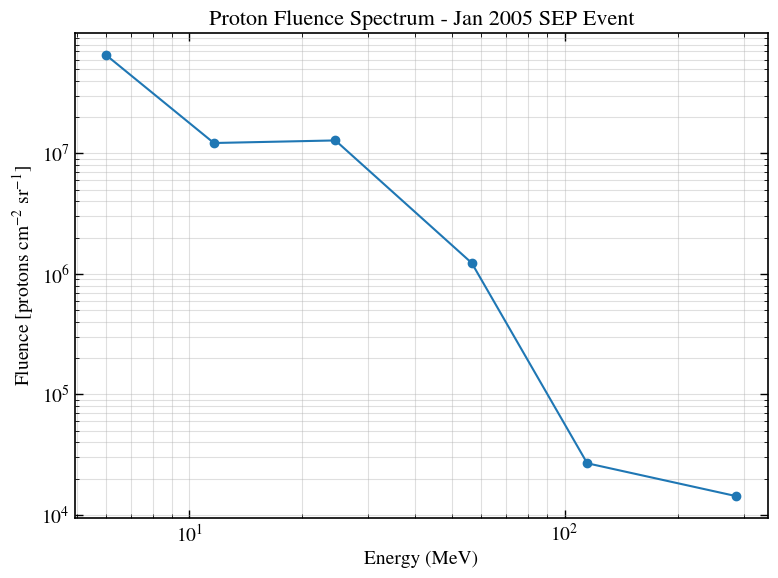

In [7]:
t_start = pd.to_datetime("2005-01-15 23:30:00")
t_end = pd.to_datetime("2005-01-17 09:30:00")


dt_evt = df_clean.loc[t_start:t_end]


#calcolo fluenza per canali p2-p7
fluence_diff = {}

for col in proton_cols[1:]:
    F = (dt_evt[col] * dt_evt.index.to_series().diff().dt.total_seconds()).sum()
    fluence_diff[col] = F

# Converto in flunce per banda 

energy_bins = {
    "p1_flux_c": (0.7, 4.0),
    "p2_flux_c": (4.0, 9.0),
    "p3_flux_c": (9.0, 15.0),
    "p4_flux_c": (15.0, 40.0),
    "p5_flux_c": (40.0, 80.0),
    "p6_flux_c": (80.0, 165.0),
    "p7_flux_c": (165.0, 500.0)

}


fluence_int = {}

for col in proton_cols[1:]:
    Emin, Emax = energy_bins[col]
    delta_E = Emax - Emin
    Phi = fluence_diff[col] * delta_E
    fluence_int[col] = Phi


# Energie efficaci dei canali 

E_eff = {}

for col,(Emin,Emax) in energy_bins.items():
    E_eff[col] = np.sqrt(Emin * Emax)


# Spettro 

energies = np.array([E_eff[c]for c in proton_cols[1:]])
fluences = np.array([fluence_int[c]for c in proton_cols[1:]])


# Plot 
plt.figure(figsize=(8,6))
plt.loglog(energies, fluences, marker='o', linestyle='-')
plt.xlabel('Energy (MeV)', fontsize=14)
plt.ylabel(r'Fluence [protons cm$^{-2}$ sr$^{-1}$]', fontsize=14)
plt.title('Proton Fluence Spectrum - Jan 2005 SEP Event', fontsize=16)
plt.grid(True, which="both", alpha=0.4)
plt.tight_layout()
plt.show()




Ellison-Ramaty Params: A=4.77e+09, gamma=3.07, Er=192.96 MeV
Band Params: ga=0.00, gb=4.27, E0=21.32 MeV


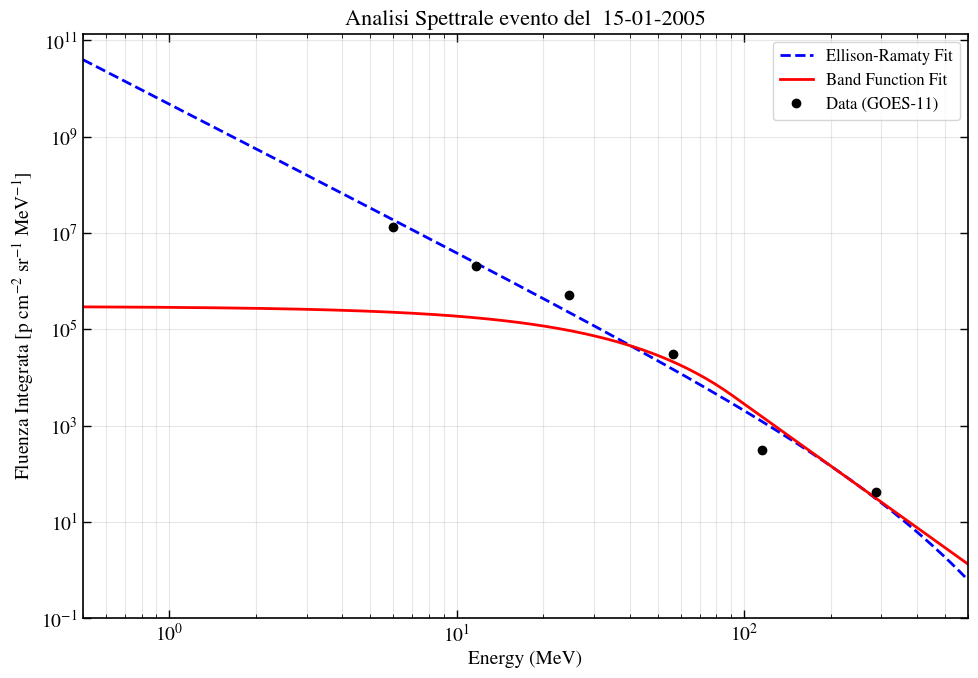

In [9]:
# FIt spettro 
from scipy.optimize import curve_fit

x_data = np.array([E_eff[c] for c in proton_cols[1:]])
y_data = np.array([fluence_diff[c] for c in proton_cols[1:]])

# Ordiniamo i dati per sicurezza (necessario per i plot)
sort_idx = np.argsort(x_data)
x_data = x_data[sort_idx]
y_data = y_data[sort_idx]


# 1. Ellison-Ramaty (Eq. 3)
# A * E^(-gamma) * exp(-E/Er)
def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** -gamma) * np.exp(-E / Er)

# 2. Band Function (Eq. 2)
def band_function(E, A, ga, gb, E0):
    # Punto di rottura (break energy)
    E_break = (gb - ga) * E0
    
    # Prepariamo l'array di output
    res = np.zeros_like(E)
    
    # Indici per le due regioni
    mask_low = E < E_break
    mask_high = ~mask_low # E >= E_break
    
    # Parte bassa energia
    # A * E^(-ga) * exp(-E/E0)
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    
    # Parte alta energia
    # A * E^(-gb) * [(gb-ga)E0]^(gb-ga) * exp(ga-gb)
    # Nota: exp(ga-gb) è una costante di normalizzazione per la continuità
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor
    
    return res

# 3. Combined Function (Eq. 4)
# Band Function * exp(-E/Er)
# Attenzione: Eq 4 usa la Band function moltiplicata per un cutoff esponenziale aggiuntivo
def combined_function(E, A, ga, gb, E0, Er):
    # Calcoliamo prima la Band
    phi_band = band_function(E, A, ga, gb, E0)
    # Moltiplichiamo per il cutoff aggiuntivo
    return phi_band * np.exp(-E / Er)

# Funzione helper per fittare nel log-space (più stabile per leggi di potenza)
def fit_log_space(func, x, y, p0, bounds=(-np.inf, np.inf)):
    # Definiamo una funzione wrapper che calcola il log10 del modello
    def func_log(x_in, *params):
        model_y = func(x_in, *params)
        # Evitiamo log(0) o negativi
        model_y = np.maximum(model_y, 1e-30) 
        return np.log10(model_y)
    
    popt, pcov = curve_fit(func_log, x, np.log10(y), p0=p0, bounds=bounds, maxfev=5000)
    return popt

# --- FIT ELLISON-RAMATY ---
# Guess iniziali: A alta, gamma circa 2, Er circa 10-50 MeV
p0_er = [1e6, 2.0, 30.0] 
# Bounds: A>0, gamma>0, Er>0
bounds_er = ([0, 0, 0], [np.inf, 10, 1000])

try:
    popt_er = fit_log_space(ellison_ramaty, x_data, y_data, p0=p0_er, bounds=bounds_er)
    print(f"Ellison-Ramaty Params: A={popt_er[0]:.2e}, gamma={popt_er[1]:.2f}, Er={popt_er[2]:.2f} MeV")
except Exception as e:
    print("Fit Ellison-Ramaty fallito:", e)
    popt_er = None

# --- FIT BAND FUNCTION ---
# Guess: A alta, ga < gb (es. 1.0 e 3.0), E0 circa 10 MeV
p0_band = [1e5, 1.5, 3.5, 10.0]
# Bounds: ga < gb è richiesto dalla fisica della funzione (break)
# A>0, ga>0, gb>0, E0>0
bounds_band = ([0, 0, 0, 0], [np.inf, 10, 10, 500])

try:
    popt_band = fit_log_space(band_function, x_data, y_data, p0=p0_band, bounds=bounds_band)
    print(f"Band Params: ga={popt_band[1]:.2f}, gb={popt_band[2]:.2f}, E0={popt_band[3]:.2f} MeV")
except Exception as e:
    print("Fit Band fallito:", e)
    popt_band = None


# Creiamo un range di energie per disegnare le curve lisce
x_fit = np.logspace(np.log10(0.5), np.log10(600), 200)

plt.figure(figsize=(10, 7))

# 1. Dati sperimentali
plt.errorbar(x_data, y_data, fmt='o', color='black', label='Data (GOES-11)', markersize=6)

# 2. Plot Ellison-Ramaty
if popt_er is not None:
    y_er = ellison_ramaty(x_fit, *popt_er)
    plt.plot(x_fit, y_er, '--', color='blue', linewidth=2, label='Ellison-Ramaty Fit')

# 3. Plot Band Function
if popt_band is not None:
    y_band = band_function(x_fit, *popt_band)
    plt.plot(x_fit, y_band, '-', color='red', linewidth=2, label='Band Function Fit')



# Configurazione grafico
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Energy (MeV)', fontsize=14)
plt.ylabel(r'Fluenza Integrata [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.title('Analisi Spettrale evento del  15-01-2005', fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, which="both", alpha=0.3)

# Limiti assi per estetica
plt.xlim(0.5, 600)
plt.ylim(bottom=1e-1) # Adatta in base ai tuoi dati minimi

plt.tight_layout()
plt.show()




--- RISULTATI FIT (Incluso P1) ---

Analisi: 1° SEP (X2.6)
  [E-R]  A=6.5e+08, gamma=2.39, Er=81.4 MeV
  [Band] ga=0.00, gb=3.59, E0=3.2 MeV

Analisi: 2° SEP (X3.8)
  [E-R]  A=9.6e+08, gamma=1.73, Er=73.6 MeV
  [Band] ga=0.26, gb=3.37, E0=9.0 MeV

Analisi: 3° SEP (X7.1)
  [E-R]  A=2.7e+08, gamma=1.66, Er=1000.0 MeV
  [Band] ga=0.00, gb=1.73, E0=2.1 MeV


C:\Users\stefa\AppData\Local\Temp\ipykernel_12580\3188915644.py:25: RuntimeWarning: invalid value encountered in scalar power
  norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)


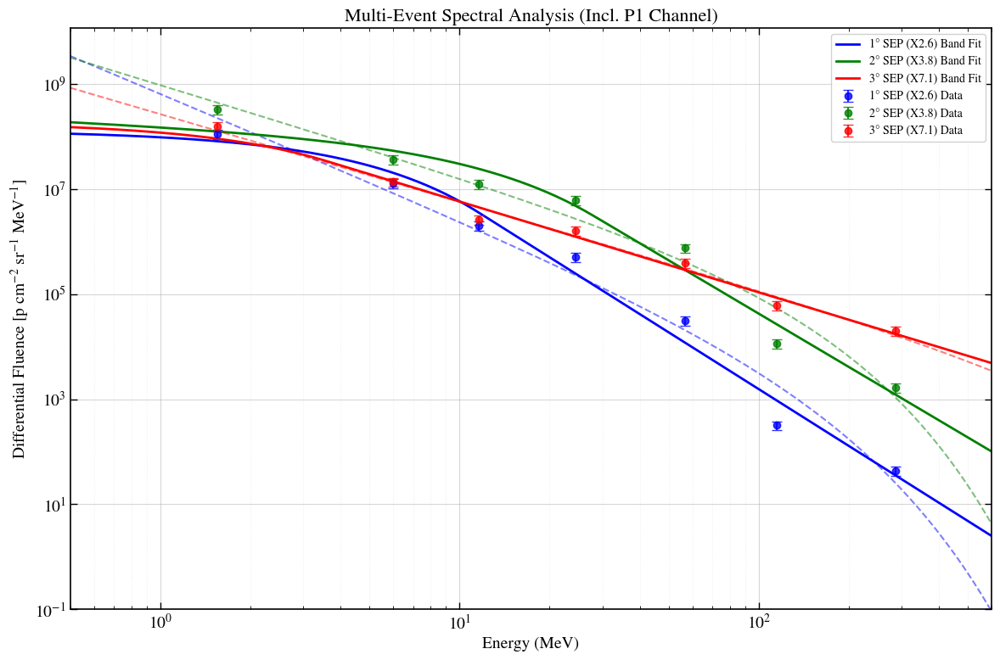

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==========================================
# 1. DEFINIZIONE FUNZIONI MATEMATICHE (FIT)
# ==========================================

# Ellison-Ramaty (Eq. 3)
def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** -gamma) * np.exp(-E / Er)

# Band Function (Eq. 2)
def band_function(E, A, ga, gb, E0):
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E < E_break
    mask_high = ~mask_low
    
    # Parte bassa energia
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    
    # Parte alta energia
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor
    return res

# Helper per fit nel log-space
def fit_log_space(func, x, y, y_err_abs, p0, bounds=(-np.inf, np.inf)):
    def func_log(x_in, *params):
        model_y = func(x_in, *params)
        model_y = np.maximum(model_y, 1e-30)
        return np.log10(model_y)
    
    # Propagazione errore: sigma_log = sigma_y / (y * ln(10))
    sigma_log = y_err_abs / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)

    try:
        popt, pcov = curve_fit(func_log, x, np.log10(y), p0=p0, 
                               sigma=sigma_log, absolute_sigma=True, 
                               bounds=bounds, maxfev=10000)
        return popt
    except Exception as e:
        return None

# ==========================================
# 2. SETUP DATI E PARAMETRI
# ==========================================

# Lista completa dei canali
proton_cols = ['p1_flux_c', 'p2_flux_c', 'p3_flux_c', 'p4_flux_c', 
               'p5_flux_c', 'p6_flux_c', 'p7_flux_c']

# ORA LI USIAMO TUTTI (incluso P1)
fit_cols = proton_cols 

# Aggiunto P1 al dizionario
energy_bins = {
    "p1_flux_c": (0.6, 4.0),   # <--- P1 AGGIUNTO QUI
    "p2_flux_c": (4.0, 9.0),
    "p3_flux_c": (9.0, 15.0),
    "p4_flux_c": (15.0, 40.0),
    "p5_flux_c": (40.0, 80.0),
    "p6_flux_c": (80.0, 165.0),
    "p7_flux_c": (165.0, 500.0)
}

# Calcolo energie efficaci (geometric mean)
E_eff = {}
for col, (Emin, Emax) in energy_bins.items():
    E_eff[col] = np.sqrt(Emin * Emax)

# Prepariamo l'asse X per i dati (verrà riordinato nel loop, ma serve la struttura)
x_data_raw = np.array([E_eff[c] for c in fit_cols])
sort_idx = np.argsort(x_data_raw)
x_data = x_data_raw[sort_idx] # Ordine crescente di energia

# Array X denso per il plot delle curve (partiamo un po' prima per vedere P1 bene)
x_fit_plot = np.logspace(np.log10(0.5), np.log10(600), 200)

# Dizionario Eventi
events = {
    "1° SEP (X2.6)": {"start": "2005-01-15 23:00", "end": "2005-01-17 09:30", "color": "blue"},
    "2° SEP (X3.8)": {"start": "2005-01-17 09:59", "end": "2005-01-20 06:30", "color": "green"},
    "3° SEP (X7.1)": {"start": "2005-01-20 06:50", "end": "2005-01-24 00:00", "color": "red"}
}

# ==========================================
# 3. CICLO DI ANALISI E PLOT
# ==========================================

plt.figure(figsize=(12, 8))
print("--- RISULTATI FIT (Incluso P1) ---")

for evt_name, params in events.items():
    t_start = pd.to_datetime(params["start"])
    t_end = pd.to_datetime(params["end"])
    colore = params["color"]
    
    # Selezione dati
    dt_evt = df_clean.loc[t_start:t_end]
    
    # Calcolo Fluenza Differenziale
    fluence_diff = {}
    for col in fit_cols:
        dt_seconds = dt_evt.index.to_series().diff().dt.total_seconds().fillna(0)

        flux_netto = dt_evt[col].clip(lower=0)  # Evitiamo contributi negativi

        F = (flux_netto * dt_seconds).sum()
        fluence_diff[col] = F
        
    # Creazione array Y ordinato
    y_data_raw = np.array([fluence_diff[c] for c in fit_cols])
    y_data = y_data_raw[sort_idx] 
    
    # Errore 20%
    y_err = y_data * 0.20
    
    # Plot Dati
    plt.errorbar(x_data, y_data, yerr=y_err, 
                 fmt='o', color=colore, ecolor=colore, capsize=4, 
                 label=f"{evt_name} Data", markersize=6, alpha=0.8)
    
    # --- FIT ---
    print(f"\nAnalisi: {evt_name}")
    
    # Ellison-Ramaty Fit
    # Aumentiamo un po' i bounds inferiori di gamma perché P1 è molto alto
    p0_er = [1e7, 2.0, 30.0] 
    bounds_er = ([0, 0, 0], [np.inf, 10, 1000])
    popt_er = fit_log_space(ellison_ramaty, x_data, y_data, y_err, p0_er, bounds_er)
    
    if popt_er is not None:
        print(f"  [E-R]  A={popt_er[0]:.1e}, gamma={popt_er[1]:.2f}, Er={popt_er[2]:.1f} MeV")
        plt.plot(x_fit_plot, ellison_ramaty(x_fit_plot, *popt_er), 
                 linestyle='--', color=colore, alpha=0.5, linewidth=1.5) # Tratteggiato
    
    # Band Function Fit
    p0_band = [1e6, 1.5, 3.5, 10.0]
    bounds_band = ([0, 0, 0, 0], [np.inf, 10, 10, 500])
    popt_band = fit_log_space(band_function, x_data, y_data, y_err, p0_band, bounds_band)
    
    if popt_band is not None:
        print(f"  [Band] ga={popt_band[1]:.2f}, gb={popt_band[2]:.2f}, E0={popt_band[3]:.1f} MeV")
        plt.plot(x_fit_plot, band_function(x_fit_plot, *popt_band), 
                 linestyle='-', color=colore, linewidth=2, label=f"{evt_name} Band Fit") # Solido

# ==========================================
# 4. CONFIGURAZIONE GRAFICO
# ==========================================

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Energy (MeV)', fontsize=14)
plt.ylabel(r'Differential Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.title('Multi-Event Spectral Analysis (Incl. P1 Channel)', fontsize=16)
plt.legend(fontsize=10, loc='best', framealpha=0.9)
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')
plt.xlim(0.5, 600) # Esteso a sinistra per vedere P1
plt.ylim(bottom=1e-1) 

plt.tight_layout()
plt.show()

--- AVVIO ANALISI FIT ---

EVENTO: 1° SEP (X2.6) 15/01

--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 158.36
  A = 6.50e+08 +/- 1.29e+08
  gamma = 2.3933 +/- 0.0808
  Er = 81.4157 +/- 9.3274

--- Band Function Results ---
Chi-Quadro Ridotto: 45.48
  A = 2.48e+08 +/- 6.10e+07
  g_a = 1.5303 +/- 0.1919
  g_b = 4.0282 +/- 0.1624
  E0 = 15.9585 +/- 4.1403

--- Combined Model Results ---
Chi-Quadro Ridotto: 70.28
  A = 2.48e+08 +/- 6.17e+07
  g_a = 1.5285 +/- 0.2100
  g_b = 3.9851 +/- 0.7207
  E0 = 15.9398 +/- 4.6030
  Er_high = 3000.0000 +/- 45776.3341
 -> SPENVIS Skip: Cutoff divergente (spettro troppo hard/PowerLaw).

EVENTO: 2° SEP (X3.8) 17/01

--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 94.22
  A = 9.70e+08 +/- 1.92e+08
  gamma = 1.7365 +/- 0.0808
  Er = 73.7707 +/- 7.6580

--- Band Function Results ---
Chi-Quadro Ridotto: 34.38
  A = 1.53e+08 +/- 3.93e+07
  g_a = 0.1311 +/- 0.2483
  g_b = 3.3418 +/- 0.1149
  E0 = 7.9330 +/- 1.7450

--- Combined Model Results ---
Chi-Quadr

C:\Users\stefa\AppData\Local\Temp\ipykernel_12580\3272573561.py:25: RuntimeWarning: invalid value encountered in scalar power
  norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)


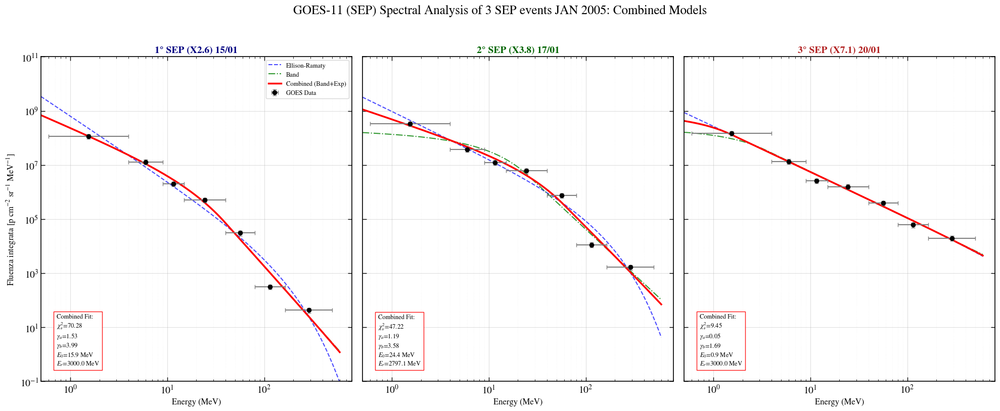

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==========================================
# 1. DEFINIZIONE FUNZIONI MATEMATICHE
# ==========================================

# 1. Ellison-Ramaty (Eq. 3)
def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** -gamma) * np.exp(-E / Er)

# 2. Band Function (Eq. 2)
def band_function(E, A, ga, gb, E0):
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E < E_break
    mask_high = ~mask_low
    
    # Parte bassa energia
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    
    # Parte alta energia
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor 
    return res

# 3. Combined Model (Eq. 4) -> Band * exp(-E/Er)
def combined_function(E, A, ga, gb, E0, Er_high):
    # Calcola la Band standard
    band = band_function(E, A, ga, gb, E0)
    # Moltiplica per il cutoff ad alta energia
    return band * np.exp(-E / Er_high)

def report_fit_stats(model_name, func, x, y, y_err, popt, pcov):
    """
    Calcola Chi-Quadro ridotto e stampa parametri con errori.
    """
    if popt is None:
        print(f"--- {model_name}: FIT FALLITO ---")
        return None

    # 1. Calcolo del Chi-Quadro (sui dati lineari)
    y_model = func(x, *popt)
    # Residui pesati: (Dati - Modello) / Errore
    residuals = (y - y_model) / y_err 
    chi_sq = np.sum(residuals**2)
    
    # Gradi di libertà (N punti - N parametri)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else np.inf

    # 2. Calcolo Errori sui Parametri (Radice della diagonale della covarianza)
    perr = np.sqrt(np.diag(pcov))

    # 3. Stampa
    print(f"\n--- {model_name} Results ---")
    print(f"Chi-Quadro Ridotto: {chi_red:.2f}")
    
    param_names = ["A", "gamma", "Er"] # Default per Ellison
    if "Band" in model_name:
        param_names = ["A", "g_a", "g_b", "E0"]
    if "Combined" in model_name:
        param_names = ["A", "g_a", "g_b", "E0", "Er_high"]

    for i, (val, err, name) in enumerate(zip(popt, perr, param_names)):
        # Stampa formattata scientifica per A, float per gli altri
        if name == "A":
            print(f"  {name} = {val:.2e} +/- {err:.2e}")
        else:
            print(f"  {name} = {val:.4f} +/- {err:.4f}")
            
    return chi_red


# Helper per fit nel log-space (Gestione robusta degli errori)
def fit_log_space(func, x, y, y_err_abs, p0, bounds=(-np.inf, np.inf)):
    def func_log(x_in, *params):
        model_y = func(x_in, *params)
        model_y = np.maximum(model_y, 1e-30) # Evita log(0)
        return np.log10(model_y)
    
    # Peso: sigma_log = sigma_y / (y * ln(10))
    sigma_log = y_err_abs / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)

    try:
        popt, pcov = curve_fit(func_log, x, np.log10(y), p0=p0, 
                               sigma=sigma_log, absolute_sigma=True, 
                               bounds=bounds, maxfev=15000)
        return popt, pcov 
    except Exception as e:
        return None, None 

# ==========================================
# 2. SETUP DATI
# ==========================================

fit_cols = ['p1_flux_c', 'p2_flux_c', 'p3_flux_c', 'p4_flux_c', 
            'p5_flux_c', 'p6_flux_c', 'p7_flux_c']

energy_bins = {
    "p1_flux_c": (0.6, 4.0),
    "p2_flux_c": (4.0, 9.0),
    "p3_flux_c": (9.0, 15.0),
    "p4_flux_c": (15.0, 40.0),
    "p5_flux_c": (40.0, 80.0),
    "p6_flux_c": (80.0, 165.0),
    "p7_flux_c": (165.0, 500.0)
}

# Calcolo energie efficaci
E_eff = {}
for col, (Emin, Emax) in energy_bins.items():
    E_eff[col] = np.sqrt(Emin * Emax)

# Array X dati (ordinato)
x_data_raw = np.array([E_eff[c] for c in fit_cols])
sort_idx = np.argsort(x_data_raw)
x_data = x_data_raw[sort_idx]

# Calcolo errori Energia 
x_err_low_raw = np.array([E_eff[c] - energy_bins[c][0] for c in fit_cols])
x_err_high_raw = np.array([energy_bins[c][1] - E_eff[c] for c in fit_cols])

x_err_low = x_err_low_raw[sort_idx]
x_err_high = x_err_high_raw[sort_idx]

x_err_combined = [x_err_low, x_err_high]


# Array X denso per plot
x_fit_plot = np.logspace(np.log10(0.5), np.log10(600), 300)

events = {
    "1° SEP (X2.6) 15/01": {"start": "2005-01-15 23:00", "end": "2005-01-17 09:30", "color": "navy"},
    "2° SEP (X3.8) 17/01": {"start": "2005-01-17 09:30", "end": "2005-01-20 06:30", "color": "darkgreen"},
    "3° SEP (X7.1) 20/01": {"start": "2005-01-20 06:50", "end": "2005-01-23 00:00", "color": "firebrick"}
}

# ==========================================
# 3. CREAZIONE GRAFICI (SUBPLOTS)
# ==========================================

# Creiamo una figura con 3 colonne
fig, axes = plt.subplots(1, 3, figsize=(20, 8), sharey=True)
axes = axes.flatten()

print("--- AVVIO ANALISI FIT ---")

for i, (evt_name, params) in enumerate(events.items()):
    ax = axes[i] 
    
    # --- 1. PREPARAZIONE DATI ---
    # Usiamo df_clean che è GIA' senza background e GIA' pulito
    t_start = pd.to_datetime(params["start"])
    t_end = pd.to_datetime(params["end"])
    
    dt_evt = df_clean.loc[t_start:t_end]
    
    fluence_diff = {}
    for col in fit_cols:
        # Calcolo dt in secondi
        dt_seconds = dt_evt.index.to_series().diff().dt.total_seconds().fillna(0)
        
        # Integrazione diretta
        # Usiamo clip per sicurezza numerica (evita valori negativi infinitesimali da interpolazione)
        flux_netto = dt_evt[col].clip(lower=1e-30) 
        
        F = (flux_netto * dt_seconds).sum()
        fluence_diff[col] = F
        
    y_data_raw = np.array([fluence_diff[c] for c in fit_cols])
    y_data = y_data_raw[sort_idx]
    
    # Calcolo Errore: 20% sistematico + floor minimo per stabilità fit
    y_err = y_data * 0.20 
    y_err = np.maximum(y_err, 1e-30) 

    # Plot dei dati sperimentali
    ax.errorbar(x_data, y_data, yerr=y_err, xerr=x_err_combined, 
                fmt='o', color='black', ecolor='gray', capsize=3, 
                label='GOES Data', zorder=10)
    
    print(f"\n{'='*40}\nEVENTO: {evt_name}\n{'='*40}")

    # --- 2. FIT ELLISON-RAMATY ---
    p0_er = [1e7, 2.0, 30.0] 
    # Bounds: Er limitato a 2000 per evitare infiniti
    bounds_er = ([0, 0, 0], [np.inf, 10, 2000])
    
    # Spacchettamento corretto: popt (parametri), pcov (covarianza)
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x_data, y_data, y_err, p0_er, bounds_er)
    
    if popt_er is not None:
        ax.plot(x_fit_plot, ellison_ramaty(x_fit_plot, *popt_er), 
                '--', color='blue', alpha=0.7, label='Ellison-Ramaty')
        report_fit_stats("Ellison-Ramaty", ellison_ramaty, x_data, y_data, y_err, popt_er, pcov_er)

    # --- 3. FIT BAND FUNCTION ---
    p0_band = [1e6, 1.0, 3.0, 10.0]
    bounds_band = ([0, 0, 0, 0], [np.inf, 10, 10, 500])
    
    popt_band, pcov_band = fit_log_space(band_function, x_data, y_data, y_err, p0_band, bounds_band)
    
    if popt_band is not None:
        ax.plot(x_fit_plot, band_function(x_fit_plot, *popt_band), 
                '-.', color='green', alpha=0.8, linewidth=1.5, label='Band')
        report_fit_stats("Band Function", band_function, x_data, y_data, y_err, popt_band, pcov_band)
    
    # --- 4. FIT COMBINED MODEL ---
    # Procediamo solo se il fit Band ha funzionato (usiamo i suoi parametri come base)
    if popt_band is not None:
        # Initial guess: prendiamo i valori di Band e aggiungiamo un cutoff alto (300 MeV)
        p0_comb = [popt_band[0], popt_band[1], popt_band[2], popt_band[3], 300.0]
        # Bounds: Er_high deve essere > 10 MeV e < 3000 MeV
        bounds_comb = ([0, 0, 0, 0, 10], [np.inf, 10, 10, 500, 3000])
        
        popt_comb, pcov_comb = fit_log_space(combined_function, x_data, y_data, y_err, p0_comb, bounds_comb)
        
        if popt_comb is not None:
            ax.plot(x_fit_plot, combined_function(x_fit_plot, *popt_comb), 
                    '-', color='red', linewidth=2.5, label='Combined (Band+Exp)')
            
            # Statistiche
            chi2_comb = report_fit_stats("Combined Model", combined_function, x_data, y_data, y_err, popt_comb, pcov_comb)
            
            # Scrittura Parametri sul Grafico
            label_text = (f"Combined Fit:\n"
                          f"$\\chi^2_\\nu$={chi2_comb:.2f}\n"
                          f"$\\gamma_a$={popt_comb[1]:.2f}\n"
                          f"$\\gamma_b$={popt_comb[2]:.2f}\n"
                          f"$E_0$={popt_comb[3]:.1f} MeV\n"
                          f"$E_r$={popt_comb[4]:.1f} MeV")
            
            ax.text(0.05, 0.05, label_text, transform=ax.transAxes, fontsize=9,
                    bbox=dict(facecolor='white', alpha=0.9, edgecolor='red'))
            
            # --- 5. ESPORTAZIONE SPENVIS (Solo se fit Combined OK) ---
            # Evitiamo di salvare se il cutoff è andato a infinito (fit degenere)
            if popt_comb[4] < 2500:
                print(f" -> Generazione file SPENVIS per {evt_name}...")
                energy_grid_spenvis = np.logspace(np.log10(0.1), np.log10(2000.0), 100)
                fluence_spenvis = combined_function(energy_grid_spenvis, *popt_comb)
                
                df_spenvis = pd.DataFrame({
                    'Energy_MeV': energy_grid_spenvis,
                    'Differential_Fluence': fluence_spenvis
                })
                
                # Nome file sicuro
                safe_evt_name = evt_name.split(')')[0].replace("(", "").replace(" ", "_").replace("°", "")
                filename = f"SPENVIS_Input_{safe_evt_name}.txt"
                
                df_spenvis.to_csv(filename, sep='\t', index=False, float_format='%.6e')
                print(f"    File salvato: {filename}")
            else:
                print(" -> SPENVIS Skip: Cutoff divergente (spettro troppo hard/PowerLaw).")
                
        else:
            print("Combined Fit fallito")
    else:
        print("Saltato Combined (Band fallita)")

    # --- STILE SUBPLOT ---
    ax.set_title(evt_name, fontsize=14, color=params["color"], fontweight='bold')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid(True, which="major", alpha=0.4)
    ax.grid(True, which="minor", alpha=0.1, linestyle=':')
    ax.set_ylim(1e-1, 1e11) # Fissiamo i limiti Y per confrontare bene i grafici
    ax.set_xlim(0.5, 800)
    ax.set_xlabel("Energy (MeV)", fontsize=12)
    
    if i == 0:
        ax.legend(loc='upper right', fontsize=9)
        ax.set_ylabel(r"Fluenza integrata [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)

# Titolo generale
plt.suptitle('GOES-11 (SEP) Spectral Analysis of 3 SEP events JAN 2005: Combined Models', fontsize=18, y=1.02)
plt.tight_layout()
plt.show()

--- AVVIO PLOTTING PROFESSIONALE CON ERRORI ---

--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 158.36
  A = 6.50e+08 +/- 1.29e+08
  gamma = 2.3933 +/- 0.0808
  Er = 81.4157 +/- 9.3274

--- Band Results ---
Chi-Quadro Ridotto: 45.48
  A = 2.48e+08 +/- 6.10e+07
  g_a = 1.5303 +/- 0.1919
  g_b = 4.0282 +/- 0.1624
  E0 = 15.9586 +/- 4.1404

--- Combined Results ---
Chi-Quadro Ridotto: 69.45
  A = 2.48e+08 +/- 6.16e+07
  g_a = 1.5292 +/- 0.2087
  g_b = 4.0023 +/- 0.7259
  E0 = 15.9472 +/- 4.5439
  Er_high = 5000.0000 +/- 127878.3829

--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 94.22
  A = 9.70e+08 +/- 1.92e+08
  gamma = 1.7365 +/- 0.0808
  Er = 73.7707 +/- 7.6580

--- Band Results ---
Chi-Quadro Ridotto: 101.56
  A = 3.00e+06 +/- 6.72e+05
  g_a = 0.0000 +/- 0.1223
  g_b = 3.7722 +/- 0.2933
  E0 = 27.1306 +/- 3.6852

--- Combined Results ---
Chi-Quadro Ridotto: 43.71
  A = 1.47e+08 +/- 3.73e+07
  g_a = 0.3773 +/- 0.2370
  g_b = 3.3719 +/- 0.5644
  E0 = 10.9447 +/- 2.8646
  Er_hig

C:\Users\stefa\AppData\Local\Temp\ipykernel_12580\3820930521.py:25: RuntimeWarning: invalid value encountered in scalar power
  norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
C:\Users\stefa\AppData\Local\Temp\ipykernel_12580\3820930521.py:25: RuntimeWarning: invalid value encountered in scalar power
  norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)


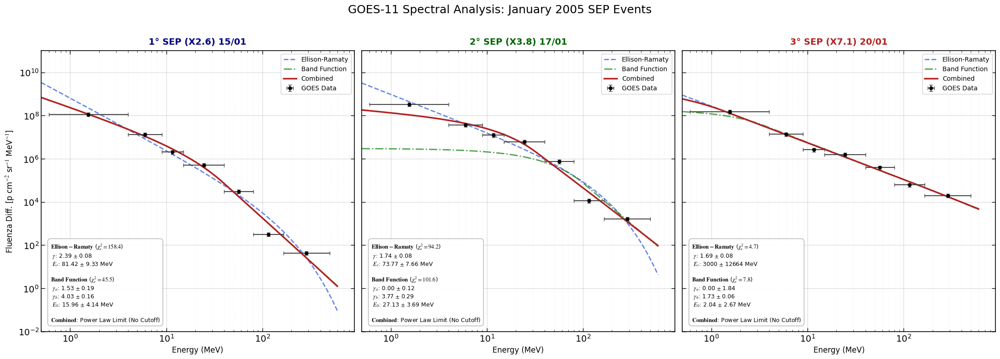

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==========================================
# 1. DEFINIZIONE FUNZIONI MATEMATICHE
# ==========================================

# 1. Ellison-Ramaty (Eq. 3)
def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** -gamma) * np.exp(-E / Er)

# 2. Band Function (Eq. 2)
def band_function(E, A, ga, gb, E0):
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E < E_break
    mask_high = ~mask_low
    
    # Parte bassa energia
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    
    # Parte alta energia
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor 
    return res

# 3. Combined Model (Eq. 4) -> Band * exp(-E/Er)
def combined_function(E, A, ga, gb, E0, Er_high):
    # Calcola la Band standard
    band = band_function(E, A, ga, gb, E0)
    # Moltiplica per il cutoff ad alta energia
    return band * np.exp(-E / Er_high)

def report_fit_stats(model_name, func, x, y, y_err, popt, pcov):
    """
    Calcola Chi-Quadro ridotto e stampa parametri con errori.
    """
    if popt is None:
        print(f"--- {model_name}: FIT FALLITO ---")
        return None

    # 1. Calcolo del Chi-Quadro (sui dati lineari)
    y_model = func(x, *popt)
    # Residui pesati: (Dati - Modello) / Errore
    residuals = (y - y_model) / y_err 
    chi_sq = np.sum(residuals**2)
    
    # Gradi di libertà (N punti - N parametri)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else np.inf

    # 2. Calcolo Errori sui Parametri (Radice della diagonale della covarianza)
    perr = np.sqrt(np.diag(pcov))

    # 3. Stampa
    print(f"\n--- {model_name} Results ---")
    print(f"Chi-Quadro Ridotto: {chi_red:.2f}")
    
    param_names = ["A", "gamma", "Er"] # Default per Ellison
    if "Band" in model_name:
        param_names = ["A", "g_a", "g_b", "E0"]
    if "Combined" in model_name:
        param_names = ["A", "g_a", "g_b", "E0", "Er_high"]

    for i, (val, err, name) in enumerate(zip(popt, perr, param_names)):
        # Stampa formattata scientifica per A, float per gli altri
        if name == "A":
            print(f"  {name} = {val:.2e} +/- {err:.2e}")
        else:
            print(f"  {name} = {val:.4f} +/- {err:.4f}")
            
    return chi_red


# Helper per fit nel log-space (Gestione robusta degli errori)
def fit_log_space(func, x, y, y_err_abs, p0, bounds=(-np.inf, np.inf)):
    def func_log(x_in, *params):
        model_y = func(x_in, *params)
        model_y = np.maximum(model_y, 1e-30) # Evita log(0)
        return np.log10(model_y)
    
    # Peso: sigma_log = sigma_y / (y * ln(10))
    sigma_log = y_err_abs / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)

    try:
        popt, pcov = curve_fit(func_log, x, np.log10(y), p0=p0, 
                               sigma=sigma_log, absolute_sigma=True, 
                               bounds=bounds, maxfev=15000)
        return popt, pcov 
    except Exception as e:
        return None, None 

# ==========================================
# 2. SETUP DATI
# ==========================================

fit_cols = ['p1_flux_c', 'p2_flux_c', 'p3_flux_c', 'p4_flux_c', 
            'p5_flux_c', 'p6_flux_c', 'p7_flux_c']

energy_bins = {
    "p1_flux_c": (0.6, 4.0),
    "p2_flux_c": (4.0, 9.0),
    "p3_flux_c": (9.0, 15.0),
    "p4_flux_c": (15.0, 40.0),
    "p5_flux_c": (40.0, 80.0),
    "p6_flux_c": (80.0, 165.0),
    "p7_flux_c": (165.0, 500.0)
}

# Calcolo energie efficaci
E_eff = {}
for col, (Emin, Emax) in energy_bins.items():
    E_eff[col] = np.sqrt(Emin * Emax)

# Array X dati (ordinato)
x_data_raw = np.array([E_eff[c] for c in fit_cols])
sort_idx = np.argsort(x_data_raw)
x_data = x_data_raw[sort_idx]

# Calcolo errori Energia 
x_err_low_raw = np.array([E_eff[c] - energy_bins[c][0] for c in fit_cols])
x_err_high_raw = np.array([energy_bins[c][1] - E_eff[c] for c in fit_cols])

x_err_low = x_err_low_raw[sort_idx]
x_err_high = x_err_high_raw[sort_idx]

x_err_combined = [x_err_low, x_err_high]


# Array X denso per plot
x_fit_plot = np.logspace(np.log10(0.5), np.log10(600), 300)

events = {
    "1° SEP (X2.6) 15/01": {"start": "2005-01-15 23:00", "end": "2005-01-17 09:30", "color": "navy"},
    "2° SEP (X3.8) 17/01": {"start": "2005-01-17 09:30", "end": "2005-01-20 06:30", "color": "darkgreen"},
    "3° SEP (X7.1) 20/01": {"start": "2005-01-20 06:50", "end": "2005-01-23 00:00", "color": "firebrick"}
}


# ==========================================
# 3. CREAZIONE GRAFICI PROFESSIONALI (PUBLICATION QUALITY)
# ==========================================
import matplotlib.patches as mpatches

# Impostazioni generali per font e stile
plt.rcParams.update({'font.size': 11, 'font.family': 'sans-serif'})

fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=True)
axes = axes.flatten()

print("--- AVVIO PLOTTING PROFESSIONALE CON ERRORI ---")

# Funzione per formattare "Valore +/- Errore"
def fmt_param(val, err, is_sci=False):
    # Usa raw f-string (rf) per evitare SyntaxWarning con LaTeX \pm
    if is_sci: 
        return rf"{val:.1e} $\pm$ {err:.1e}"
    elif val > 100 or err > 100: 
        return rf"{val:.0f} $\pm$ {err:.0f}"
    else: 
        return rf"{val:.2f} $\pm$ {err:.2f}"

for i, (evt_name, params) in enumerate(events.items()):
    ax = axes[i]
    
    # --- 1. PREPARAZIONE DATI ---
    # Usiamo df_clean (già pulito e sottratto)
    t_start = pd.to_datetime(params["start"])
    t_end = pd.to_datetime(params["end"])
    dt_evt = df_clean.loc[t_start:t_end]
    
    fluence_diff = {}
    for col in fit_cols:
        dt_seconds = dt_evt.index.to_series().diff().dt.total_seconds().fillna(0)
        flux_netto = dt_evt[col].clip(lower=1e-30)
        fluence_diff[col] = (flux_netto * dt_seconds).sum()
        
    y_data_raw = np.array([fluence_diff[c] for c in fit_cols])
    y_data = y_data_raw[sort_idx]
    
    # Errori: 20% sistematico + floor
    y_err = y_data * 0.20
    y_err = np.maximum(y_err, 1e-30)

    # --- PLOT DATI (Punti Neri) ---
    ax.errorbar(x_data, y_data, yerr=y_err, xerr=x_err_combined, 
                fmt='o', color='black', ecolor='#444444', capsize=3, markersize=5,
                label='GOES Data', zorder=10)

    # Inizializza testo per il box statistiche
    stats_text = ""
    
    # --- 2. FIT ELLISON-RAMATY ---
    p0_er = [1e7, 2.0, 30.0]
    bounds_er = ([0, 0, 0], [np.inf, 10, 3000])
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x_data, y_data, y_err, p0_er, bounds_er)
    
    if popt_er is not None:
        ax.plot(x_fit_plot, ellison_ramaty(x_fit_plot, *popt_er), 
                '--', color='royalblue', linewidth=2, alpha=0.8, label='Ellison-Ramaty')
        
        perr_er = np.sqrt(np.diag(pcov_er))
        chi_er = report_fit_stats("Ellison-Ramaty", ellison_ramaty, x_data, y_data, y_err, popt_er, pcov_er)
        
        stats_text += rf"$\bf{{Ellison-Ramaty}}$ ($\chi^2_\nu={chi_er:.1f}$)" + "\n"
        stats_text += rf" $\gamma$: {fmt_param(popt_er[1], perr_er[1])}" + "\n"
        stats_text += rf" $E_r$: {fmt_param(popt_er[2], perr_er[2])} MeV" + "\n"

    # --- 3. FIT BAND FUNCTION ---
    p0_band = [1e6, 1.0, 3.0, 10.0]
    bounds_band = ([0, 0, 0, 0], [np.inf, 10, 10, 1000])
    popt_band, pcov_band = fit_log_space(band_function, x_data, y_data, y_err, p0_band, bounds_band)
    
    if popt_band is not None:
        ax.plot(x_fit_plot, band_function(x_fit_plot, *popt_band), 
                '-.', color='forestgreen', linewidth=2, alpha=0.8, label='Band Function')
        
        perr_band = np.sqrt(np.diag(pcov_band))
        chi_band = report_fit_stats("Band", band_function, x_data, y_data, y_err, popt_band, pcov_band)
        
        stats_text += "\n" + rf"$\bf{{Band\ Function}}$ ($\chi^2_\nu={chi_band:.1f}$)" + "\n"
        stats_text += rf" $\gamma_a$: {fmt_param(popt_band[1], perr_band[1])}" + "\n"
        stats_text += rf" $\gamma_b$: {fmt_param(popt_band[2], perr_band[2])}" + "\n"
        stats_text += rf" $E_0$: {fmt_param(popt_band[3], perr_band[3])} MeV" + "\n"

    # --- 4. FIT COMBINED MODEL ---
    if popt_band is not None:
        p0_comb = [popt_band[0], popt_band[1], popt_band[2], popt_band[3], 500.0]
        bounds_comb = ([0, 0, 0, 0, 10], [np.inf, 10, 10, 500, 5000])
        popt_comb, pcov_comb = fit_log_space(combined_function, x_data, y_data, y_err, p0_comb, bounds_comb)
        
        if popt_comb is not None:
            ax.plot(x_fit_plot, combined_function(x_fit_plot, *popt_comb), 
                    '-', color='firebrick', linewidth=2.5, label='Combined')
            
            perr_comb = np.sqrt(np.diag(pcov_comb))
            chi_comb = report_fit_stats("Combined", combined_function, x_data, y_data, y_err, popt_comb, pcov_comb)
            
            # Controllo se il modello diverge (Er > 3000)
            if popt_comb[4] < 3000:
                stats_text += "\n" + rf"$\bf{{Combined}}$ ($\chi^2_\nu={chi_comb:.1f}$)" + "\n"
                stats_text += rf" $E_r$: {fmt_param(popt_comb[4], perr_comb[4])} MeV"
                
                # ESPORTAZIONE SPENVIS (Solo fit buoni)
                print(f" -> Saving SPENVIS input for {evt_name}...")
                en_grid = np.logspace(np.log10(0.1), np.log10(2000.0), 100)
                fl_sp = combined_function(en_grid, *popt_comb)
                df_sp = pd.DataFrame({'Energy': en_grid, 'Fluence': fl_sp})
                fname = f"SPENVIS_{evt_name.split()[0]}_{evt_name.split()[-1].replace('/','-')}.txt"
                df_sp.to_csv(fname, sep='\t', index=False, float_format='%.6e')
                
            else:
                stats_text += "\n" + r"$\bf{Combined}$: Power Law Limit (No Cutoff)"

    # --- STILE E LAYOUT ---
    
    # Titolo evento colorato
    ax.set_title(evt_name, fontsize=14, color=params["color"], fontweight='bold', pad=10)
    
    # Assi logaritmici e limiti
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim(0.5, 900)
    ax.set_ylim(1e-2, 1e11) # Limiti fissi per confronto visivo
    
    ax.set_xlabel("Energy (MeV)", fontsize=12)
    if i == 0:
        ax.set_ylabel(r"Fluenza Diff. [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)

    # Griglia professionale
    ax.grid(True, which="major", color='#b0b0b0', linestyle='-', alpha=0.5)
    ax.grid(True, which="minor", color='#d0d0d0', linestyle=':', alpha=0.3)
    
    # BOX INFO (Basso Sinistra)
    # bbox crea il rettangolo bianco semi-trasparente per leggere bene il testo
    ax.text(0.03, 0.03, stats_text, transform=ax.transAxes, fontsize=9,
            verticalalignment='bottom', horizontalalignment='left',
            bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.92, edgecolor='#aaaaaa'))

    # Legenda (Solo nel primo o in tutti, a scelta. Qui in tutti per chiarezza)
    ax.legend(loc='upper right', fontsize=10, framealpha=0.9)

plt.suptitle('GOES-11 Spectral Analysis: January 2005 SEP Events', fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96]) # Aggiusta margini per titolo
plt.show()

### Primo fit con power law

In [21]:
plt.close('all')

Header trovato alla riga: 166
Canali FLUSSO_PROTONI_CORRETTI trovati: ['p8_flux', 'p9_flux', 'p10_flux']


C:\Users\stefa\AppData\Local\Temp\ipykernel_12580\1430143445.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_evento[proton_cols] = df_evento[proton_cols] - bg_means
C:\Users\stefa\AppData\Local\Temp\ipykernel_12580\1430143445.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_evento[proton_cols] = df_evento[proton_cols].clip(lower=1e-30)  # Evita valori negativi o zero


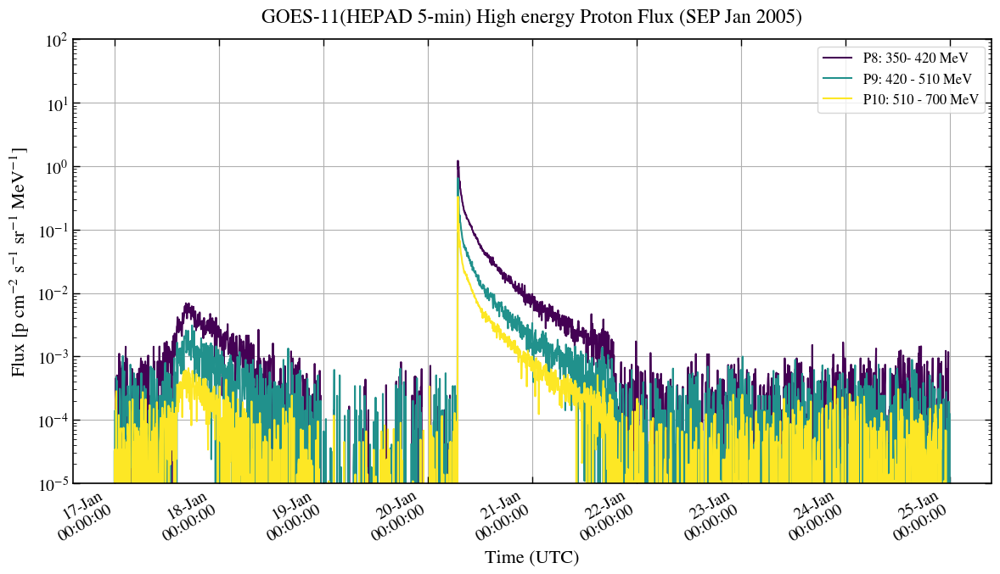

In [30]:
# STESSO EVENTO 2005 ma HEPAD 


# Analisi dati GOES-11 HEPAD  5min

import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np


#font stile paper astrophysical journal AASTeX tipo LaTeX


# 1. FONT: Usiamo STIXGeneral che è il clone perfetto di Times New Roman/LaTeX
#    (Funziona anche se non hai LaTeX installato sul PC)
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.size'] = 14       # Testo leggibile
mpl.rcParams['axes.labelsize'] = 16  # Etichette assi più grandi
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 12

# 2. TICKS (Tacchette): Verso l'interno e su tutti i lati (Top/Right mirror)
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True      # Tacchette anche sopra
mpl.rcParams['ytick.right'] = True    # Tacchette anche a destra
mpl.rcParams['xtick.major.size'] = 6  # Lunghezza tacchette maggiori
mpl.rcParams['xtick.minor.size'] = 3  # Lunghezza tacchette minori
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0

# 3. ASSI E BORDI: Più spessi per risaltare
mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['axes.grid'] = False     # Niente griglia (o True se preferisci, ma alpha bassa)

# -----------------------------------------------------------------------

file_path = "File_scaricati_eventiSEP/Evento JAN 2005/g11_hepad_5m_20050101_20050131.csv"


#Cerca dinamica header che dovrebbe partire con "time_tag" riga 455
header_line_index = 0
column_names = []

with open(file_path, "r") as f:
    for i, line in enumerate(f):
        if "time_tag" in line and "p8_flux" in line:
            header_line_index = i
            column_names = line.strip().split(",")
            break

print(f"Header trovato alla riga: {header_line_index}")


# Dataset 

df = pd.read_csv(file_path, skiprows=header_line_index + 1, header=None, names=column_names)
# quick print
#print(df.head(10))


# PULIZIA DATI

df["time_tag"] = pd.to_datetime(df["time_tag"])
df = df.set_index("time_tag")

#Nan values fix
df = df.replace(-99999, np.nan)

# Scelgo solo i canali di FLUSSO DIFFERENZIALE CORRETTI  
#float p1_flux_c(record);
#p1_flux_c:description = "P1 Proton channel 0.6 - 4.0 MeV corrected.";

proton_cols = [c for c in df.columns if c.startswith("p") and c.endswith("_flux")]

print(f"Canali FLUSSO_PROTONI_CORRETTI trovati: {proton_cols}")

# -----------------------------------------------------------------------
# -----------------------------------------------------------------------
# PLOT EVENTO 

#Etichette 
channel_map = {
    'p8_flux': 'P8: 350- 420 MeV',
    'p9_flux': 'P9: 420 - 510 MeV',
    'p10_flux': 'P10: 510 - 700 MeV',
  
}


#Event range
start = "2005-01-17"
end = "2005-01-24"
df_evento = df.loc[start:end]


# rimozione background 
start_bg = "2005-01-01 00:00"
end_bg = "2005-01-14 00:00"
bg_data = df.loc[start_bg:end_bg]
bg_means = bg_data[proton_cols].mean()
df_evento[proton_cols] = df_evento[proton_cols] - bg_means
df_evento[proton_cols] = df_evento[proton_cols].clip(lower=1e-30)  # Evita valori negativi o zero
# -----------------------------------------------------------------------



plt.figure(figsize=(12, 7))

# Usa una colormap (es. Viridis o Jet)
colors = plt.cm.viridis(np.linspace(0, 1, len(proton_cols)))

for col, color in zip(proton_cols, colors):
    label_text = channel_map.get(col, col) 
    
    plt.plot(df_evento.index, df_evento[col], 
             label=label_text, 
             color=color, 
             linewidth=1.5)

# --- 4. FORMATTAZIONE FINALE ---
plt.yscale('log')
plt.ylim(1e-5, 1e2) # Aggiusta se necessario

# Etichette assi con LaTeX
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'GOES-11(HEPAD 5-min) High energy Proton Flux (SEP Jan 2005)', pad=15)

# Formattazione asse temporale
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b\n%H:%M:%S'))
plt.gcf().autofmt_xdate()

# Legenda Stile Paper (senza box pesante, font leggermente più piccolo se serve)
plt.legend(frameon=True, loc='upper right', fontsize=12, handlelength=2)

plt.grid()
plt.tight_layout()
plt.show()

## 2 Evento SEP graduale JUL 2012


- Noto come "carrington-class event" ha mancato la terra per puro caso, solo 9 giorni 

- è stata un espulsione di massa coronale (CME) che ha colpito STEREO-A, partita dal "lato" del sole 

- STEREO-A (Solar Terrestrial Relations Observatory) è una missione NASA lanciata nel 2006 per studiare la struttura tridimensionale del Sole e del vento solare. La missione comprende due sonde spaziali identiche, STEREO-A (Ahead) e STEREO-B (Behind), che orbitano intorno al Sole in modo da fornire una visione stereoscopica delle attività solari.

- Posizione: 0.96 AU e 121° Ovest dalla terra


- Picco 23 Luglio 2012 


I dati scaricati provengono da CDAWeb STEREO-A IMPACT 

HET High Energy Telescope


DATI ESTRATTI: 

https://cdaweb.gsfc.nasa.gov/cgi-bin/eval1.cgi

Level 1 type data (not pulito)

- 3 canali di elettroni:
    E_0.7_1.4_MeV (0.7-1.4 MeV)
    E_1.4_2.8_MeV (1.4-2.8 MeV)
    E_2.8_4.0_MeV (2.8-4.0 MeV)

-11 Protoni :
    P_13.6_15.1_MeV (13.6-15.1 MeV)
    P_15.0_17.1_MeV (15.0-17.1 MeV)
    P_17.0_19.3_MeV (17.0-19.3 MeV)
    P_20.8_23.8_MeV (20.8-23.8 MeV)
    P_23.8_26.4_MeV (23.8-26.4 MeV)
    P_26.3_29.7_MeV (26.3-29.7 MeV)
    P_29.6_33.4_MeV (29.6-33.4 MeV)
    P_33.4_35.8_MeV (33.4-35.8 MeV)
    P_35.6_40.5_MeV (35.6-40.5 MeV)
    P_40_60_MeV (40-60 MeV)
    P_60_100_MeV (60-100 MeV)

In [22]:
# Analisi dati STEREO-A HET (High Energy Telescope) 1min

import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np


#font stile paper astrophysical journal AASTeX tipo LaTeX
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.size'] = 14       # Testo leggibile
mpl.rcParams['axes.labelsize'] = 16  # Etichette assi più grandi
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 12

mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True      # Tacchette anche sopra
mpl.rcParams['ytick.right'] = True    # Tacchette anche a destra
mpl.rcParams['xtick.major.size'] = 6  # Lunghezza tacchette maggiori
mpl.rcParams['xtick.minor.size'] = 3  # Lunghezza tacchette minori
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0

# 3. ASSI E BORDI: Più spessi per risaltare
mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['axes.grid'] = False    

# -----------------------------------------------------------------------

file_path = "File_scaricati_eventiSEP/Evento JUL 2012/STA_L1_HET_3553117.txt"

# Il file ha header fino a riga 50, poi 2 righe di nomi colonne, poi i dati
# I dati sono separati da whitespace multipli
# Skippiamo le righe di commento e header

# Leggiamo tutte le colonne, skippando righe che iniziano con #
df_raw = pd.read_csv(file_path, 
                     sep=r"\s+", 
                     skiprows=51, 
                     header=None,
                     comment='#',  # Salta righe che iniziano con #
                     on_bad_lines='skip')  # Salta righe malformate

print(f"Numero totale colonne: {len(df_raw.columns)}")
print(f"Numero totale righe: {len(df_raw)}")

# Combina data e tempo (colonne 0 e 1)
df_raw['timestamp'] = pd.to_datetime(df_raw[0] + ' ' + df_raw[1], format='%d-%m-%Y %H:%M:%S.%f')

# Estrai solo le colonne che ci servono:
# Colonne 2-4: Elettroni (3 canali)
# Colonne 7-17: Protoni (11 canali) - i primi 11 protoni sono quelli che ci servono
df = pd.DataFrame()
df['EPOCH'] = df_raw['timestamp']

# Elettroni
df['E_0.7_1.4_MeV'] = df_raw[2].values
df['E_1.4_2.8_MeV'] = df_raw[3].values
df['E_2.8_4.0_MeV'] = df_raw[4].values

# Protoni (canali 7-17 sono indici 7-17 nel dataframe originale)
df['P_13.6_15.1_MeV'] = df_raw[7].values
df['P_15.0_17.1_MeV'] = df_raw[8].values
df['P_17.0_19.3_MeV'] = df_raw[9].values
df['P_20.8_23.8_MeV'] = df_raw[10].values
df['P_23.8_26.4_MeV'] = df_raw[11].values
df['P_26.3_29.7_MeV'] = df_raw[12].values
df['P_29.6_33.4_MeV'] = df_raw[13].values
df['P_33.4_35.8_MeV'] = df_raw[14].values
df['P_35.6_40.5_MeV'] = df_raw[15].values
df['P_40_60_MeV'] = df_raw[16].values
df['P_60_100_MeV'] = df_raw[17].values

print(f"Dataset caricato: {len(df)} righe")
print(df.head())

# PULIZIA DATI

# Imposta EPOCH come indice
df = df.set_index('EPOCH')

# Sostituisci valori 0.0 con NaN (valori non fisici)
df = df.replace(0.0, np.nan)

print(f"\nColonne disponibili:\n{df.columns.tolist()}")


Numero totale colonne: 44
Numero totale righe: 14400
Dataset caricato: 14400 righe
                EPOCH  E_0.7_1.4_MeV  E_1.4_2.8_MeV  E_2.8_4.0_MeV  \
0 2012-07-21 00:00:58       0.433679       0.256265       0.022998   
1 2012-07-21 00:01:58       0.631456       0.256529       0.092087   
2 2012-07-21 00:02:58       0.671847       0.177842       0.092214   
3 2012-07-21 00:03:58       0.513942       0.355806       0.069184   
4 2012-07-21 00:04:58       0.908656       0.276548       0.092183   

   P_13.6_15.1_MeV  P_15.0_17.1_MeV  P_17.0_19.3_MeV  P_20.8_23.8_MeV  \
0         0.022998         0.671787         0.377516         0.249807   
1         0.092087         0.563429         0.247593         0.202433   
2         0.092214         0.673407         0.443673         0.238485   
3         0.069184         0.710052         0.404664         0.166997   
4         0.092183         0.600399         0.430475         0.083441   

   P_23.8_26.4_MeV  P_26.3_29.7_MeV  P_29.6_33.4_MeV  P_3

Canali protoni trovati: 11
['P_13.6_15.1_MeV', 'P_15.0_17.1_MeV', 'P_17.0_19.3_MeV', 'P_20.8_23.8_MeV', 'P_23.8_26.4_MeV', 'P_26.3_29.7_MeV', 'P_29.6_33.4_MeV', 'P_33.4_35.8_MeV', 'P_35.6_40.5_MeV', 'P_40_60_MeV', 'P_60_100_MeV']


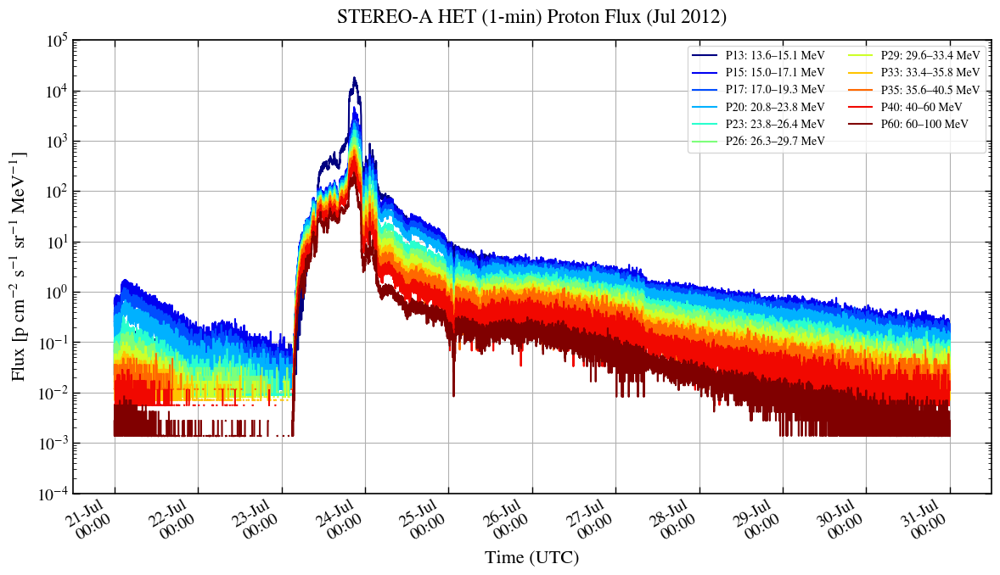

C:\Users\stefa\AppData\Local\Temp\ipykernel_11548\2245002034.py:62: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_hourly = df.resample('1H').mean()



Dataset mediato su 1h: 240 righe


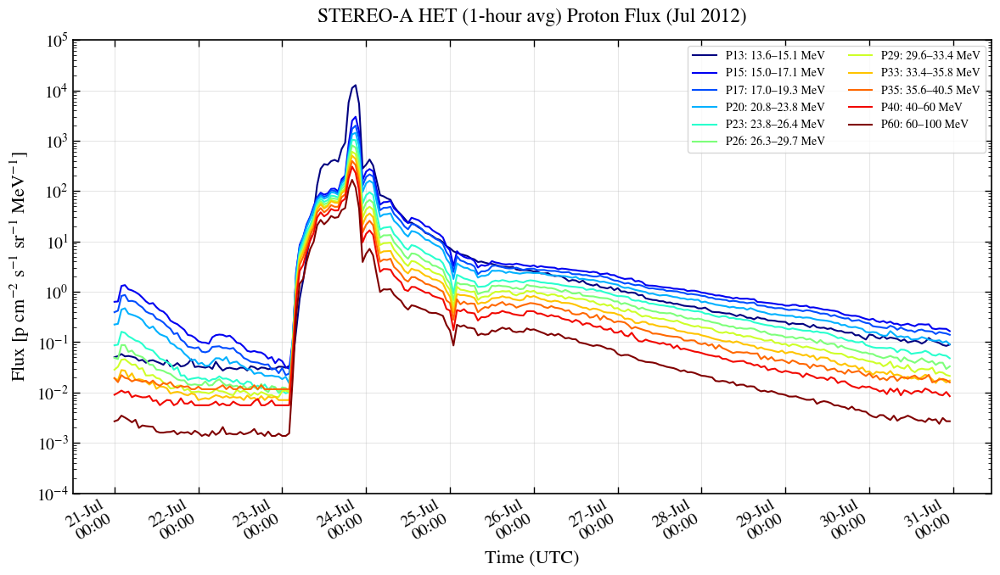

In [27]:
# PLOT EVENTO STEREO-A JUL 2012

# Seleziona solo le colonne protoniche
proton_cols = [c for c in df.columns if c.startswith('P_')]

# Etichette leggibili per la legenda
channel_map = {
    'P_13.6_15.1_MeV': 'P13: 13.6–15.1 MeV',
    'P_15.0_17.1_MeV': 'P15: 15.0–17.1 MeV',
    'P_17.0_19.3_MeV': 'P17: 17.0–19.3 MeV',
    'P_20.8_23.8_MeV': 'P20: 20.8–23.8 MeV',
    'P_23.8_26.4_MeV': 'P23: 23.8–26.4 MeV',
    'P_26.3_29.7_MeV': 'P26: 26.3–29.7 MeV',
    'P_29.6_33.4_MeV': 'P29: 29.6–33.4 MeV',
    'P_33.4_35.8_MeV': 'P33: 33.4–35.8 MeV',
    'P_35.6_40.5_MeV': 'P35: 35.6–40.5 MeV',
    'P_40_60_MeV': 'P40: 40–60 MeV',
    'P_60_100_MeV': 'P60: 60–100 MeV',
}

print(f"Canali protoni trovati: {len(proton_cols)}")
print(proton_cols)

# Event range
start = "2012-07-21"
end = "2012-07-30"
df_evento = df.loc[start:end]

plt.figure(figsize=(12, 7))

# Usa una colormap
colors = plt.cm.jet(np.linspace(0, 1, len(proton_cols)))

for col, color in zip(proton_cols, colors):
    label_text = channel_map.get(col, col)
    plt.plot(df_evento.index, df_evento[col], 
             label=label_text, 
             color=color, 
             linewidth=1.5)

# Formattazione
plt.yscale('log')
plt.ylim(1e-4, 1e5)

plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'STEREO-A HET (1-min) Proton Flux (Jul 2012)', pad=15)

# Formattazione asse temporale
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b\n%H:%M'))
plt.gcf().autofmt_xdate()

plt.legend(frameon=True, loc='best', fontsize=10, ncol=2, handlelength=2)
plt.grid()
plt.tight_layout()
plt.show()


# Media su 1h invece che 1min


df_hourly = df.resample('1H').mean()
print(f"\nDataset mediato su 1h: {len(df_hourly)} righe")
# PLOT EVENTO STEREO-A JUL 2012 - 1h media
df_evento_hourly = df_hourly.loc[start:end]
plt.figure(figsize=(12, 7))
# Usa una colormap
colors = plt.cm.jet(np.linspace(0, 1, len(proton_cols)))
for col, color in zip(proton_cols, colors):
    label_text = channel_map.get(col, col)
    plt.plot(df_evento_hourly.index, df_evento_hourly[col], 
             label=label_text, 
             color=color, 
             linewidth=1.5)
# Formattazione
plt.yscale('log')
plt.ylim(1e-4, 1e5)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'STEREO-A HET (1-hour avg) Proton Flux (Jul 2012)', pad=15)
# Formattazione asse temporale
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b\n%H:%M'))
plt.gcf().autofmt_xdate()
plt.legend(frameon=True, loc='best', fontsize=10, ncol=2, handlelength=2)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()








[3600960] Numero totale colonne: 44
[3600960] Numero totale righe: 18626
[3600960] Dataset caricato: 18626 righe
[3600960] Range temporale: 2012-07-19 00:01:58 → 2012-07-31 23:59:57
                     E_0.7_1.4_MeV  E_1.4_2.8_MeV  E_2.8_4.0_MeV  \
EPOCH                                                              
2012-07-19 00:01:58       0.354584       0.059097            NaN   
2012-07-19 00:02:58       0.157647       0.098530       0.045980   
2012-07-19 00:03:58       0.315403       0.078851       0.068994   

                     P_13.6_15.1_MeV  P_15.0_17.1_MeV  P_17.0_19.3_MeV  \
EPOCH                                                                    
2012-07-19 00:01:58              NaN         0.127008         0.130089   
2012-07-19 00:02:58         0.045980         0.235952         0.130133   
2012-07-19 00:03:58         0.068994         0.127095         0.130178   

                     P_20.8_23.8_MeV  P_23.8_26.4_MeV  P_26.3_29.7_MeV  \
EPOCH                           

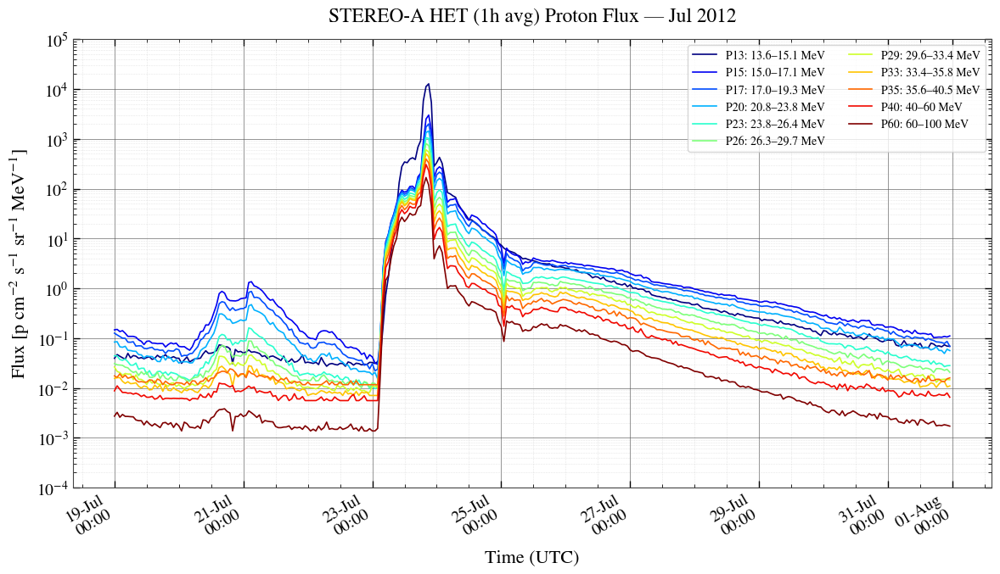

In [ ]:
# Analisi STEREO-A HET per il file STA_L1_HET_3600960.txt

file_path2 = "File_scaricati_eventiSEP/Evento JUL 2012/STA_L1_HET_3600960.txt"

# Leggiamo il file (skiprows=54 per saltare tutte le linee di header)
# La riga 54 contiene "dd-mm-yyyy hh:mm:ss.ms" quindi i dati iniziano da riga 55
df2_raw = pd.read_csv(file_path2,
                      sep=r"\s+",
                      skiprows=54,  # Salta fino alla riga con il formato data/ora
                      header=None,
                      comment='#',
                      on_bad_lines='skip')

print(f"[3600960] Numero totale colonne: {len(df2_raw.columns)}")
print(f"[3600960] Numero totale righe: {len(df2_raw)}")

# Costruisco timestamp da colonne 0 e 1 (formato dd-mm-yyyy hh:mm:ss.ms)
df2_raw['timestamp'] = pd.to_datetime(df2_raw[0] + ' ' + df2_raw[1], 
                                       format='%d-%m-%Y %H:%M:%S.%f', 
                                       errors='coerce')

# Estrai le colonne di interesse:
df2 = pd.DataFrame()
df2['EPOCH'] = df2_raw['timestamp']

# Elettroni (colonne 2-4)
df2['E_0.7_1.4_MeV'] = df2_raw[2].values
df2['E_1.4_2.8_MeV'] = df2_raw[3].values
df2['E_2.8_4.0_MeV'] = df2_raw[4].values

# Protoni (colonne 7-17)
df2['P_13.6_15.1_MeV'] = df2_raw[7].values
df2['P_15.0_17.1_MeV'] = df2_raw[8].values
df2['P_17.0_19.3_MeV'] = df2_raw[9].values
df2['P_20.8_23.8_MeV'] = df2_raw[10].values
df2['P_23.8_26.4_MeV'] = df2_raw[11].values
df2['P_26.3_29.7_MeV'] = df2_raw[12].values
df2['P_29.6_33.4_MeV'] = df2_raw[13].values
df2['P_33.4_35.8_MeV'] = df2_raw[14].values
df2['P_35.6_40.5_MeV'] = df2_raw[15].values
df2['P_40_60_MeV'] = df2_raw[16].values
df2['P_60_100_MeV'] = df2_raw[17].values

# Imposta indice temporale e sostituisci zeri con NaN
df2 = df2.set_index('EPOCH')
df2 = df2.replace(0.0, np.nan)

# Rimuovi righe con timestamp invalidi e ordina cronologicamente
df2 = df2[df2.index.notna()].sort_index()

print(f"[3600960] Dataset caricato: {len(df2)} righe")
print(f"[3600960] Range temporale: {df2.index.min()} → {df2.index.max()}")
print(df2.head(3))

# Preparazione per il plot
proton_cols2 = [c for c in df2.columns if c.startswith('P_')]
print(f"[3600960] Canali protoni: {len(proton_cols2)}")

# Mappa etichette per la legenda
channel_map_stereo_protons = {
    'P_13.6_15.1_MeV': 'P13: 13.6–15.1 MeV',
    'P_15.0_17.1_MeV': 'P15: 15.0–17.1 MeV',
    'P_17.0_19.3_MeV': 'P17: 17.0–19.3 MeV',
    'P_20.8_23.8_MeV': 'P20: 20.8–23.8 MeV',
    'P_23.8_26.4_MeV': 'P23: 23.8–26.4 MeV',
    'P_26.3_29.7_MeV': 'P26: 26.3–29.7 MeV',
    'P_29.6_33.4_MeV': 'P29: 29.6–33.4 MeV',
    'P_33.4_35.8_MeV': 'P33: 33.4–35.8 MeV',
    'P_35.6_40.5_MeV': 'P35: 35.6–40.5 MeV',
    'P_40_60_MeV': 'P40: 40–60 MeV',
    'P_60_100_MeV': 'P60: 60–100 MeV',
}

# Range evento (file più ampio: 19 luglio – 31 luglio 2012)
start = "2012-07-19"
end = "2012-08-03"
df2_window = df2.loc[start:end]



print(f"[3600960] Finestra {start} → {end}: {len(df2_window)} righe → {len(df2_hourly)} righe orarie")

# PLOT
plt.figure(figsize=(12, 7))
colors = plt.cm.jet(np.linspace(0, 1, len(proton_cols2)))

for col, color in zip(proton_cols2, colors):
    label_text = channel_map_stereo_protons.get(col, col)
    plt.plot(df2_window.index, df2_window[col],
             label=label_text,
             color=color,
             linewidth=1.2)

plt.yscale('log')
plt.ylim(1e-4, 1e5)

plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'STEREO-A HET (1h avg) Proton Flux — Jul 2012', pad=15)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b\n%H:%M'))
plt.gcf().autofmt_xdate()

plt.legend(frameon=True, loc='best', fontsize=10, ncol=2, handlelength=2)
ax = plt.gca()
ax.minorticks_on()
ax.grid(which='major', linestyle='-', linewidth=0.6, color='0.35', alpha=0.75)
ax.grid(which='minor', linestyle='--', linewidth=0.4, color='0.7', alpha=0.35)
# subtle spine styling for a cleaner, more professional look
for spine in ax.spines.values():
    spine.set_edgecolor('#444444')
    spine.set_linewidth(0.8)
plt.tight_layout()
plt.show()


C:\Users\stefa\AppData\Local\Temp\ipykernel_11548\632192577.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  df2_minute = df2_window.resample('1T').mean()


[3600960] Finestra 2012-07-19 → 2012-08-03: 18626 righe → 18719 righe 1-min


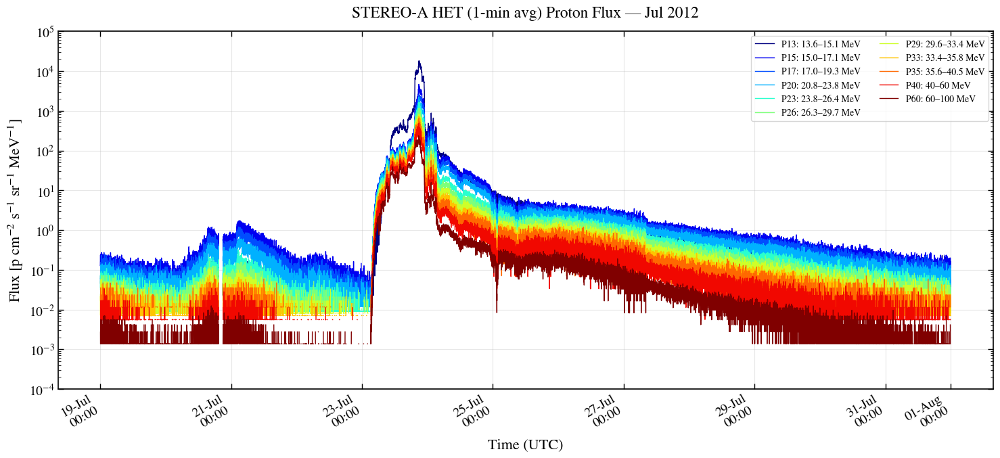

In [31]:
# 1 min data

df2_minute = df2_window.resample('1T').mean()
print(f"[3600960] Finestra {start} → {end}: {len(df2_window)} righe → {len(df2_minute)} righe 1-min")
# PLOT 1 min
plt.figure(figsize=(15, 7))
colors = plt.cm.jet(np.linspace(0, 1, len(proton_cols2)))
for col, color in zip(proton_cols2, colors):
    label_text = channel_map_stereo_protons.get(col, col)
    plt.plot(df2_minute.index, df2_minute[col],
             label=label_text,
             color=color,
             linewidth=1.0)
plt.yscale('log')
plt.ylim(1e-4, 1e5)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'STEREO-A HET (1-min avg) Proton Flux — Jul 2012', pad=15)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b\n%H:%M'))
plt.gcf().autofmt_xdate()
plt.legend(frameon=True, loc='best', fontsize=10, ncol=2, handlelength=2)
plt.grid(alpha=0.3)
plt.tight_layout()
#plt.show()



## EVENTO MISTO OCT 2003


Nota come la halloween storm, è un evento con fluenza enorme e durata prolungata, è il riferi,ento per esposizione a flusso duraturo --> quindi degrado cumulativo per la TID

- Serie di eventi multipli, flare di classe X (X28 uno dei più intensi mai registrati)
- Serie di CME multiple sovrapposte

Ha danneggiato permanentemente alla memoria dello strumento lo strumento MARIE (Martian Radiation Environment Experiment) sulla sonda Mars Odyssey in orbita marziana

DATI:

- GOES 11 (EPS)  AVG 5min 
    Proton flux corrected 

- Longitudine Solare della sonda in quel momento : 



DURATA EVENTO: 

- Start:  2003/10/26  
- Peak: 28 29 2 4 
- End:   2003/11/07






In [ ]:
# 1. FONT: Usiamo STIXGeneral che è il clone perfetto di Times New Roman/LaTeX
#    (Funziona anche se non hai LaTeX installato sul PC)
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.size'] = 14       # Testo leggibile
mpl.rcParams['axes.labelsize'] = 16  # Etichette assi più grandi
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 12

# 2. TICKS (Tacchette): Verso l'interno e su tutti i lati (Top/Right mirror)
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True      # Tacchette anche sopra
mpl.rcParams['ytick.right'] = True    # Tacchette anche a destra
mpl.rcParams['xtick.major.size'] = 6  # Lunghezza tacchette maggiori
mpl.rcParams['xtick.minor.size'] = 3  # Lunghezza tacchette minori
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0

# 3. ASSI E BORDI: Più spessi per risaltare
mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['axes.grid'] = False     # Niente griglia (o True se preferisci, ma alpha bassa)

# -----------------------------------------------------------------------


Range dati uniti: 2003-10-01 00:00:00 → 2003-11-30 23:55:00
Finestra plot: 2003-10-26 → 2003-11-11; righe: 8064


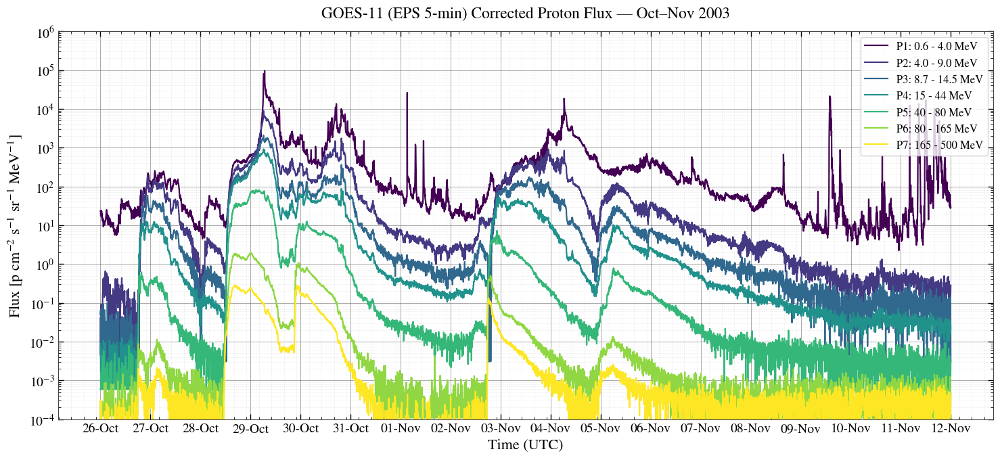

In [197]:
# GOES-11 EPS OCT–NOV 2003: merge due mesi + ticks giornalieri

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Helper per leggere un file GOES EPS con header dinamico
def read_goes_eps_csv(path):
    header_line_index = 0
    column_names = []
    with open(path, "r") as f:
        for i, line in enumerate(f):
            if "time_tag" in line and "p1_flux" in line:
                header_line_index = i
                column_names = line.strip().split(",")
                break
    df_local = pd.read_csv(path, skiprows=header_line_index + 1, header=None, names=column_names)
    df_local["time_tag"] = pd.to_datetime(df_local["time_tag"], errors='coerce')
    df_local = df_local.set_index("time_tag").replace(-99999, np.nan)
    df_local = df_local[df_local.index.notna()].sort_index()
    return df_local

# Percorsi mensili
path_oct = "File_scaricati_eventiSEP/Evento OCT 2003/g11_eps_5m_20031001_20031031.csv"
path_nov = "File_scaricati_eventiSEP/Evento OCT 2003/g11_eps_5m_20031101_20031130.csv"

# Carica e unisci
try:
    df_oct = read_goes_eps_csv(path_oct)
    df_nov = read_goes_eps_csv(path_nov)
    df_octnov = pd.concat([df_oct, df_nov], axis=0).sort_index()
except FileNotFoundError as e:
    print(f"File mancante: {e}")
    # fallback: usa solo ottobre se novembre non presente
    df_octnov = read_goes_eps_csv(path_oct)

# Selezione canali protoni corretti
proton_cols = [c for c in df_octnov.columns if c.startswith("p") and c.endswith("_flux_c")]
channel_map = {
    'p1_flux_c': 'P1: 0.6 - 4.0 MeV',
    'p2_flux_c': 'P2: 4.0 - 9.0 MeV',
    'p3_flux_c': 'P3: 8.7 - 14.5 MeV',
    'p4_flux_c': 'P4: 15 - 44 MeV',
    'p5_flux_c': 'P5: 40 - 80 MeV',
    'p6_flux_c': 'P6: 80 - 165 MeV',
    'p7_flux_c': 'P7: 165 - 500 MeV'
}

# Finestra evento richiesta (fine in novembre 2003)
start = "2003-10-26"
end = "2003-11-11"
df_evento = df_octnov.loc[start:end]

print(f"Range dati uniti: {df_octnov.index.min()} → {df_octnov.index.max()}")
print(f"Finestra plot: {start} → {end}; righe: {len(df_evento)}")

plt.figure(figsize=(15, 7))
colors = plt.cm.viridis(np.linspace(0, 1, len(proton_cols)))
for col, color in zip(proton_cols, colors):
    label_text = channel_map.get(col, col)
    plt.plot(df_evento.index, df_evento[col],
             label=label_text,
             color=color,
             linewidth=1.6)

plt.yscale('log')
plt.ylim(1e-4, 1e6)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'GOES-11 (EPS 5-min) Corrected Proton Flux — Oct–Nov 2003', pad=15)

# Ticks giornalieri ben leggibili + minor ogni 6 ore
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
ax.xaxis.set_minor_locator(mdates.HourLocator(interval=6))

# Griglia più chiara
ax.grid(which='major', linestyle='-', linewidth=0.6, color='0.35', alpha=0.6)
ax.grid(which='minor', linestyle='--', linewidth=0.4, color='0.7', alpha=0.3)
for spine in ax.spines.values():
    spine.set_edgecolor('#444444')
    spine.set_linewidth(0.8)

plt.tight_layout()
plt.legend(frameon=True, loc='upper right', fontsize=12, handlelength=2)
plt.show()

"L'evento è stato talmente estremo da causare la saturazione dei sensori GOES (visibile come irregolarità al picco del 28 Ottobre). Questo implica che la dose calcolata usando questi dati grezzi è una stima conservativa al ribasso (lower bound). La dose reale assorbita dalla sonda sarebbe stata ancora più alta."

C:\Users\stefa\AppData\Local\Temp\ipykernel_9852\3694817845.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_hourly = df_evento.resample('1H').mean()


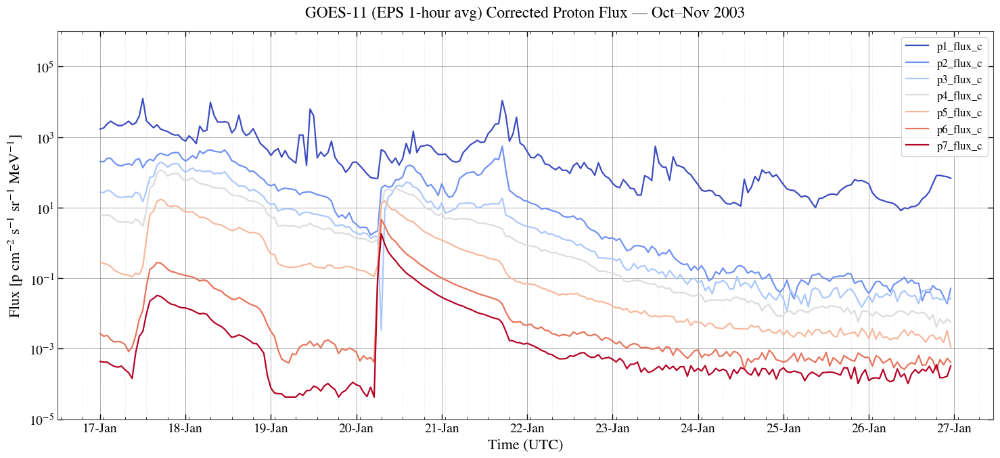

In [208]:
#1h average 

df_hourly = df_evento.resample('1H').mean()

plt.figure(figsize=(15, 7))
colors = plt.cm.coolwarm(np.linspace(0, 1, len(proton_cols)))
for col, color in zip(proton_cols, colors):
    label_text = channel_map.get(col, col)
    plt.plot(df_hourly.index, df_hourly[col],
             label=label_text,
             color=color,
             linewidth=1.6)
plt.yscale('log')
plt.ylim(1e-5, 1e6)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'GOES-11 (EPS 1-hour avg) Corrected Proton Flux — Oct–Nov 2003', pad=15)
# Ticks giornalieri ben leggibili + minor ogni 6 ore
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
ax.xaxis.set_minor_locator(mdates.HourLocator(interval=6))
# Griglia più chiara
ax.grid(which='major', linestyle='-', linewidth=0.6, color='0.35', alpha=0.6)
ax.grid(which='minor', linestyle='--', linewidth=0.4, color='0.7', alpha=0.3)
for spine in ax.spines.values():
    spine.set_edgecolor('#444444')
    spine.set_linewidth(0.8)
plt.tight_layout()
plt.legend(frameon=True, loc='upper right', fontsize=12, handlelength=2)
plt.show()
plt.close()

# -----------------------------------------------------------------------


In [209]:
plt.close('all')

## EVENTO Cumulativo MAY 2024 

Evento di maggio 2024 uno dei più intendi del ciclo solare 25 è rappresentativo di cumulative SEP events

- Serie di flare classe X e CME multiple in rapida successione 

- Sulla terra è stata misurata una tempesta geomagnetica G5 


DATI:
https://www.ncei.noaa.gov/access/metadata/landing-page/bin/iso?id=gov.noaa.ncei.swx:seis-l2-goesr
https://www.ncei.noaa.gov/products/goes-r-space-environment-in-situ


https://data.ngdc.noaa.gov/platforms/solar-space-observing-satellites/goes/



Directory CDAweb:
https://data.ngdc.noaa.gov/platforms/solar-space-observing-satellites/goes/goes18/l2/data/sgps-l2-avg5m/2024/05/

- Satellitit operativo GOES 16 e 18 
- Strumento SEISS (Space Environment In Situ Suite) 
- Sensore SGPS (SOlar and Galactic proton sensor)


Two Solar and Galactic Proton Sensor (SGPS) units, west- and east-facing, observe solar energetic protons and alpha particle (helium-4 nuclei) fluxes. Each SGPS observes 1-500 MeV protons (plus an integral >500 MeV channel) and 3.8-894 MeV alpha particles.

The Space Environment In-Situ Suite (SEISS) is comprised of four sensors that monitor proton, electron, and heavy ion fluxes in the magnetosphere. These four sensors are the Energetic Heavy Ion Sensor (EHIS), the Magnetospheric Particle Sensors - High and Low (MPS-HI and MPS-LO), and the Solar and Galactic Proton Sensor (SGPS). There are two SGPS units on each satellite, one looking westward and one looking eastward. SEISS L2 data are used by NOAA’s Space Weather Prediction Center to drive the solar radiation storm alerts, based on NOAA’s space weather scales and the >2 MeV electron radiation belt alert, and to improve energetic particle forecasts.
These SEISS Level 2 (L2) data include several different products: one and five-minute averages of fluxes from MPS-HI, MPS-LO and SGPS; one and five-minute integral fluxes from SGPS; density and temperature moments from MPS-HI and MPS-LO; solar particle event detection and rate of rise; and linear energy transfer from EHIS heavy ions. Data are in netCDF-4 format.


DATA EVENTO:

- Start = 2024/05/07
- Peak = 10 11 12 Maggio festa della mamma
- End = 2024/05/15 
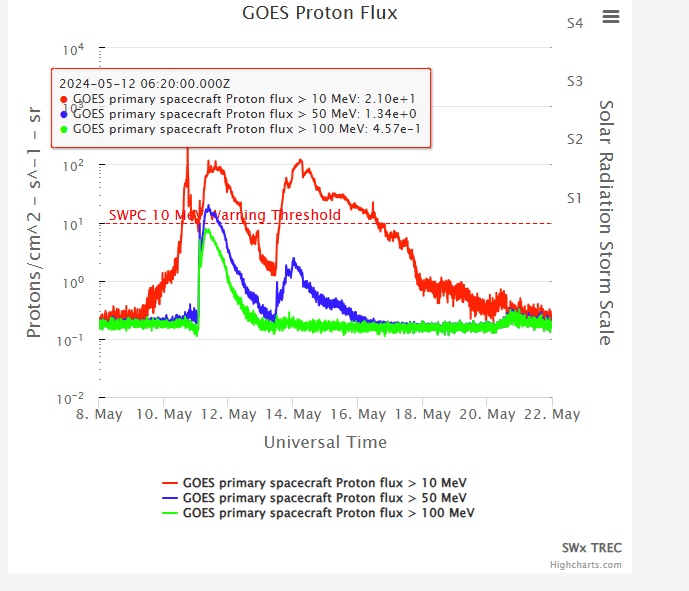

In [1]:
pip install xarray netCDF4


Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   ---------------------------------------- 1.4/1.4 MB 11.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/7.1 MB ? eta -:--:--
   -------------- ------------------------- 2.6/7.1 MB 13.2 MB/s eta 0:00:01
   ------------------------------ --------- 5.5/7.1 MB 12.9 MB/s eta 0:00:01
   ---------------------------------------- 7.1/7.1 MB 12.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:

#font stile paper astrophysical journal AASTeX tipo LaTeX


# 1. FONT: Usiamo STIXGeneral che è il clone perfetto di Times New Roman/LaTeX
#    (Funziona anche se non hai LaTeX installato sul PC)
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.size'] = 14       # Testo leggibile
mpl.rcParams['axes.labelsize'] = 16  # Etichette assi più grandi
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 12

# 2. TICKS (Tacchette): Verso l'interno e su tutti i lati (Top/Right mirror)
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True      # Tacchette anche sopra
mpl.rcParams['ytick.right'] = True    # Tacchette anche a destra
mpl.rcParams['xtick.major.size'] = 6  # Lunghezza tacchette maggiori
mpl.rcParams['xtick.minor.size'] = 3  # Lunghezza tacchette minori
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0

# 3. ASSI E BORDI: Più spessi per risaltare
mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['axes.grid'] = False     # Niente griglia (o True se preferisci, ma alpha bassa)

🔎 Cerco file in: File_scaricati_eventiSEP\Evento MAY 2024\*.nc
✅ Trovati 14 file. Unione manuale in corso...
Righe grezze totali: 576576
Righe pulite (senza duplicati): 52416
Righe grezze totali: 576576
Righe pulite (senza duplicati): 52416


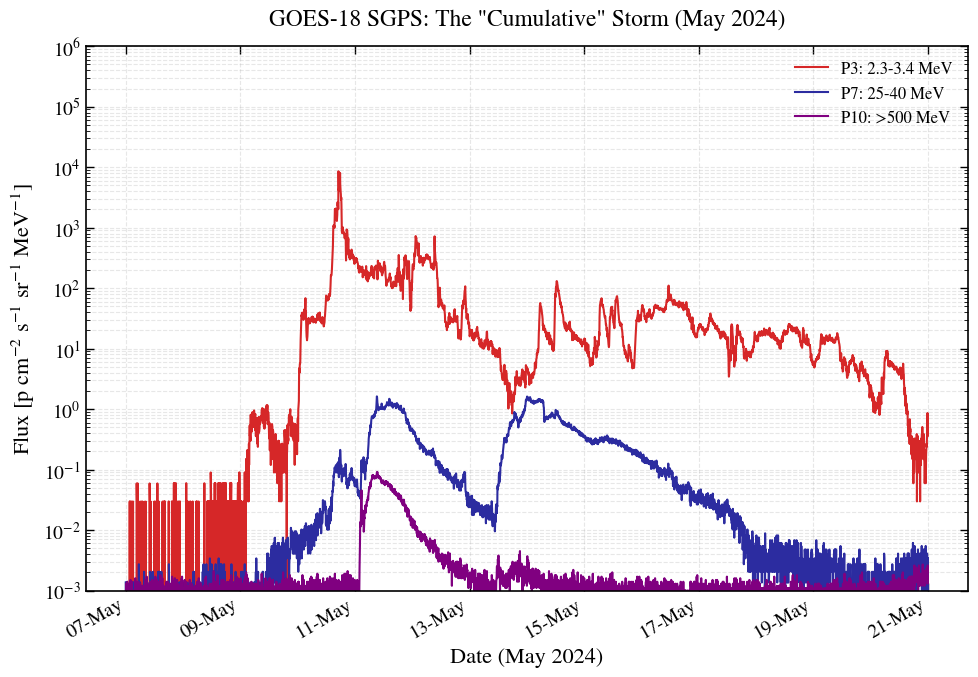

In [ ]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import glob
import numpy as np
import matplotlib as mpl
import os

# =============================================================================
# 1. CONFIGURAZIONE STILE "PAPER" (AASTeX / LaTeX Style)
# =============================================================================

# FONT: Usiamo STIXGeneral (clone di Times New Roman per equazioni LaTeX)
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.size'] = 14       
mpl.rcParams['axes.labelsize'] = 16  
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 12

# TICKS (Tacchette): Verso l'interno e su tutti i lati
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True      
mpl.rcParams['ytick.right'] = True    
mpl.rcParams['xtick.major.size'] = 6  
mpl.rcParams['xtick.minor.size'] = 3  
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0

# ASSI E BORDI: Più spessi per risaltare, niente griglia di default
mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['axes.grid'] = False     

# =============================================================================
# 2. RICERCA FILE E CARICAMENTO
# =============================================================================
folder_path = os.path.join("File_scaricati_eventiSEP", "Evento MAY 2024")
search_pattern = os.path.join(folder_path, "*.nc")

print(f"🔎 Cerco file in: {search_pattern}")
files = sorted(glob.glob(search_pattern))

if not files:
    print("❌ ERRORE: Nessun file trovato! Controlla il percorso.")
else:
    print(f"✅ Trovati {len(files)} file. Unione manuale in corso...")

    dataframes_list = []
    
    # Ciclo manuale per evitare errori Dask
    for f in files:
        try:
            with xr.open_dataset(f) as ds:
                df_temp = ds.to_dataframe()
                df_temp.reset_index(inplace=True)
                
                # Ottimizzazione: teniamo solo il flusso protoni e sensore Ovest (unit 0)
                if 'AvgDiffProtonFlux' in df_temp.columns:
                    df_temp = df_temp[df_temp['sensor_units'] == 0].copy()
                    dataframes_list.append(df_temp)
        except Exception as e:
            print(f"⚠️ Salto {os.path.basename(f)}: {e}")

    if dataframes_list:
        # Unione di tutti i DataFrame giornalieri
        df_proton = pd.concat(dataframes_list, ignore_index=True)
        print(f"Righe grezze totali: {len(df_proton)}")

        # --- CORREZIONE DUPLICATI ---
        # Fondamentale per file giornalieri che si sovrappongono a mezzanotte
        df_proton = df_proton.drop_duplicates(subset=['time', 'diff_channels'], keep='first')
        print(f"Righe pulite (senza duplicati): {len(df_proton)}")

        # =============================================================================
        # 3. ELABORAZIONE E PLOT
        # =============================================================================
        try:
            # Pivot: Canali in colonne
            df_pivot = df_proton.pivot(index='time', columns='diff_channels', values='AvgDiffProtonFlux')

            # CONVERSIONE UNITÀ: keV -> MeV (x1000)
            df_pivot = df_pivot * 1000.0

            # Mappa Canali (GOES-R Series SGPS)
            channel_labels = {
                0: 'P1: 1-1.9 MeV',
                2: 'P3: 2.3-3.4 MeV',
                6: 'P7: 25-40 MeV',
                8: 'P9: 83-160 MeV',
                9: 'P10: >500 MeV'
            }


# Plot canali protoni 
            proton_cols = list(channel_labels.keys())
            df = df_pivot[proton_cols].copy()
            df.index = pd.to_datetime(df.index)

            print(f"Canali protoni disponibili: {df.columns.tolist()}")
            # Finestra evento: Maggio 2024
            start = "2024-05-01"
            end = "2024-05-15"
            df_evento = df.loc[start:end]
            print(f"Finestra evento: {start} → {end}; righe: {len(df_evento)}")
            plt.figure(figsize=(15, 7))
            colors = plt.cm.plasma(np.linspace(0, 1, len(proton_cols)))
            for col, color in zip(proton_cols, colors):
                label_text = channel_labels.get(col, f'Channel {col}')
                plt.plot(df_evento.index, df_evento[col], 
                         label=label_text, 
                         color=color, 
                         linewidth=1.6)
            # Formattazione
            plt.yscale('log')
            plt.ylim(1e-4, 1e6)
            plt.xlabel("Data")
            plt.ylabel("Flusso protoni (MeV/cm²·s·sr·MeV)")
            plt.title("Flusso protoni - Evento Maggio 2024")
            plt.legend()
            plt.grid(True, which="both", ls="--", linewidth=0.5)
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"❌ ERRORE durante l'elaborazione o il plot: {e}")
            

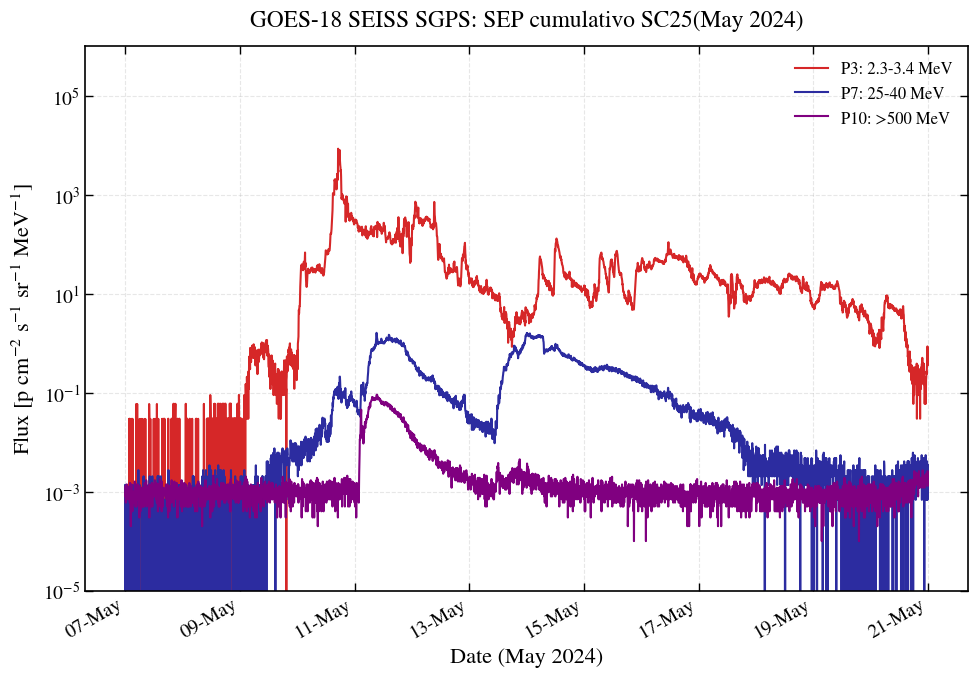

In [10]:
try:
    # --- PLOT ---
    plt.figure(figsize=(10, 7))  # Dimensioni tipiche da paper

    target_chans = [2, 6, 9]
    # Colori ad alto contrasto (Rosso, Blu scuro, Viola)
    colors = ['#d62728', "#2c2ca0", 'purple']

    plotted = False
    for ch, color in zip(target_chans, colors):
        if ch in df_pivot.columns:
            lbl = channel_labels.get(ch, f'Ch {ch}')
            plt.plot(df_pivot.index, df_pivot[ch], label=lbl, color=color, linewidth=1.5)
            plotted = True

    if not plotted:
        print("❌ Nessun dato valido trovato.")
    else:
        plt.yscale('log')
        plt.ylim(1e-5, 1e6)

        # Etichette con sintassi LaTeX
        plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
        plt.xlabel('Date (May 2024)')
        plt.title(r'GOES-18 SEISS SGPS: SEP cumulativo SC25(May 2024)', pad=15)

        # Formattazione Data asse X
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
        plt.gcf().autofmt_xdate()  # Ruota leggermente le date se necessario

        # Legenda pulita senza box (stile AASTeX)
        plt.legend(frameon=False, loc='upper right')

        # Griglia leggerissima su entrambe le scale per leggibilità
        plt.grid(visible=True, which="both", ls='--', alpha=0.3)

        plt.tight_layout()
        plt.show()

except ValueError as ve:
    print(f"❌ Errore durante il plotting: {ve}")
except Exception as e:
    print(f"❌ Errore inatteso: {e}")

## EVENTO SEP 2017 multi-misurato 


Tardi nella fase di discesa SC24 una serie di eventi SEP sono stati misurati da molteplici strumenti simultaneamente;

Regione Attiva:  AR 12673 con 4 flare di classe X

Evento: tra il 4 e 10 Settembre

Peak: 
- Flare X9.3 06/09
- Flare X8.2 10/09 

Sono stati i due flare più intensi registrati per il SC24, entrambi accompagnati da Fast CME's e hanno triggerato anche GLE misurati a terra 



Dati di seguito presi da: 
1. ACE 
2. GOES 
3. MAVEN/RAD (su Marte)



DURATA EVENTO:

1. 2017/09/04 (Flare M5.5 peak around 20:33-20:37, with associated CME 1418km/s) 
2. 2017/09/06 (Flare X9.3 peak around 12:02-12:10, with associated CME 1571km/s)
3. 2017/09/10 (Flare X8.2 peak around 16:06-16:15, with associated CME 3163km/s)






DATASET:

1. ACE 
    EPAM 7 canali range 47 keV -4.75 MeV
    Documentazione strumenti e canali energetici:
        https://izw1.caltech.edu/ACE/ASC/level2/epam_l2desc.html#ca60data
    Canali protoni LEMS30 e LEM120
        https://izw1.caltech.edu/cgi-bin/dib/rundibviewepaml2/ACE/ASC/DATA/level2/epam?epam_data_5min_year2017.hdf!hdfref;tag=1962,ref=6,s=0



2. GOES-15 
    EPAD 
    HEPAD 
    sempre avg 5min flusso protoni corretto

    https://www.ncei.noaa.gov/products/goes-1-15/space-weather-instruments

3. MSL/RAD (mars Science Lab/Radiation Assessment Detector)
    cercare flusso protoni e ioni pesanti 
    source: PDS oppure CDAWeb
     MAVEN (SEP L2 calibrated data survey) 
    https://cdaweb.gsfc.nasa.gov/index.html/
    cercare flusso protoni e ioni pesanti 
    source: CDAWeb



NOTE SUI DATI 


- Energie medie dei canali "Effective Mean Energies" :  si prendono valori che derivano da cross calibration validate da studi precedenti come (Sandberg et al.) 
   

- Background: sottraggo i valori medi 24h prima del SEP event 

- Per i satellitti come GOES si usa un incertezza sistematica del 20% , la quale si basa da comparazioni con altre misure come (PAMELA Bruno 2017) 


COME INTEGRARE

- Event-integrated energy spectra are obtained by summing up the SEP intensities measured in each energy bin over the event duration. The integration interval is computed by identifying the event start/stop times in the intensity temporal profiles. When a new event commences while a preceding one was still in progress, the onset time of the second event is set as the end time of the first event. Consequently, the spectrum for the second event will include a contribution from the decay of the previous event. Finally, it should be noted that, since the background correction is based on pre-event intensities, SEP event-integrated intensities are somewhat underestimated—especially above several tens of MeV—if FD periods are present, such as during the decaying phase of the 6 September event and the initial phase of the 10 September event.


FIT 

1. modello puramente empirico "Doppia power law function" by Band et al. 1993
    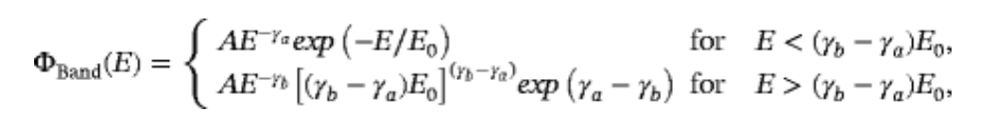

4 Parametri liberi: A, gamma_a, gamma_b, E0   smooth transition tra le due regioni di energia
il motivo di questi "Spectral breaks" si pensa sia associato ai limiti del "Shock accelleration" oppure considerando gli effetti di trasporto interplanetario 


2. Modello fisico "Ellison-Ramaty"  1985  "Power law con cutoff esponenziale"
    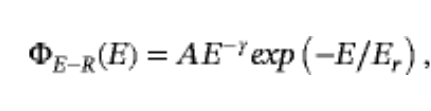

 3 Parametri liberi: A, gamma, Er, roll-over energy che spiega le particelle che escono dalla regione di accellerazione del processo di diffusive shock acceleration (DSA) per via di limiti di tempo o spazio dello shock 



Tipicamente la Band function fit meglio con spettro sotto ~10 MeV  ma non può venire usata per descrivere la parte delle alte energie con i roll-over ~100 MeV ù


Per spiegare sia low-energy break e high-energy roll-over si usa una combinazione di entrambi i modelli:
Per spiegare sia low-energy break e high-energy roll-over si usa una combinazione di entrambi i modelli:

$$
\Phi(E) \;=\; \Phi_{\mathrm{Band}}(E)\,\exp\!\left(-\frac{E}{E_r}\right)
$$


$$
\Phi(E) = A E^{-\gamma} exp(-E/E_r) 
$$



$$
\Phi_{\text{Band}}(E) =
\begin{cases}
A E^{-\gamma_a} \exp\!\left(-\dfrac{E}{E_0}\right),
& \text{per } E < (\gamma_b - \gamma_a) E_0, \\[10pt]
A E^{-\gamma_b} \left[(\gamma_b - \gamma_a) E_0\right]^{(\gamma_b - \gamma_a)}
\exp(\gamma_a - \gamma_b),
& \text{per } E > (\gamma_b - \gamma_a) E_0.
\end{cases}
$$




Header trovato alla riga: 717
Numero di colonne: 53
Numero totale righe: 8640

Canali flusso differenziale trovati (detector E): ['ZPEQ5W', 'ZPEQ15W', 'ZPEQ30W', 'ZPEQ50W', 'ZPEQ60W', 'ZPEQ100W']
Range temporale: 2017-09-01 00:00:00 → 2017-09-30 23:55:00
Finestra evento: 2017-09-02 → 2017-09-19
Righe nella finestra: 5184


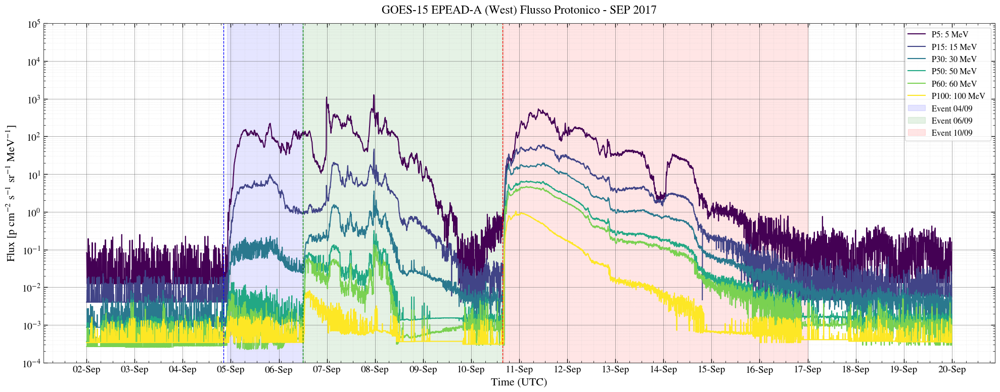

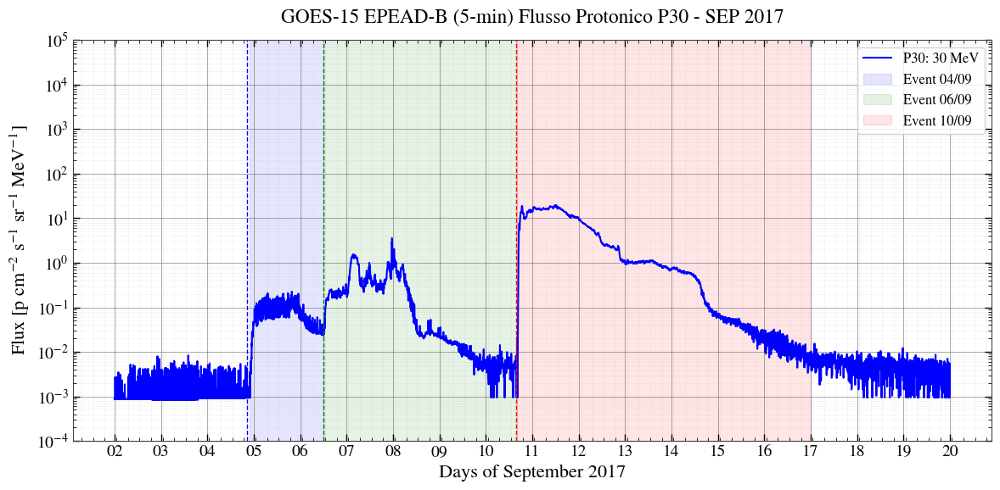

In [1]:
# Analisi dati GOES-15 EPEAD 5min - Evento SEP 2017

import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Configurazione stile paper
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 12

mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True
mpl.rcParams['ytick.right'] = True
mpl.rcParams['xtick.major.size'] = 6
mpl.rcParams['xtick.minor.size'] = 3
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0

mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['axes.grid'] = False

# -----------------------------------------------------------------------

file_path_g15 = "File_scaricati_eventiSEP/Evento SEP 2017/g15_epead_cpflux_5m_20170901_20170930.csv"

# Cerca dinamicamente l'header (come per gli altri file GOES)
header_line_index = 0
column_names = []

with open(file_path_g15, "r") as f:
    for i, line in enumerate(f):
        if "time_tag" in line and "ZPGT1E" in line:
            header_line_index = i
            column_names = line.strip().split(",")
            break

print(f"Header trovato alla riga: {header_line_index}")
print(f"Numero di colonne: {len(column_names)}")

# Leggi il dataset saltando le righe di metadata
df_g15_raw = pd.read_csv(file_path_g15, skiprows=header_line_index + 1, header=None, names=column_names)

print(f"Numero totale righe: {len(df_g15_raw)}")

# Converti time_tag a datetime
df_g15_raw['time_tag'] = pd.to_datetime(df_g15_raw['time_tag'], errors='coerce')
df_g15_raw = df_g15_raw.set_index('time_tag')

# Rimuovi valori mancanti (-99999)
df_g15_raw = df_g15_raw.replace(-99999, np.nan)

# Seleziona solo le colonne di flusso differenziale corrette (ZPEQ - equivalenti al flusso per MeV)
# Useremo i canali ZPEQ*E (detector B/East) 
diff_flux_cols = [c for c in df_g15_raw.columns if c.startswith('ZPEQ') and c.endswith('W') and 'QUAL' not in c]

print(f"\nCanali flusso differenziale trovati (detector E): {diff_flux_cols}")
print(f"Range temporale: {df_g15_raw.index.min()} → {df_g15_raw.index.max()}")

# Estrai solo le colonne di interesse
df_g15 = df_g15_raw[diff_flux_cols].copy()


#----------------------------------------------------------------------------------------------------------


# PLOT EVENTO SEP 2017 - GOES-15

# Mappa canali energia per legenda
channel_map_g15 = {
    'ZPEQ5W': 'P5: 5 MeV ',
    'ZPEQ15W': 'P15: 15 MeV ',
    'ZPEQ30W': 'P30: 30 MeV ',
    'ZPEQ50W': 'P50: 50 MeV ',
    'ZPEQ60W': 'P60: 60 MeV ',
    'ZPEQ100W': 'P100: 100 MeV '
}

# Finestra evento
start_g15 = "2017-09-02"
end_g15 = "2017-09-19"
df_g15_evento = df_g15.loc[start_g15:end_g15]

print(f"Finestra evento: {start_g15} → {end_g15}")
print(f"Righe nella finestra: {len(df_g15_evento)}")






events = {
    "Event 04/09": {"start": "2017-09-04 22:00", "end": "2017-09-06 12:00", "color": "blue", "onset time ": "2017-09-04 20:28"},
    "Event 06/09": {"start": "2017-09-06 12:20", "end": "2017-09-10 16:00", "color": "green", "onset time ": "2017-09-06 11:53"},
    "Event 10/09": {"start": "2017-09-10 16:05", "end": "2017-09-17 00:00", "color": "red", "onset time ": "2017-09-10 15:35"},
}

plt.figure(figsize=(20, 8))

# Colormap
colors_g15 = plt.cm.viridis(np.linspace(0, 1, len(diff_flux_cols)))

for col, color in zip(diff_flux_cols, colors_g15):
    label_text = channel_map_g15.get(col, col)
    plt.plot(df_g15_evento.index, df_g15_evento[col],
             label=label_text,
             color=color,
             linewidth=1.5)

# Aggiungi rettangoli per gli eventi SEP
for event_name, event_info in events.items():
    start_evt = pd.to_datetime(event_info["start"])
    end_evt = pd.to_datetime(event_info["end"])
    plt.axvspan(start_evt, end_evt, color=event_info["color"], alpha=0.1, label=event_name)

    # Aggiungi linea verticale per onset time
    onset_time = pd.to_datetime(event_info["onset time "])
    plt.axvline(onset_time, color=event_info["color"], linestyle='--', linewidth=1)


# Formattazione
plt.yscale('log')
plt.ylim(1e-4, 1e5)

plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'GOES-15 EPEAD-A (West) Flusso Protonico - SEP 2017', pad=15)

# Formattazione asse temporale
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
ax.xaxis.set_minor_locator(mdates.HourLocator(interval=6))

# Griglia
ax.grid(which='major', linestyle='-', linewidth=0.6, color='0.35', alpha=0.6)
ax.grid(which='minor', linestyle='--', linewidth=0.4, color='0.7', alpha=0.3)

for spine in ax.spines.values():
    spine.set_edgecolor('#444444')
    spine.set_linewidth(0.8)

plt.legend(frameon=True, loc='upper right', fontsize=12, handlelength=2)
plt.tight_layout()
plt.show()
plt.close()


#--------------------------------------------------------------------------

# plot of only P30 
plt.figure(figsize=(12, 6))
plt.plot(df_g15_evento.index, df_g15_evento['ZPEQ30W'],
         label='P30: 30 MeV',
         color='blue',
         linewidth=1.5)
# Aggiungi rettangoli per gli eventi SEP
for event_name, event_info in events.items():
    start_evt = pd.to_datetime(event_info["start"])
    end_evt = pd.to_datetime(event_info["end"])
    plt.axvspan(start_evt, end_evt, color=event_info["color"], alpha=0.1, label=event_name)
    
    # Aggiungi linea verticale per onset time
    onset_time = pd.to_datetime(event_info["onset time "])
    plt.axvline(onset_time, color=event_info["color"], linestyle='--', linewidth=1)


plt.yscale('log')

plt.ylim(1e-4, 1e5)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Days of September 2017')
plt.title(r'GOES-15 EPEAD-B (5-min) Flusso Protonico P30 - SEP 2017', pad=15)
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d'))
ax.xaxis.set_minor_locator(mdates.HourLocator(interval=6))
ax.grid(which='major', linestyle='-', linewidth=0.6, color='0.35', alpha=0.6)
ax.grid(which='minor', linestyle='--', linewidth=0.4, color='0.7', alpha=0.3)
for spine in ax.spines.values():
    spine.set_edgecolor('#444444')
    spine.set_linewidth(0.8)
plt.legend(frameon=True, loc='upper right', fontsize=12, handlelength=2)
plt.tight_layout()
plt.show()






In [131]:
plt.close('all')

# Pulizia dati - calcolo fluenza - spettro energia - fit modelli combinati 3 eventi SEP 2017 





In [34]:
#backgroud
# --- 1. DEFINIZIONE E SOTTRAZIONE BACKGROUND ---

start_bg = "2017-09-03 00:00:00"
end_bg = "2017-09-04 00:00:00"

df_bg = df_g15.loc[start_bg:end_bg]
background_mean = df_bg.mean()

df_corr = df_g15_evento[diff_flux_cols].copy() - background_mean[diff_flux_cols]


t_start = pd.to_datetime("2017-09-04 22:00:00")
t_end = pd.to_datetime("2017-09-16 00:00:00")

dt_evt = df_corr.loc[t_start:t_end]


fluence_diff = {}

for col in diff_flux_cols:
    F = dt_evt[col].sum() * (5 * 60)  # 5 minutes in seconds
    fluence_diff[col] = F

energy_bins = {
    'ZPEQ5W': 5,
    'ZPEQ15W': 15,
    'ZPEQ30W': 30,
    'ZPEQ50W': 50,
    'ZPEQ60W': 60,
    'ZPEQ100W': 100
}

fluence_int = {}

for col in diff_flux_cols:
    



_IncompleteInputError: incomplete input (3742794140.py, line 38)

Fitting Band Function...
Band Params: ga=0.05, gb=3.27, E0=3.9
Fitting Combined Model...


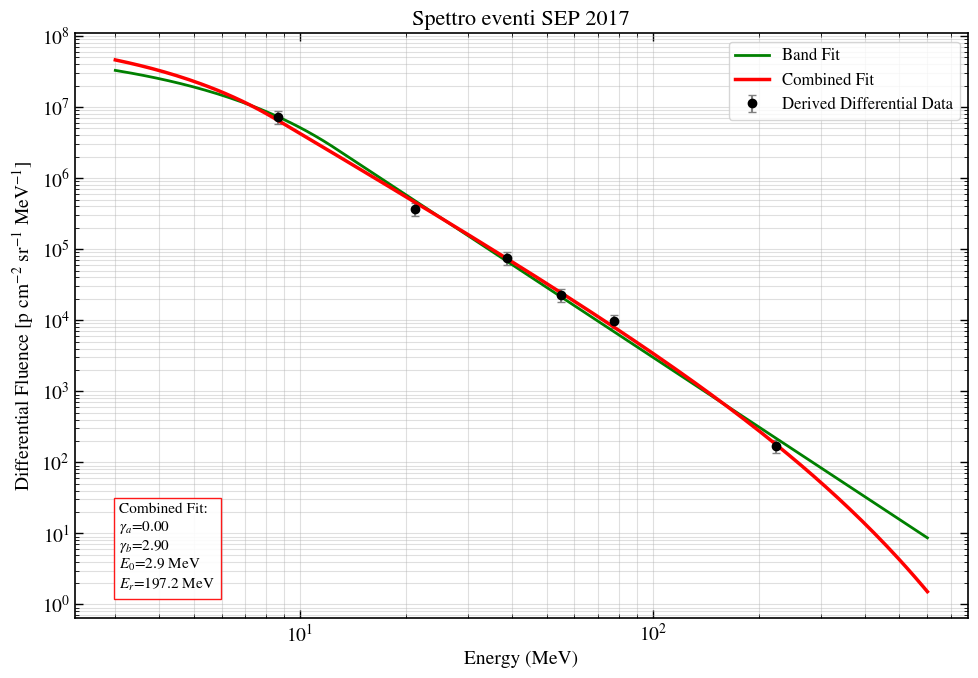

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==========================================
# 1. FUNZIONI DI FIT (Differenziali)
# ==========================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** -gamma) * np.exp(-E / Er)

def band_function(E, A, ga, gb, E0):
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E < E_break
    mask_high = ~mask_low
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er_high):
    band = band_function(E, A, ga, gb, E0)
    return band * np.exp(-E / Er_high)

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def func_log(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-30))
    
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)
    
    try:
        popt, _ = curve_fit(func_log, x, np.log10(y), p0=p0, 
                            sigma=sigma_log, absolute_sigma=True, 
                            bounds=bounds, maxfev=15000)
        return popt
    except:
        return None

# ==========================================
# 2. PREPARAZIONE DATI (Il tuo codice + Background)
# ==========================================

# Mappatura dei tuoi canali integrali
integral_bins_map = {
    'ZPEQ5W': 5.0,
    'ZPEQ15W': 15.0,
    'ZPEQ30W': 30.0,
    'ZPEQ50W': 50.0,
    'ZPEQ60W': 60.0,
    'ZPEQ100W': 100.0
}
# Lista ordinata delle colonne in base all'energia
diff_flux_cols = sorted(integral_bins_map, key=integral_bins_map.get)

# --- SOTTRAZIONE BACKGROUND (Tuo codice) ---
start_bg = "2017-09-03 00:00:00"
end_bg = "2017-09-04 00:00:00"
df_bg = df_g15.loc[start_bg:end_bg]
background_mean = df_bg[diff_flux_cols].mean()

# Sottrazione (con clip a 0 per evitare negativi)
df_corr = df_g15_evento[diff_flux_cols].copy() - background_mean
df_corr[df_corr < 0] = 0 

# --- SELEZIONE EVENTO E INTEGRAZIONE ---
t_start = pd.to_datetime("2017-09-04 22:00:00")
t_end = pd.to_datetime("2017-09-17 00:00:00")
dt_evt = df_corr.loc[t_start:t_end]

# Calcolo fluenza INTEGRALE totale per ogni canale
fluence_integral_total = {}
for col in diff_flux_cols:
    # Moltiplichiamo per 300s (5 min) come nel tuo codice
    F = dt_evt[col].sum() * 300 
    fluence_integral_total[col] = F

# ==========================================
# 3. CONVERSIONE: INTEGRALE -> DIFFERENZIALE
# ==========================================
# Qui trasformiamo i dati "ZPEQ" (>E) in punti spettrali (dPhi/dE)

x_diff = [] # Energie efficaci
y_diff = [] # Fluenze differenziali

thresholds = [integral_bins_map[c] for c in diff_flux_cols]
fluences = [fluence_integral_total[c] for c in diff_flux_cols]

# Loop sui canali per fare la differenza tra un canale e il successivo
for i in range(len(thresholds) - 1):
    E_low = thresholds[i]
    E_high = thresholds[i+1]
    
    # Flusso nel bin = Flusso(>E_low) - Flusso(>E_high)
    dPhi = fluences[i] - fluences[i+1]
    dE = E_high - E_low
    
    if dPhi > 0: # Evitiamo dati sporchi/negativi
        diff_flux = dPhi / dE
        eff_energy = np.sqrt(E_low * E_high) # Media geometrica
        
        x_diff.append(eff_energy)
        y_diff.append(diff_flux)

# Gestione ultimo canale (>100 MeV)
# Assumiamo un limite superiore (es. 500 MeV) per chiudere l'ultimo bin
LAST_BIN_MAX = 500.0
dPhi_last = fluences[-1]
if dPhi_last > 0:
    diff_flux_last = dPhi_last / (LAST_BIN_MAX - thresholds[-1])
    eff_energy_last = np.sqrt(thresholds[-1] * LAST_BIN_MAX)
    x_diff.append(eff_energy_last)
    y_diff.append(diff_flux_last)

# Prepariamo gli array numpy per il fit
x_data = np.array(x_diff)
y_data = np.array(y_diff)
y_err = y_data * 0.20 # Errore sistematico 20%

# ==========================================
# 4. ESECUZIONE FIT E PLOT
# ==========================================

plt.figure(figsize=(10, 7))

# 1. Plot dei Punti Calcolati
plt.errorbar(x_data, y_data, yerr=y_err, fmt='o', color='black', 
             ecolor='gray', capsize=3, label='Derived Differential Data')

x_fit_plot = np.logspace(np.log10(3), np.log10(600), 200)

# --- FIT BAND FUNCTION ---
print("Fitting Band Function...")
p0_band = [1e6, 1.5, 3.5, 10.0]
bounds_band = ([0, 0, 0, 0], [np.inf, 10, 10, 500])
popt_band = fit_log_space(band_function, x_data, y_data, y_err, p0_band, bounds_band)

if popt_band is not None:
    plt.plot(x_fit_plot, band_function(x_fit_plot, *popt_band), 
             '-', color='green', linewidth=2, label='Band Fit')
    print(f"Band Params: ga={popt_band[1]:.2f}, gb={popt_band[2]:.2f}, E0={popt_band[3]:.1f}")
    
    # --- FIT COMBINED (Band * Exp) ---
    # Usiamo i parametri Band come guess
    print("Fitting Combined Model...")
    p0_comb = [popt_band[0], popt_band[1], popt_band[2], popt_band[3], 300.0]
    bounds_comb = ([0, 0, 0, 0, 10], [np.inf, 10, 10, 500, 2000]) # Er > 10 MeV
    popt_comb = fit_log_space(combined_function, x_data, y_data, y_err, p0_comb, bounds_comb)
    
    if popt_comb is not None:
        plt.plot(x_fit_plot, combined_function(x_fit_plot, *popt_comb), 
                 '-', color='red', linewidth=2.5, label='Combined Fit')
        
        info = (f"Combined Fit:\n"
                f"$\\gamma_a$={popt_comb[1]:.2f}\n"
                f"$\\gamma_b$={popt_comb[2]:.2f}\n"
                f"$E_0$={popt_comb[3]:.1f} MeV\n"
                f"$E_r$={popt_comb[4]:.1f} MeV")
        plt.gca().text(0.05, 0.05, info, transform=plt.gca().transAxes, fontsize=11,
                       bbox=dict(facecolor='white', alpha=0.9, edgecolor='red'))
    else:
        print("Combined Fit failed.")
else:
    print("Band Fit failed.")

# Configurazione Grafico
plt.xscale('log')
plt.yscale('log')
plt.title('Spettro eventi SEP 2017', fontsize=16)
plt.xlabel('Energy (MeV)', fontsize=14)
plt.ylabel(r'Differential Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True, which="both", alpha=0.4)
plt.tight_layout()
plt.show()

--- AVVIO FIT SPETTRALI PROFESSIONALI (SETT 2017) ---

Evento: Event 04/09
--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 263.90
--- Band Results ---
Chi-Quadro Ridotto: 372.68
--- Combined Results ---
Chi-Quadro Ridotto: 760.75

Evento: Event 06/09
--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 1.77
--- Band Results ---
Chi-Quadro Ridotto: 1.22
--- Combined Results ---
Chi-Quadro Ridotto: 2.62

Evento: Event 10/09 (GLE)
--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 0.55
--- Band Results ---
Chi-Quadro Ridotto: 6.28
--- Combined Results ---
Chi-Quadro Ridotto: 6.31
 -> Saving SPENVIS for Event 10/09 (GLE)...


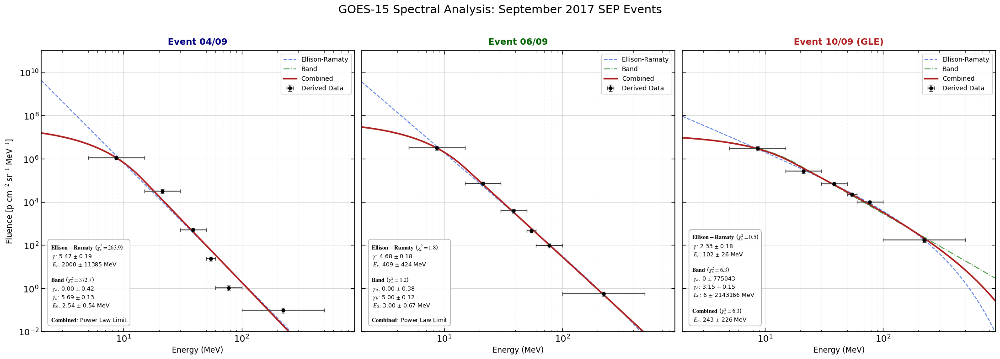

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.optimize import curve_fit

# Impostazioni generali plot
plt.rcParams.update({'font.size': 11, 'font.family': 'sans-serif'})

# ==========================================
# 1. FUNZIONI MATEMATICHE E STATISTICHE
# ==========================================

# Ellison-Ramaty
def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** -gamma) * np.exp(-E / Er)

# Band Function
def band_function(E, A, ga, gb, E0):
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E < E_break
    mask_high = ~mask_low
    
    # Parte bassa energia
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    
    # Parte alta energia
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor
    return res

# Combined Model
def combined_function(E, A, ga, gb, E0, Er_high):
    band = band_function(E, A, ga, gb, E0)
    return band * np.exp(-E / Er_high)

# Helper: Fit nel log-space (ritorna anche pcov per gli errori)
def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def func_log(x_in, *params):
        model_y = func(x_in, *params)
        model_y = np.maximum(model_y, 1e-30) 
        return np.log10(model_y)
    
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)
    
    try:
        popt, pcov = curve_fit(func_log, x, np.log10(y), p0=p0, 
                               sigma=sigma_log, absolute_sigma=True, 
                               bounds=bounds, maxfev=20000)
        return popt, pcov
    except:
        return None, None

# Helper: Calcolo Chi-Quadro e stampa statistiche
def report_fit_stats(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return np.inf
    
    # Chi-Quadro
    y_model = func(x, *popt)
    residuals = (y - y_model) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else np.inf
    
    # Stampa console
    perr = np.sqrt(np.diag(pcov))
    print(f"--- {model_name} Results ---")
    print(f"Chi-Quadro Ridotto: {chi_red:.2f}")
    return chi_red

# Helper: Formattazione testo per box grafico
def fmt_param(val, err, is_sci=False):
    if is_sci: 
        return rf"{val:.1e} $\pm$ {err:.1e}"
    elif val > 100 or err > 100: 
        return rf"{val:.0f} $\pm$ {err:.0f}"
    else: 
        return rf"{val:.2f} $\pm$ {err:.2f}"

# ==========================================
# 2. CONFIGURAZIONE DATI E EVENTI
# ==========================================

# Mappatura Canali Integrali GOES-15
integral_bins_map = {
    'ZPEQ5W': 5.0, 'ZPEQ15W': 15.0, 'ZPEQ30W': 30.0,
    'ZPEQ50W': 50.0, 'ZPEQ60W': 60.0, 'ZPEQ100W': 100.0
}
flux_cols = sorted(integral_bins_map, key=integral_bins_map.get)
thresholds = [integral_bins_map[c] for c in flux_cols]

events = {
    "Event 04/09": {"start": "2017-09-04 22:00", "end": "2017-09-06 12:00", "color": "navy"},
    "Event 06/09": {"start": "2017-09-06 12:20", "end": "2017-09-10 16:00", "color": "darkgreen"},
    "Event 10/09 (GLE)": {"start": "2017-09-10 16:05", "end": "2017-09-17 00:00", "color": "firebrick"},
}

# ==========================================
# 3. SOTTRAZIONE BACKGROUND GLOBALE
# ==========================================

start_bg = "2017-09-03 00:00:00"
end_bg = "2017-09-04 00:00:00"

df_bg = df_g15.loc[start_bg:end_bg]
background_mean = df_bg[flux_cols].mean()
df_corr_global = df_g15[flux_cols] - background_mean
df_corr_global[df_corr_global < 0] = 0

# ==========================================
# 4. LOOP ANALISI E PLOT PROFESSIONALE
# ==========================================

fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=True)
axes = axes.flatten()

x_fit_plot = np.logspace(np.log10(2), np.log10(1000), 300)

print("--- AVVIO FIT SPETTRALI PROFESSIONALI (SETT 2017) ---")

for i, (evt_name, params) in enumerate(events.items()):
    ax = axes[i]
    colore = params["color"]
    t_start = pd.to_datetime(params["start"])
    t_end = pd.to_datetime(params["end"])
    
    # A. Dati Temporali
    dt_evt = df_corr_global.loc[t_start:t_end]
    time_deltas = dt_evt.index.to_series().diff().dt.total_seconds().fillna(0)
    
    # B. Fluenza Integrale
    integral_fluences = []
    for col in flux_cols:
        F = (dt_evt[col] * time_deltas).sum()
        integral_fluences.append(F)
        
    # C. Conversione: INTEGRALE -> DIFFERENZIALE + CALCOLO ERRORI ORIZZONTALI
    x_diff = []
    y_diff = []
    x_err_low = []
    x_err_high = []
    
    # Loop sui canali
    for j in range(len(thresholds) - 1):
        E_low = thresholds[j]
        E_high = thresholds[j+1]
        
        dPhi = integral_fluences[j] - integral_fluences[j+1]
        dE = E_high - E_low
        
        if dPhi > 0:
            y_val = dPhi / dE
            x_val = np.sqrt(E_low * E_high) # Media geometrica
            
            x_diff.append(x_val)
            y_diff.append(y_val)
            
            # Calcolo errori orizzontali (larghezza bin)
            x_err_low.append(x_val - E_low)
            x_err_high.append(E_high - x_val)
            
    # Ultimo canale (>100 MeV)
    LAST_BIN_MAX = 500.0
    if integral_fluences[-1] > 0:
        y_last = integral_fluences[-1] / (LAST_BIN_MAX - thresholds[-1])
        x_last = np.sqrt(thresholds[-1] * LAST_BIN_MAX)
        x_diff.append(x_last)
        y_diff.append(y_last)
        x_err_low.append(x_last - thresholds[-1])
        x_err_high.append(LAST_BIN_MAX - x_last)
        
    # Setup dati per il fit
    x_data = np.array(x_diff)
    y_data = np.array(y_diff)
    
    # --- CALCOLO ERRORI (Sistematico + Statistico) ---
    sigma_sys = y_data * 0.20
    
    # Stima errore statistico (Poisson)
    # Recuperiamo i conteggi (fluenza integrale del bin)
    dPhi_vals = []
    dE_vals = []
    for j in range(len(thresholds) - 1):
        dPhi = integral_fluences[j] - integral_fluences[j+1]
        dE = thresholds[j+1] - thresholds[j]
        if dPhi > 0:
            dPhi_vals.append(dPhi)
            dE_vals.append(dE)
    if integral_fluences[-1] > 0:
        dPhi_vals.append(integral_fluences[-1])
        dE_vals.append(500.0 - thresholds[-1])
        
    dPhi_arr = np.array(dPhi_vals)
    dE_arr = np.array(dE_vals)
    
    # Errore statistico propagato sulla fluenza differenziale
    # sigma_stat = sqrt(N) / dE
    sigma_stat = np.sqrt(dPhi_arr) / dE_arr
    
    # Somma in quadratura
    y_err = np.sqrt(sigma_sys**2 + sigma_stat**2)
    y_err = np.maximum(y_err, 1e-30)
    
    x_errs = [x_err_low, x_err_high]
    
    # Plot Dati
    ax.errorbar(x_data, y_data, yerr=y_err, xerr=x_errs, 
                fmt='o', color='black', ecolor='#444444', capsize=3, markersize=5,
                label='Derived Data', zorder=10)
    
    print(f"\n{'='*40}\nEvento: {evt_name}")
    stats_text = ""

    # --- FIT 1: ELLISON-RAMATY ---
    p0_er = [1e6, 2.0, 50.0]
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x_data, y_data, y_err, p0_er, bounds=([0,0,0],[np.inf, 10, 2000]))
    
    if popt_er is not None:
        ax.plot(x_fit_plot, ellison_ramaty(x_fit_plot, *popt_er), 
                '--', color='royalblue', alpha=0.8, label='Ellison-Ramaty')
        
        perr_er = np.sqrt(np.diag(pcov_er))
        chi_er = report_fit_stats("Ellison-Ramaty", ellison_ramaty, x_data, y_data, y_err, popt_er, pcov_er)
        
        stats_text += rf"$\bf{{Ellison-Ramaty}}$ ($\chi^2_\nu={chi_er:.1f}$)" + "\n"
        stats_text += rf" $\gamma$: {fmt_param(popt_er[1], perr_er[1])}" + "\n"
        stats_text += rf" $E_r$: {fmt_param(popt_er[2], perr_er[2])} MeV" + "\n"

    # --- FIT 2: BAND FUNCTION ---
    p0_band = [1e5, 1.5, 3.5, 10.0]
    popt_band, pcov_band = fit_log_space(band_function, x_data, y_data, y_err, p0_band, bounds=([0,0,0,0], [np.inf, 10, 10, 500]))
    
    if popt_band is not None:
        ax.plot(x_fit_plot, band_function(x_fit_plot, *popt_band), 
                '-.', color='forestgreen', alpha=0.8, label='Band')
        
        perr_band = np.sqrt(np.diag(pcov_band))
        chi_band = report_fit_stats("Band", band_function, x_data, y_data, y_err, popt_band, pcov_band)
        
        stats_text += "\n" + rf"$\bf{{Band}}$ ($\chi^2_\nu={chi_band:.1f}$)" + "\n"
        stats_text += rf" $\gamma_a$: {fmt_param(popt_band[1], perr_band[1])}" + "\n"
        stats_text += rf" $\gamma_b$: {fmt_param(popt_band[2], perr_band[2])}" + "\n"
        stats_text += rf" $E_0$: {fmt_param(popt_band[3], perr_band[3])} MeV" + "\n"
        
        # --- FIT 3: COMBINED MODEL (Band * Exp) ---
        p0_comb = [popt_band[0], popt_band[1], popt_band[2], popt_band[3], 300.0]
        popt_comb, pcov_comb = fit_log_space(combined_function, x_data, y_data, y_err, p0_comb, bounds=([0,0,0,0,10], [np.inf, 10, 10, 500, 3000]))
        
        if popt_comb is not None:
            ax.plot(x_fit_plot, combined_function(x_fit_plot, *popt_comb), 
                    '-', color='firebrick', linewidth=2.5, label='Combined')
            
            perr_comb = np.sqrt(np.diag(pcov_comb))
            chi_comb = report_fit_stats("Combined", combined_function, x_data, y_data, y_err, popt_comb, pcov_comb)
            
            # Controllo divergenza Cutoff
            if popt_comb[4] < 2500:
                stats_text += "\n" + rf"$\bf{{Combined}}$ ($\chi^2_\nu={chi_comb:.1f}$)" + "\n"
                stats_text += rf" $E_r$: {fmt_param(popt_comb[4], perr_comb[4])} MeV"
                
                # Export SPENVIS
                print(f" -> Saving SPENVIS for {evt_name}...")
                en_grid = np.logspace(np.log10(0.1), np.log10(2000.0), 100)
                fl_sp = combined_function(en_grid, *popt_comb)
                df_sp = pd.DataFrame({'Energy': en_grid, 'Fluence': fl_sp})
                fname = f"SPENVIS_2017_{evt_name.split()[0]}_{evt_name.split()[-1].replace('/','-')}.txt"
                df_sp.to_csv(fname, sep='\t', index=False, float_format='%.6e')
            else:
                stats_text += "\n" + r"$\bf{Combined}$: Power Law Limit"
        else:
            print(" Combined Fit Fallito")

    # Styling grafico
    ax.set_title(evt_name, fontsize=14, color=colore, fontweight='bold', pad=10)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim(2, 900)
    ax.set_ylim(1e-2, 1e11) # Uniformiamo asse Y
    
    # Griglia
    ax.grid(True, which="major", color='#b0b0b0', linestyle='-', alpha=0.5)
    ax.grid(True, which="minor", color='#d0d0d0', linestyle=':', alpha=0.3)
    
    ax.set_xlabel("Energy (MeV)", fontsize=12)
    if i == 0:
        ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)

    # Box Info
    ax.text(0.03, 0.03, stats_text, transform=ax.transAxes, fontsize=9,
            verticalalignment='bottom', horizontalalignment='left',
            bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.92, edgecolor='#aaaaaa'))

    ax.legend(loc='upper right', fontsize=10, framealpha=0.9)

plt.suptitle('GOES-15 Spectral Analysis: September 2017 SEP Events', fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96])
plt.show()

--- AVVIO FIT SPETTRALI PROFESSIONALI (SETT 2017) ---

Evento: Event 04/09
--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 403.47 (dof=3)
--- Band Results ---
Chi-Quadro Ridotto: 589.94 (dof=2)
--- Combined Results ---
Chi-Quadro Ridotto: 1206.87 (dof=1)

Evento: Event 06/09 (X9.3)
--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 1.78 (dof=3)
--- Band Results ---
Chi-Quadro Ridotto: 1.23 (dof=2)
--- Combined Results ---
Chi-Quadro Ridotto: 2.66 (dof=1)

Evento: Event 10/09 (GLE X8.2)
--- Ellison-Ramaty Results ---
Chi-Quadro Ridotto: 0.55 (dof=3)
--- Band Results ---
Chi-Quadro Ridotto: 6.29 (dof=2)
--- Combined Results ---
Chi-Quadro Ridotto: 6.31 (dof=1)
 -> Saving SPENVIS for Event 10/09 (GLE X8.2)...


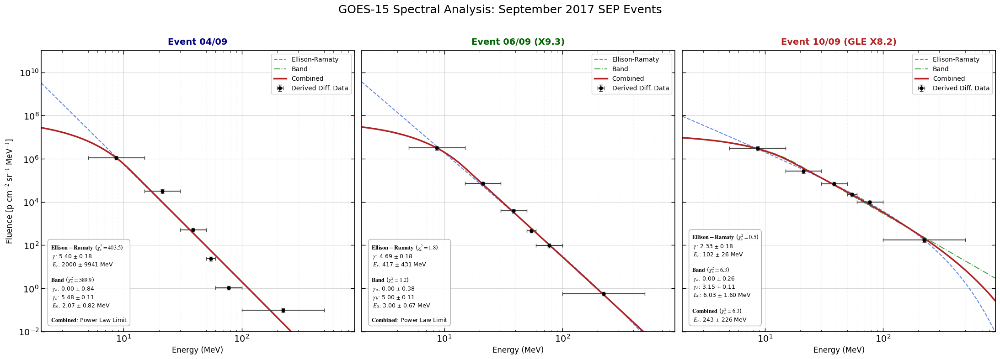

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.optimize import curve_fit

# Impostazioni generali plot
plt.rcParams.update({'font.size': 11, 'font.family': 'sans-serif'})

# ==========================================
# 1. FUNZIONI MATEMATICHE E STATISTICHE
# ==========================================

# Ellison-Ramaty
def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** -gamma) * np.exp(-E / Er)

# Band Function
def band_function(E, A, ga, gb, E0):
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E < E_break
    mask_high = ~mask_low
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor
    return res

# Combined Model
def combined_function(E, A, ga, gb, E0, Er_high):
    band = band_function(E, A, ga, gb, E0)
    return band * np.exp(-E / Er_high)

# Helper: Fit nel log-space
def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def func_log(x_in, *params):
        model_y = func(x_in, *params)
        model_y = np.maximum(model_y, 1e-30) 
        return np.log10(model_y)
    
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)
    
    try:
        popt, pcov = curve_fit(func_log, x, np.log10(y), p0=p0, 
                               sigma=sigma_log, absolute_sigma=True, 
                               bounds=bounds, maxfev=20000)
        return popt, pcov
    except:
        return None, None

# Helper: Calcolo Chi-Quadro
def report_fit_stats(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return np.inf
    y_model = func(x, *popt)
    residuals = (y - y_model) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    # Se dof <= 0, il chi quadro non ha senso statistico (overfitting)
    chi_red = chi_sq / dof if dof > 0 else 0.0 
    
    perr = np.sqrt(np.diag(pcov))
    print(f"--- {model_name} Results ---")
    print(f"Chi-Quadro Ridotto: {chi_red:.2f} (dof={dof})")
    return chi_red

# Helper: Formattazione testo
def fmt_param(val, err, is_sci=False):
    if is_sci: 
        return rf"{val:.1e} $\pm$ {err:.1e}"
    elif val > 100 or err > 100: 
        return rf"{val:.0f} $\pm$ {err:.0f}"
    else: 
        return rf"{val:.2f} $\pm$ {err:.2f}"

# ==========================================
# 2. CONFIGURAZIONE DATI E EVENTI (CORRETTO)
# ==========================================

# Mappatura Canali Integrali GOES-15
integral_bins_map = {
    'ZPEQ5W': 5.0, 'ZPEQ15W': 15.0, 'ZPEQ30W': 30.0,
    'ZPEQ50W': 50.0, 'ZPEQ60W': 60.0, 'ZPEQ100W': 100.0
}
flux_cols = sorted(integral_bins_map, key=integral_bins_map.get)
thresholds = [integral_bins_map[c] for c in flux_cols]

# DATE AGGIORNATE PER CATTURARE ONSET
events = {
    "Event 04/09": {
        "start": "2017-09-04 22:00", 
        "end": "2017-09-06 12:00", 
        "color": "navy"
    },
    "Event 06/09 (X9.3)": {
        "start": "2017-09-06 12:20",  # Corretto onset rapido
        "end": "2017-09-10 16:00", 
        "color": "darkgreen"
    },
    "Event 10/09 (GLE X8.2)": {
        "start": "2017-09-10 16:05",  # Corretto onset rapido GLE
        "end": "2017-09-17 00:00", 
        "color": "firebrick"
    },
}

# ==========================================
# 3. SOTTRAZIONE BACKGROUND GLOBALE
# ==========================================

start_bg = "2017-09-03 00:00:00"
end_bg = "2017-09-04 00:00:00"

# Assicurati che df_g15 sia definito nel tuo notebook!
df_bg = df_g15.loc[start_bg:end_bg]
background_mean = df_bg[flux_cols].mean()
df_corr_global = df_g15[flux_cols] - background_mean
df_corr_global[df_corr_global < 0] = 0

# ==========================================
# 4. LOOP ANALISI E PLOT PROFESSIONALE
# ==========================================

fig, axes = plt.subplots(1, 3, figsize=(22, 8), sharey=True)
axes = axes.flatten()

x_fit_plot = np.logspace(np.log10(2), np.log10(1000), 300)

print("--- AVVIO FIT SPETTRALI PROFESSIONALI (SETT 2017) ---")

for i, (evt_name, params) in enumerate(events.items()):
    ax = axes[i]
    colore = params["color"]
    t_start = pd.to_datetime(params["start"])
    t_end = pd.to_datetime(params["end"])
    
    # A. Dati Temporali
    dt_evt = df_corr_global.loc[t_start:t_end]
    time_deltas = dt_evt.index.to_series().diff().dt.total_seconds().fillna(0)
    
    # B. Fluenza Integrale
    integral_fluences = []
    for col in flux_cols:
        F = (dt_evt[col] * time_deltas).sum()
        integral_fluences.append(F)
        
    # C. Conversione: INTEGRALE -> DIFFERENZIALE
    x_diff = []
    y_diff = []
    x_err_low = []
    x_err_high = []
    
    for j in range(len(thresholds) - 1):
        E_low = thresholds[j]
        E_high = thresholds[j+1]
        
        dPhi = integral_fluences[j] - integral_fluences[j+1]
        dE = E_high - E_low
        
        # Filtriamo canali non fisici (se flux alto < flux basso a causa di rumore)
        if dPhi > 0:
            y_val = dPhi / dE
            x_val = np.sqrt(E_low * E_high)
            
            x_diff.append(x_val)
            y_diff.append(y_val)
            x_err_low.append(x_val - E_low)
            x_err_high.append(E_high - x_val)
            
    # Ultimo canale (>100 MeV esteso a 500)
    LAST_BIN_MAX = 500.0
    if integral_fluences[-1] > 0:
        y_last = integral_fluences[-1] / (LAST_BIN_MAX - thresholds[-1])
        x_last = np.sqrt(thresholds[-1] * LAST_BIN_MAX)
        x_diff.append(x_last)
        y_diff.append(y_last)
        x_err_low.append(x_last - thresholds[-1])
        x_err_high.append(LAST_BIN_MAX - x_last)

        # Setup dati per il fit
    x_data = np.array(x_diff)
    y_data = np.array(y_diff)
    y_err = y_data * 0.20 # Errore sistematico 20%
    y_err = np.maximum(y_err, 1e-30)
    x_errs = [x_err_low, x_err_high]
    
    # Plot Dati Derivati
    ax.errorbar(x_data, y_data, yerr=y_err, xerr=x_errs, 
                fmt='o', color='black', ecolor='#444444', capsize=3, markersize=5,
                label='Derived Diff. Data', zorder=10)
    
    print(f"\n{'='*40}\nEvento: {evt_name}")
    stats_text = ""

    # --- FIT 1: ELLISON-RAMATY ---
    p0_er = [1e6, 2.0, 50.0]
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x_data, y_data, y_err, p0_er, bounds=([0,0,0],[np.inf, 10, 2000]))
    
    if popt_er is not None:
        ax.plot(x_fit_plot, ellison_ramaty(x_fit_plot, *popt_er), 
                '--', color='royalblue', alpha=0.8, label='Ellison-Ramaty')
        
        perr_er = np.sqrt(np.diag(pcov_er))
        chi_er = report_fit_stats("Ellison-Ramaty", ellison_ramaty, x_data, y_data, y_err, popt_er, pcov_er)
        
        stats_text += rf"$\bf{{Ellison-Ramaty}}$ ($\chi^2_\nu={chi_er:.1f}$)" + "\n"
        stats_text += rf" $\gamma$: {fmt_param(popt_er[1], perr_er[1])}" + "\n"
        stats_text += rf" $E_r$: {fmt_param(popt_er[2], perr_er[2])} MeV" + "\n"

    # --- FIT 2: BAND FUNCTION ---
    p0_band = [1e5, 1.5, 3.5, 10.0]
    popt_band, pcov_band = fit_log_space(band_function, x_data, y_data, y_err, p0_band, bounds=([0,0,0,0], [np.inf, 10, 10, 500]))
    
    if popt_band is not None:
        ax.plot(x_fit_plot, band_function(x_fit_plot, *popt_band), 
                '-.', color='forestgreen', alpha=0.8, label='Band')
        
        perr_band = np.sqrt(np.diag(pcov_band))
        chi_band = report_fit_stats("Band", band_function, x_data, y_data, y_err, popt_band, pcov_band)
        
        stats_text += "\n" + rf"$\bf{{Band}}$ ($\chi^2_\nu={chi_band:.1f}$)" + "\n"
        stats_text += rf" $\gamma_a$: {fmt_param(popt_band[1], perr_band[1])}" + "\n"
        stats_text += rf" $\gamma_b$: {fmt_param(popt_band[2], perr_band[2])}" + "\n"
        stats_text += rf" $E_0$: {fmt_param(popt_band[3], perr_band[3])} MeV" + "\n"
        
        # --- FIT 3: COMBINED MODEL ---
        p0_comb = [popt_band[0], popt_band[1], popt_band[2], popt_band[3], 300.0]
        # NOTA: Bounds leggermente più rilassati per aiutare la convergenza con pochi punti
        popt_comb, pcov_comb = fit_log_space(combined_function, x_data, y_data, y_err, p0_comb, bounds=([0,0,0,0,10], [np.inf, 10, 10, 500, 3000]))
        
        if popt_comb is not None:
            ax.plot(x_fit_plot, combined_function(x_fit_plot, *popt_comb), 
                    '-', color='firebrick', linewidth=2.5, label='Combined')
            
            perr_comb = np.sqrt(np.diag(pcov_comb))
            chi_comb = report_fit_stats("Combined", combined_function, x_data, y_data, y_err, popt_comb, pcov_comb)
            
            if popt_comb[4] < 2500:
                stats_text += "\n" + rf"$\bf{{Combined}}$ ($\chi^2_\nu={chi_comb:.1f}$)" + "\n"
                stats_text += rf" $E_r$: {fmt_param(popt_comb[4], perr_comb[4])} MeV"
                
                # Export SPENVIS
                print(f" -> Saving SPENVIS for {evt_name}...")
                en_grid = np.logspace(np.log10(0.1), np.log10(2000.0), 100)
                fl_sp = combined_function(en_grid, *popt_comb)
                df_sp = pd.DataFrame({'Energy': en_grid, 'Fluence': fl_sp})
                fname = f"SPENVIS_2017_{evt_name.split()[0]}_{evt_name.split()[-1].replace('/','-')}.txt"
                df_sp.to_csv(fname, sep='\t', index=False, float_format='%.6e')
            else:
                stats_text += "\n" + r"$\bf{Combined}$: Power Law Limit"
        else:
            print(" Combined Fit Fallito")

    # Styling grafico
    ax.set_title(evt_name, fontsize=14, color=colore, fontweight='bold', pad=10)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim(2, 900)
    ax.set_ylim(1e-2, 1e11)
    
    ax.grid(True, which="major", color='#b0b0b0', linestyle='-', alpha=0.5)
    ax.grid(True, which="minor", color='#d0d0d0', linestyle=':', alpha=0.3)
    
    ax.set_xlabel("Energy (MeV)", fontsize=12)
    if i == 0:
        ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)

    # Box Info
    ax.text(0.03, 0.03, stats_text, transform=ax.transAxes, fontsize=9,
            verticalalignment='bottom', horizontalalignment='left',
            bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.92, edgecolor='#aaaaaa'))

    ax.legend(loc='upper right', fontsize=10, framealpha=0.9)

plt.suptitle('GOES-15 Spectral Analysis: September 2017 SEP Events', fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96])
plt.show()

Canali Detector E (East): ['ZPEQ5E', 'ZPEQ15E', 'ZPEQ30E', 'ZPEQ50E', 'ZPEQ60E', 'ZPEQ100E']
Canali Detector W (West): ['ZPEQ5W', 'ZPEQ15W', 'ZPEQ30W', 'ZPEQ50W', 'ZPEQ60W', 'ZPEQ100W']

Righe nella finestra evento (entrambi detector): 5184


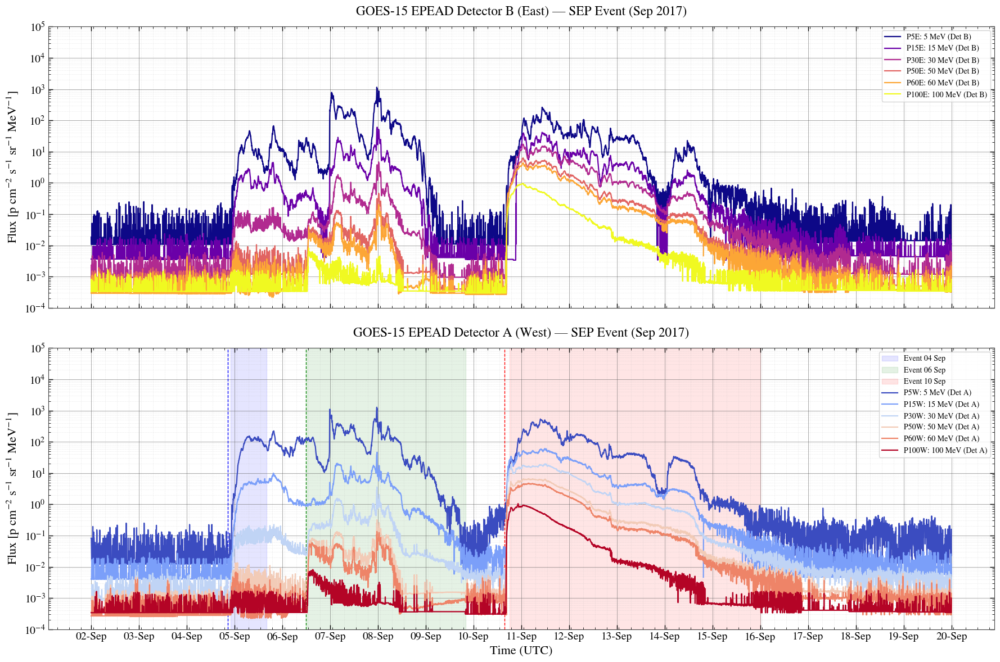

In [36]:
# PLOT COMBINATO - Detector A (West) e Detector B (East)

# Seleziona canali da entrambi i detector
diff_flux_cols_E = [c for c in df_g15_raw.columns if c.startswith('ZPEQ') and c.endswith('E') and 'QUAL' not in c]
diff_flux_cols_W = [c for c in df_g15_raw.columns if c.startswith('ZPEQ') and c.endswith('W') and 'QUAL' not in c]

print(f"Canali Detector E (East): {diff_flux_cols_E}")
print(f"Canali Detector W (West): {diff_flux_cols_W}")

# Mappa canali per entrambi i detector
channel_map_both = {
    'ZPEQ5E': 'P5E: 5 MeV (Det B)',
    'ZPEQ15E': 'P15E: 15 MeV (Det B)',
    'ZPEQ30E': 'P30E: 30 MeV (Det B)',
    'ZPEQ50E': 'P50E: 50 MeV (Det B)',
    'ZPEQ60E': 'P60E: 60 MeV (Det B)',
    'ZPEQ100E': 'P100E: 100 MeV (Det B)',
    'ZPEQ5W': 'P5W: 5 MeV (Det A)',
    'ZPEQ15W': 'P15W: 15 MeV (Det A)',
    'ZPEQ30W': 'P30W: 30 MeV (Det A)',
    'ZPEQ50W': 'P50W: 50 MeV (Det A)',
    'ZPEQ60W': 'P60W: 60 MeV (Det A)',
    'ZPEQ100W': 'P100W: 100 MeV (Det A)'
}

# Estrai tutti i canali
all_diff_cols = diff_flux_cols_E + diff_flux_cols_W
df_g15_both = df_g15_raw[all_diff_cols].copy()

# Finestra evento con media oraria
df_g15_both_evento = df_g15_both.loc[start_g15:end_g15]

print(f"\nRighe nella finestra evento (entrambi detector): {len(df_g15_both_evento)}")

# PLOT con entrambi i detector
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 12), sharex=True)

# Subplot 1: Detector B (East)
colors_E = plt.cm.plasma(np.linspace(0, 1, len(diff_flux_cols_E)))
for col, color in zip(diff_flux_cols_E, colors_E):
    label_text = channel_map_both.get(col, col)
    ax1.plot(df_g15_both_evento.index, df_g15_both_evento[col],
             label=label_text,
             color=color,
             linewidth=1.6)
    
# Aggiungi rettangoli per gli eventi SEP
for event_name, event_info in events.items():
    start_evt = pd.to_datetime(event_info["start"])
    end_evt = pd.to_datetime(event_info["end"])
    plt.axvspan(start_evt, end_evt, color=event_info["color"], alpha=0.1, label=event_name)
    
    # Aggiungi linea verticale per onset time
    onset_time = pd.to_datetime(event_info["onset time "])
    plt.axvline(onset_time, color=event_info["color"], linestyle='--', linewidth=1)


ax1.set_yscale('log')
ax1.set_ylim(1e-4, 1e5)
ax1.set_ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
ax1.set_title(r'GOES-15 EPEAD Detector B (East) — SEP Event (Sep 2017)', pad=15)
ax1.legend(frameon=True, loc='upper right', fontsize=10, handlelength=2)
ax1.grid(which='major', linestyle='-', linewidth=0.6, color='0.35', alpha=0.6)
ax1.grid(which='minor', linestyle='--', linewidth=0.4, color='0.7', alpha=0.3)

# Subplot 2: Detector A (West)
colors_W = plt.cm.coolwarm(np.linspace(0, 1, len(diff_flux_cols_W)))
for col, color in zip(diff_flux_cols_W, colors_W):
    label_text = channel_map_both.get(col, col)
    ax2.plot(df_g15_both_evento.index, df_g15_both_evento[col],
             label=label_text,
             color=color,
             linewidth=1.6)
    





ax2.set_yscale('log')
ax2.set_ylim(1e-4, 1e5)
ax2.set_ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
ax2.set_xlabel('Time (UTC)')
ax2.set_title(r'GOES-15 EPEAD Detector A (West) — SEP Event (Sep 2017)', pad=15)
ax2.legend(frameon=True, loc='upper right', fontsize=10, handlelength=2)
ax2.grid(which='major', linestyle='-', linewidth=0.6, color='0.35', alpha=0.6)
ax2.grid(which='minor', linestyle='--', linewidth=0.4, color='0.7', alpha=0.3)

# Formattazione asse temporale (solo su subplot inferiore)
ax2.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
ax2.xaxis.set_minor_locator(mdates.HourLocator(interval=6))

for ax in [ax1, ax2]:
    for spine in ax.spines.values():
        spine.set_edgecolor('#444444')
        spine.set_linewidth(0.8)

plt.tight_layout()
plt.show()
plt.close()

## Dati HEPAD GOES 15 (Sep 2017)

Header HEPAD trovato alla riga: 309
Numero di colonne: 19
Numero totale righe: 8640

Canali flusso protoni HEPAD trovati: ['P8_FLUX', 'P9_FLUX', 'P10_FLUX', 'P11_FLUX']
Range temporale: 2017-09-01 00:00:00 → 2017-09-30 23:55:00
                      P8_FLUX   P9_FLUX  P10_FLUX  P11_FLUX
time_tag                                                   
2017-09-01 00:00:00  0.003252  0.001445  0.000809  0.000193
2017-09-01 00:05:00  0.002800  0.001220  0.000433  0.000160
2017-09-01 00:10:00  0.002891  0.001129  0.000602  0.000203
2017-09-01 00:15:00  0.002981  0.001174  0.000583  0.000212
2017-09-01 00:20:00  0.002800  0.001536  0.000640  0.000220
Finestra evento HEPAD: 2017-09-02 → 2017-09-19
Righe nella finestra (5-min): 5184


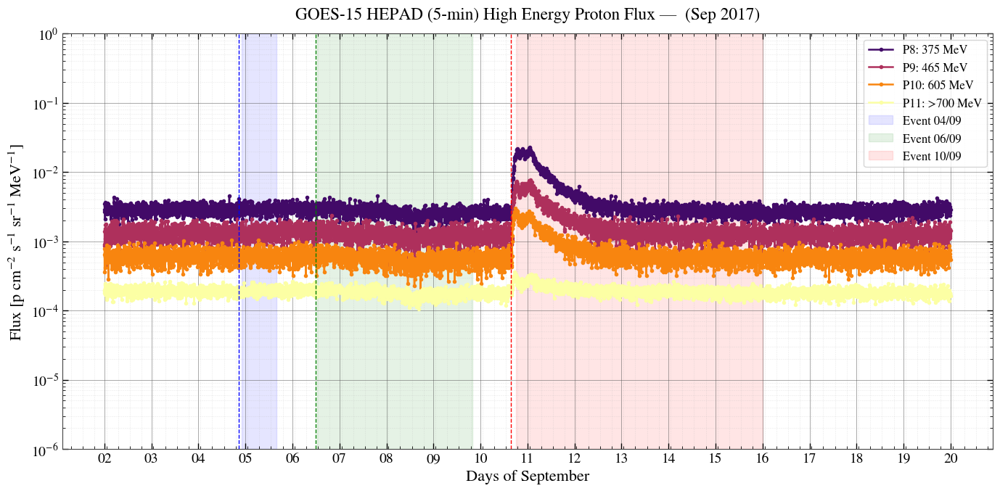

In [7]:
# Analisi dati GOES-15 HEPAD (High Energy) 5min - Evento SEP 2017

file_path_hepad = "File_scaricati_eventiSEP/Evento SEP 2017/g15_hepad_ap_5m_20170901_20170930.csv"

# Cerca dinamicamente l'header
header_line_index_hepad = 0
column_names_hepad = []

with open(file_path_hepad, "r") as f:
    for i, line in enumerate(f):
        if "time_tag" in line and "P8_FLUX" in line:
            header_line_index_hepad = i
            column_names_hepad = line.strip().split(",")
            break

print(f"Header HEPAD trovato alla riga: {header_line_index_hepad}")
print(f"Numero di colonne: {len(column_names_hepad)}")

# Leggi il dataset
df_hepad_raw = pd.read_csv(file_path_hepad, skiprows=header_line_index_hepad + 1, header=None, names=column_names_hepad)

print(f"Numero totale righe: {len(df_hepad_raw)}")

# Converti time_tag a datetime
df_hepad_raw['time_tag'] = pd.to_datetime(df_hepad_raw['time_tag'], errors='coerce')
df_hepad_raw = df_hepad_raw.set_index('time_tag')

# Rimuovi valori mancanti (-99999)
df_hepad_raw = df_hepad_raw.replace(-99999, np.nan)

# Seleziona solo le colonne di flusso protoni (P8, P9, P10, P11)
proton_flux_cols_hepad = ['P8_FLUX', 'P9_FLUX', 'P10_FLUX', 'P11_FLUX']

print(f"\nCanali flusso protoni HEPAD trovati: {proton_flux_cols_hepad}")
print(f"Range temporale: {df_hepad_raw.index.min()} → {df_hepad_raw.index.max()}")

# Estrai solo le colonne di interesse
df_hepad = df_hepad_raw[proton_flux_cols_hepad].copy()

print(df_hepad.head())

#----------------------------------------------------------------------------


# PLOT EVENTO SEP 2017 - GOES-15 HEPAD (High Energy Protons)

# Mappa canali energia per legenda
channel_map_hepad = {
    'P8_FLUX': 'P8: 375 MeV',
    'P9_FLUX': 'P9: 465 MeV',
    'P10_FLUX': 'P10: 605 MeV',
    'P11_FLUX': 'P11: >700 MeV'
}

# Finestra evento (5 minuti risoluzione)
df_hepad_evento = df_hepad.loc[start_g15:end_g15]

print(f"Finestra evento HEPAD: {start_g15} → {end_g15}")
print(f"Righe nella finestra (5-min): {len(df_hepad_evento)}")

plt.figure(figsize=(14, 7))

# Colormap per energie molto alte
colors_hepad = plt.cm.inferno(np.linspace(0.2, 1, len(proton_flux_cols_hepad)))

for col, color in zip(proton_flux_cols_hepad, colors_hepad):
    label_text = channel_map_hepad.get(col, col)
    plt.plot(df_hepad_evento.index, df_hepad_evento[col],
             label=label_text,
             color=color,
             linewidth=1.8,
             marker='o',
             markersize=3)

# Aggiungi rettangoli per gli eventi SEP
for event_name, event_info in events.items():
    start_evt = pd.to_datetime(event_info["start"])
    end_evt = pd.to_datetime(event_info["end"])
    plt.axvspan(start_evt, end_evt, color=event_info["color"], alpha=0.1, label=event_name)
    
    # Aggiungi linea verticale per onset time
    onset_time = pd.to_datetime(event_info["onset time "])
    plt.axvline(onset_time, color=event_info["color"], linestyle='--', linewidth=1)



# Formattazione
plt.yscale('log')
plt.ylim(1e-6, 1e0)

plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Days of September')
plt.title(r'GOES-15 HEPAD (5-min) High Energy Proton Flux —  (Sep 2017)', pad=15)

# Formattazione asse temporale
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d'))
ax.xaxis.set_minor_locator(mdates.HourLocator(interval=6))

# Griglia
ax.grid(which='major', linestyle='-', linewidth=0.6, color='0.35', alpha=0.6)
ax.grid(which='minor', linestyle='--', linewidth=0.4, color='0.7', alpha=0.3)

for spine in ax.spines.values():
    spine.set_edgecolor('#444444')
    spine.set_linewidth(0.8)

plt.legend(frameon=True, loc='upper right', fontsize=12, handlelength=2)
plt.tight_layout()
plt.show()
plt.close()

In [6]:
# FIT E SPETTRO: aggiunta analisi HEPAD (P8–P11)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy.optimize import curve_fit

# Impostazioni generali plot
plt.rcParams.update({'font.size': 11, 'font.family': 'sans-serif'})

# ==========================================
# 1. FUNZIONI MATEMATICHE E STATISTICHE
# ==========================================

# Ellison-Ramaty
def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** -gamma) * np.exp(-E / Er)

# Band Function
def band_function(E, A, ga, gb, E0):
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)
    mask_low = E < E_break
    mask_high = ~mask_low
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor
    return res

# Combined Model
def combined_function(E, A, ga, gb, E0, Er_high):
    band = band_function(E, A, ga, gb, E0)
    return band * np.exp(-E / Er_high)

# Helper: Fit nel log-space
def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def func_log(x_in, *params):
        model_y = func(x_in, *params)
        model_y = np.maximum(model_y, 1e-30) 
        return np.log10(model_y)
    
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)
    
    try:
        popt, pcov = curve_fit(func_log, x, np.log10(y), p0=p0, 
                               sigma=sigma_log, absolute_sigma=True, 
                               bounds=bounds, maxfev=20000)
        return popt, pcov
    except:
        return None, None

# Helper: Calcolo Chi-Quadro
def report_fit_stats(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return np.inf
    y_model = func(x, *popt)
    residuals = (y - y_model) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0 
    perr = np.sqrt(np.diag(pcov))
    print(f"--- {model_name} Results ---")
    print(f"Chi-Quadro Ridotto: {chi_red:.2f} (dof={dof})")
    return chi_red

# Helper: Formattazione testo
def fmt_param(val, err, is_sci=False):
    if is_sci: 
        return rf"{val:.1e} $\pm$ {err:.1e}"
    elif val > 100 or err > 100: 
        return rf"{val:.0f} $\pm$ {err:.0f}"
    else: 
        return rf"{val:.2f} $\pm$ {err:.2f}"

# ==========================================
# 2. CONFIGURAZIONE EVENTI (riuso dict esistente)
# ==========================================
# events deve essere già definito nella notebook oppure viene usato quello qui sotto
if 'events' not in globals():
    events = {
        "Event 04/09": {"start": "2017-09-04 22:00", "end": "2017-09-06 12:00", "color": "navy"},
        "Event 06/09 (X9.3)": {"start": "2017-09-06 12:20", "end": "2017-09-10 16:00", "color": "darkgreen"},
        "Event 10/09 (GLE X8.2)": {"start": "2017-09-10 16:05", "end": "2017-09-17 00:00", "color": "firebrick"},
    }

# ==========================================
# 3. SOTTRAZIONE BACKGROUND PER HEPAD
# ==========================================
# ATTENZIONE: serve un DataFrame con colonne P8, P9, P10, P11 nella cella precedente.
# Esempio atteso: df_hepad con le colonne ['P8','P9','P10','P11'] e indice temporale.
if 'df_hepad' in globals():
    hepad_df = df_hepad.copy()
elif 'df_g15' in globals() and set(['P8','P9','P10','P11']).issubset(getattr(df_g15, 'columns', [])):
    hepad_df = df_g15[['P8','P9','P10','P11']].copy()
elif 'df_g15_raw' in globals() and set(['P8','P9','P10','P11']).issubset(getattr(df_g15_raw, 'columns', [])):
    hepad_df = df_g15_raw[['P8','P9','P10','P11']].copy()
else:
    raise ValueError("DataFrame HEPAD non trovato. Fornire 'df_hepad' con colonne ['P8','P9','P10','P11'].")

# Mappatura canali HEPAD (soglie integrali)
hepad_bins_map = {'P8': 350.0, 'P9': 420.0, 'P10': 510.0, 'P11': 700.0}
hepad_cols = [c for c in ['P8','P9','P10','P11'] if c in hepad_df.columns]
hepad_thresholds = [hepad_bins_map[c] for c in hepad_cols]

# Intervallo di background (riuso se già definiti)
start_bg = globals().get('start_bg', "2017-09-03 00:00:00")
end_bg   = globals().get('end_bg',   "2017-09-04 00:00:00")

# Background e correzione
df_bg_he = hepad_df.loc[start_bg:end_bg]
background_mean_he = df_bg_he[hepad_cols].mean()
df_hepad_corr = hepad_df[hepad_cols] - background_mean_he
df_hepad_corr[df_hepad_corr < 0] = 0

# ==========================================
# 4. ANALISI E FIT HEPAD (P8–P11)
# ==========================================
fig_he, axes_he = plt.subplots(1, len(events), figsize=(22, 8), sharey=True)
axes_he = np.atleast_1d(axes_he).flatten()

x_fit_plot_he = np.logspace(np.log10(100), np.log10(4000), 300)  # HEPAD >~350 MeV

print("--- AVVIO FIT SPETTRALI HEPAD (P8–P11) ---")

for i, (evt_name, params) in enumerate(events.items()):
    ax = axes_he[i]
    colore = params["color"]
    t_start = pd.to_datetime(params["start"])
    t_end = pd.to_datetime(params["end"])

    # A. Dati Temporali
    dt_evt = df_hepad_corr.loc[t_start:t_end]
    if dt_evt.empty:
        ax.set_title(evt_name + " (no data)", fontsize=12, color='gray')
        continue
    time_deltas = dt_evt.index.to_series().diff().dt.total_seconds().fillna(0)

    # B. Fluenza Integrale per canale (somma su intervallo)
    integral_fluences = []
    for col in hepad_cols:
        F = (dt_evt[col] * time_deltas).sum()
        integral_fluences.append(F)

    # C. Conversione INTEGRALE -> DIFFERENZIALE
    x_diff, y_diff, x_err_low, x_err_high = [], [], [], []
    for j in range(len(hepad_thresholds) - 1):
        E_low = hepad_thresholds[j]
        E_high = hepad_thresholds[j+1]
        dPhi = integral_fluences[j] - integral_fluences[j+1]
        dE = E_high - E_low
        if dPhi > 0 and dE > 0:
            y_val = dPhi / dE
            x_val = np.sqrt(E_low * E_high)
            x_diff.append(x_val)
            y_diff.append(y_val)
            x_err_low.append(x_val - E_low)
            x_err_high.append(E_high - x_val)

    # Ultimo canale (>700 MeV) esteso a 4000 MeV
    LAST_BIN_MAX_HE = 4000.0
    if integral_fluences[-1] > 0:
        y_last = integral_fluences[-1] / (LAST_BIN_MAX_HE - hepad_thresholds[-1])
        x_last = np.sqrt(hepad_thresholds[-1] * LAST_BIN_MAX_HE)
        x_diff.append(x_last)
        y_diff.append(y_last)
        x_err_low.append(x_last - hepad_thresholds[-1])
        x_err_high.append(LAST_BIN_MAX_HE - x_last)

    # Dati per fit
    x_data = np.array(x_diff, dtype=float)
    y_data = np.array(y_diff, dtype=float)
    if len(x_data) < 2 or np.all(y_data <= 0):
        ax.set_title(evt_name + " (insufficient HEPAD points)", fontsize=12, color='gray')
        continue
    y_err = np.maximum(y_data * 0.20, 1e-30)  # 20% sistematico
    x_errs = [x_err_low, x_err_high]

    # Plot dati
    ax.errorbar(x_data, y_data, yerr=y_err, xerr=x_errs,
                fmt='o', color='black', ecolor='#444444', capsize=3, markersize=5,
                label='HEPAD Diff. Data', zorder=10)

    print(f"\n{'='*40}\nEvento (HEPAD): {evt_name}")
    stats_text = ""

    # FIT 1: Ellison-Ramaty (più stabile con pochi punti)
    p0_er = [1e4, 3.0, 300.0]  # A, gamma, Er
    bounds_er = ([0, 0.5, 50.0], [np.inf, 10.0, 5000.0])
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x_data, y_data, y_err, p0_er, bounds=bounds_er)
    if popt_er is not None:
        ax.plot(x_fit_plot_he, ellison_ramaty(x_fit_plot_he, *popt_er),
                '--', color='royalblue', alpha=0.9, label='Ellison-Ramaty')
        perr_er = np.sqrt(np.diag(pcov_er))
        chi_er = report_fit_stats("Ellison-Ramaty (HEPAD)", ellison_ramaty, x_data, y_data, y_err, popt_er, pcov_er)
        stats_text += rf"$\bf{{Ellison\text{-}Ramaty}}$ ($\chi^2_\nu={chi_er:.1f}$)" + "\n"
        stats_text += rf" $\gamma$: {fmt_param(popt_er[1], perr_er[1])}" + "\n"
        stats_text += rf" $E_r$: {fmt_param(popt_er[2], perr_er[2])} MeV" + "\n"

    # FIT 2: Band (attenzione ai gradi di libertà bassi)
    if len(x_data) >= 5:  # evitare dof<=0
        p0_band = [1e4, 1.0, 3.5, 50.0]
        bounds_band = ([0, 0.0, 2.0, 1.0], [np.inf, 5.0, 8.0, 1000.0])
        popt_band, pcov_band = fit_log_space(band_function, x_data, y_data, y_err, p0_band, bounds=bounds_band)
        if popt_band is not None:
            ax.plot(x_fit_plot_he, band_function(x_fit_plot_he, *popt_band),
                    '-.', color='forestgreen', alpha=0.9, label='Band')
            perr_band = np.sqrt(np.diag(pcov_band))
            chi_band = report_fit_stats("Band (HEPAD)", band_function, x_data, y_data, y_err, popt_band, pcov_band)
            stats_text += "\n" + rf"$\bf{{Band}}$ ($\chi^2_\nu={chi_band:.1f}$)" + "\n"
            stats_text += rf" $\gamma_a$: {fmt_param(popt_band[1], perr_band[1])}" + "\n"
            stats_text += rf" $\gamma_b$: {fmt_param(popt_band[2], perr_band[2])}" + "\n"
            stats_text += rf" $E_0$: {fmt_param(popt_band[3], perr_band[3])} MeV" + "\n"

            # FIT 3: Combined (Band * exp cutoff alto)
            p0_comb = [popt_band[0], max(0.1, popt_band[1]), popt_band[2], popt_band[3], 800.0]
            popt_comb, pcov_comb = fit_log_space(
                combined_function, x_data, y_data, y_err, p0_comb,
                bounds=([0, 0.0, 2.0, 1.0, 50.0], [np.inf, 8.0, 8.0, 2000.0, 8000.0])
            )
            if popt_comb is not None:
                ax.plot(x_fit_plot_he, combined_function(x_fit_plot_he, *popt_comb),
                        '-', color='firebrick', linewidth=2.2, label='Combined')
                perr_comb = np.sqrt(np.diag(pcov_comb))
                chi_comb = report_fit_stats("Combined (HEPAD)", combined_function, x_data, y_data, y_err, popt_comb, pcov_comb)
                stats_text += "\n" + rf"$\bf{{Combined}}$ ($\chi^2_\nu={chi_comb:.1f}$)" + "\n"
                stats_text += rf" $E_r$: {fmt_param(popt_comb[4], perr_comb[4])} MeV"

                # Export SPENVIS (HEPAD)
                print(f" -> Saving SPENVIS (HEPAD) for {evt_name}...")
                en_grid = np.logspace(np.log10(100.0), np.log10(4000.0), 100)
                fl_sp = combined_function(en_grid, *popt_comb)
                df_sp = pd.DataFrame({'Energy': en_grid, 'Fluence': fl_sp})
                fname = f"SPENVIS_HEPAD_{evt_name.replace(' ', '_').replace('/','-')}.txt"
                df_sp.to_csv(fname, sep='\t', index=False, float_format='%.6e')

    # Styling
    ax.set_title(f"{evt_name} (HEPAD)", fontsize=14, color=colore, fontweight='bold', pad=10)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim(200, 4000)
    ax.set_ylim(1e-3, 1e8)
    ax.grid(True, which="major", color='#b0b0b0', linestyle='-', alpha=0.5)
    ax.grid(True, which="minor", color='#d0d0d0', linestyle=':', alpha=0.3)
    ax.set_xlabel("Energy (MeV)", fontsize=12)
    if i == 0:
        ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)

    ax.text(0.03, 0.03, stats_text, transform=ax.transAxes, fontsize=9,
            va='bottom', ha='left',
            bbox=dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.92, edgecolor='#aaaaaa'))
    ax.legend(loc='upper right', fontsize=10, framealpha=0.9)

plt.suptitle('GOES-15 HEPAD Spectral Analysis (P8–P11)', fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96])
plt.show()


SyntaxError: f-string: expecting a valid expression after '{' (671946748.py, line 196)

In [8]:
plt.close('all') 



#### Data on MARS SEP 2017 

The September 2017 event produced the strongest radiation flux measured at Mars by the Mars Atmosphere and Volatile Evolution (MAVEN) mission since late 2014. Such events may not only have effects on the evolution of the atmosphere but also pose a problem for equipment and future human presence. In order to understand how unusual events such as the September 2017 event are at Mars, we use MAVEN data to estimate the sensitivity to radiation of instruments on the older Mars Express (2004-) spacecraft. We find the September 2017 event to be the fourth strongest radiation event observed by Mars Express.

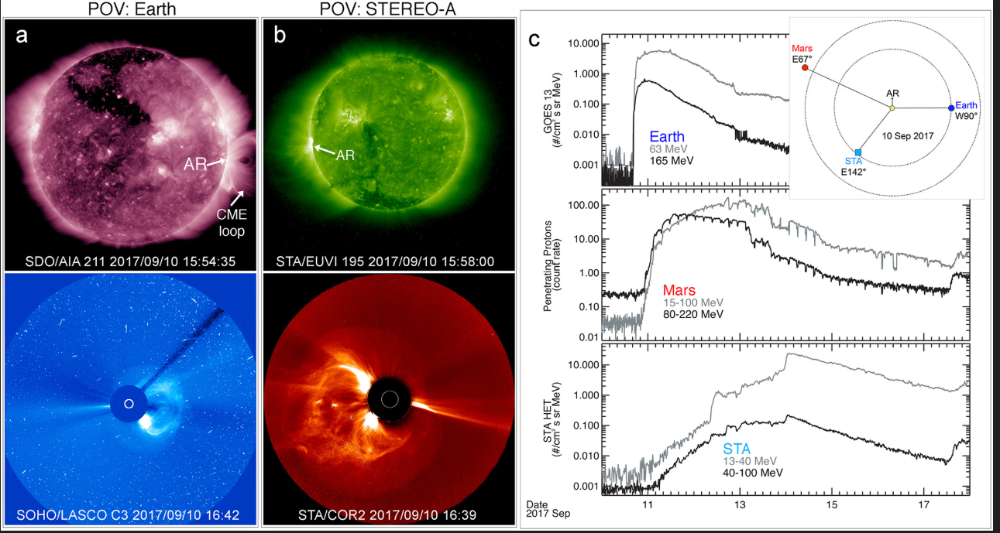


Paper : https://agupubs.onlinelibrary.wiley.com/doi/10.1029/2018GL079162


High-energy SEP protons associated with this fast CME were observed at Earth and STA as well as at Mars. Figure 1c (top to bottom) shows the SEP proton measurements by GOES-13, MAVEN/SEP, and the STA High Energy Telescope (HET; von Rosenvinge et al., 2008). Because of the western location of AR2673 with respect to the Sun-Earth line, GOES-13 detected the prompt arrival of SEP protons (at ∼16:30 UT on 10 September 2017 for the 165-MeV energy channel shown) due to the apparent magnetic field line connection of Earth to the CME-driven shock source near the Sun. Meanwhile, AR2673 was located at E67° with respect to the Sun-Mars line and thus MAVEN/SEP detected a later arrival of SEP protons (at ∼22:00 UT on 10 September 2017 for the 80- to 220-MeV energy channel shown) when the CME shock was further away from the Sun and magnetically connected to Mars (for example, see Figure 6d in Luhmann et al., 2018). STA/HET detected SEP protons even later (at ∼06:00 UT on 11 September 2017 for the 60- to 100-MeV energy channel shown) when the CME shock had travelled further outward to magnetically connect with STA (for example, see Figure 6b in Luhmann et al., 2018).


DATA da https://cdaweb.gsfc.nasa.gov/cgi-bin/eval1.cgi

In [9]:
# Analisi dati SEP da MAVEN Sensor 1 Calibrated Spectra SEP 2017


import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# -----------------------------------------------------------------------
# 1. CONFIGURAZIONE STILE PAPER (uguale al tuo script GOES)
# -----------------------------------------------------------------------
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['legend.fontsize'] = 12

mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['xtick.top'] = True
mpl.rcParams['ytick.right'] = True
mpl.rcParams['xtick.major.size'] = 6
mpl.rcParams['xtick.minor.size'] = 3
mpl.rcParams['ytick.major.size'] = 6
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1.0
mpl.rcParams['ytick.major.width'] = 1.0

mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['axes.grid'] = False

# -----------------------------------------------------------------------
# 2. CARICAMENTO DATI (Simulazione file o File Reale)
# -----------------------------------------------------------------------

# File MAVEN SEP Sensor 1
file_path_maven = r"File_scaricati_eventiSEP\Evento SEP 2017\MAVEN 2017\MVN_SEP_L2_S1-CAL-SVY-FULL_2194726.txt1"

# Apri il file reale
f = open(file_path_maven, "r")

# Cerca la riga con EPOCH (inizio header colonne)
header_line_index = None
for i, line in enumerate(f):
    if line.startswith('EPOCH'):
        header_line_index = i
        break

f.close()

print(f"Header EPOCH trovato alla riga: {header_line_index}")

# Il file ha 3 righe di header dopo EPOCH:
# 1. EPOCH + nomi colonne
# 2. energie (@_~XX.X_keV)
# 3. unità di misura (dd-mm-yyyy hh:mm:ss...)
# I dati iniziano alla riga header_line_index + 3

# Leggi il dataset saltando header
df_maven_raw = pd.read_csv(file_path_maven, skiprows=header_line_index+3, header=None, sep='\\s+')
# 3. PULIZIA E PREPARAZIONE DATI
# -----------------------------------------------------------------------

# Parsing della data MAVEN
# Formato: "05-09-2017 00:00:03.389.599"
# Problema: il tempo ha due punti nei microsecondi (.mil.mic)
# Soluzione: combiniamo data+ora e prendiamo solo millisecondi

def parse_maven_datetime(row):
    date_part = str(row[0])
    time_part = str(row[1])
    # Formato: HH:MM:SS.mmm.uuu -> prendiamo HH:MM:SS.mmm
    clean_time = time_part[:12]  # "00:00:03.389"
    return pd.to_datetime(f"{date_part} {clean_time}", format='%d-%m-%Y %H:%M:%S.%f', errors='coerce')

df_maven_raw['datetime'] = df_maven_raw.apply(parse_maven_datetime, axis=1)

# Rimuovi righe con datetime invalido (NaT)
df_maven_raw = df_maven_raw[df_maven_raw['datetime'].notna()].copy()

df_maven_raw.set_index('datetime', inplace=True)

# Converti colonne numeriche (saltando datetime)
for col in df_maven_raw.columns:
    if col != 'datetime':
        df_maven_raw[col] = pd.to_numeric(df_maven_raw[col], errors='coerce')

# Sostituisci 0.0 con NaN per evitare errori nel plot logaritmico
df_maven_raw = df_maven_raw.replace(0.0, np.nan)

# Struttura colonne:
# 0: date, 1: time, 2: attenuator_state
# 3-30: F_ION_FLUX (28 canali, ~20-6500 keV)
# 31-45: F_ELEC_FLUX (15 canali, ~20-195 keV)
# 46-73: R_ION_FLUX (28 canali)
# 74-88: R_ELEC_FLUX (15 canali)
# Resto: energie

# Selezioniamo alcuni canali rappresentativi Forward Ion:
selected_cols = {
    3:  r"F_ION $\sim$20 keV",     # Primo canale ioni Forward
    10: r"F_ION $\sim$76 keV",     # Canale medio-basso
    17: r"F_ION $\sim$330 keV",    # Canale medio
    24: r"F_ION $\sim$2.9 MeV"     # Canale alto
}

print(f"Range temporale MAVEN: {df_maven_raw.index.min()} → {df_maven_raw.index.max()}")


Header EPOCH trovato alla riga: 65


C:\Users\stefa\AppData\Local\Temp\ipykernel_22796\3893200972.py:63: DtypeWarning: Columns (2,3,4,5,6,7,8,9,10,11) have mixed types. Specify dtype option on import or set low_memory=False.
  df_maven_raw = pd.read_csv(file_path_maven, skiprows=header_line_index+3, header=None, sep='\\s+')


Range temporale MAVEN: 2017-09-05 00:00:03.389000 → 2017-09-18 23:59:54.326000


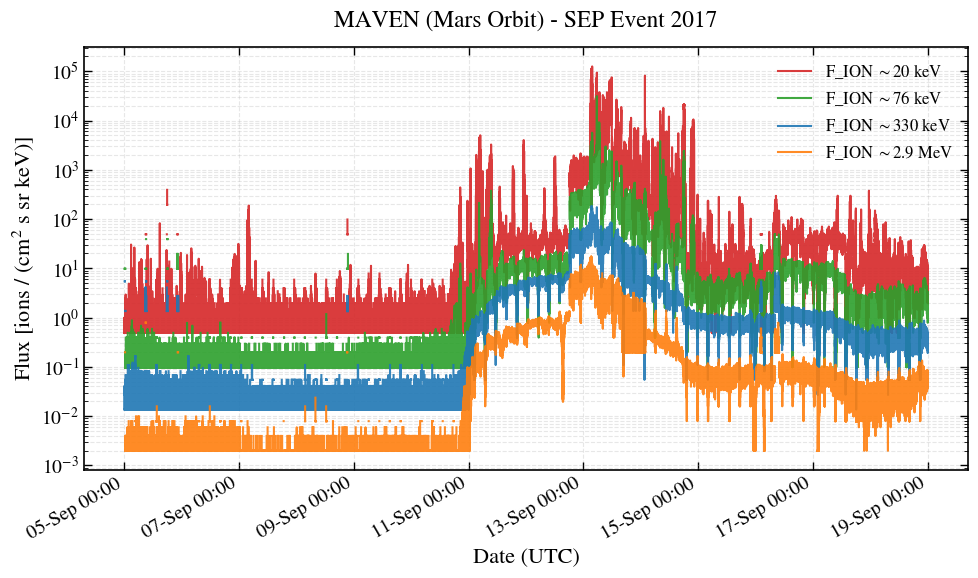

In [3]:

# -----------------------------------------------------------------------
# 4. PLOTTING (Stile Paper)
# -----------------------------------------------------------------------

fig, ax = plt.subplots(figsize=(10, 6))

colors = ['#d62728', '#2ca02c', '#1f77b4', '#ff7f0e'] # Rosso, Verde, Blu, Arancione

for i, (col_idx, label) in enumerate(selected_cols.items()):
    ax.plot(df_maven_raw.index, df_maven_raw[col_idx], 
            label=label, 
            color=colors[i], 
            linewidth=1.5,
            alpha=0.9)

# Configurazione Assi
ax.set_yscale('log')
ax.set_ylabel(r'Flux [ions / (cm$^2$ s sr keV)]')
ax.set_xlabel('Date (UTC)')
ax.set_title('MAVEN (Mars Orbit) - SEP Event 2017', pad=15)

# Formattazione Date
date_format = mdates.DateFormatter('%d-%b %H:%M')
ax.xaxis.set_major_formatter(date_format)
fig.autofmt_xdate()

# Legend e Grid
ax.legend(loc='upper right', frameon=False)
ax.grid(True, which="both", ls="--", alpha=0.3) # Opzionale, rimosso per stile paper pulito

plt.tight_layout()
plt.show()

# -----------------------------------------------------------------------
# Se vuoi salvare:
# plt.savefig("maven_sep_2017_paper_style.png", dpi=300, bbox_inches='tight')


C:\Users\stefa\AppData\Local\Temp\ipykernel_15600\340491128.py:3: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_maven_hourly = df_maven_raw.resample('1H').mean()


Righe con media oraria MAVEN: 336


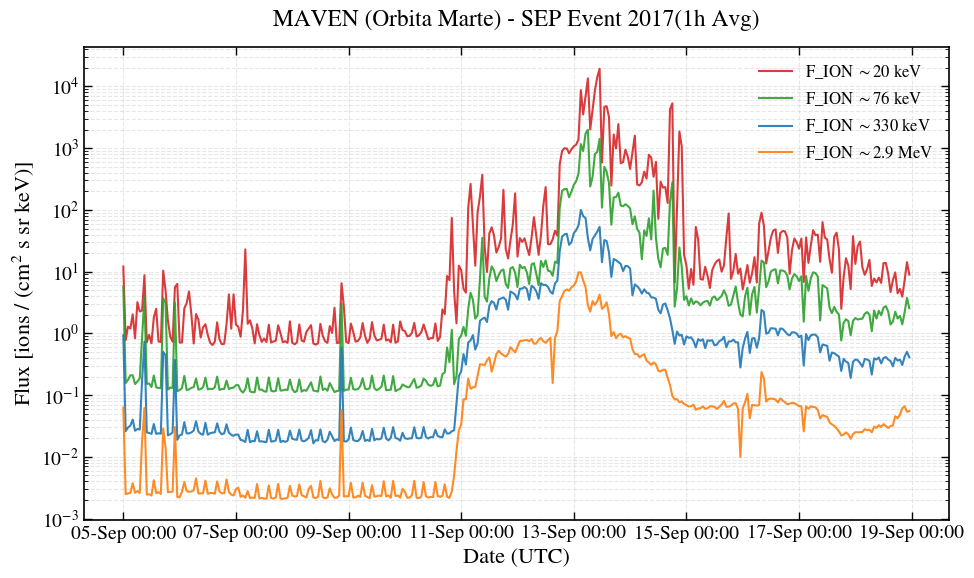

In [53]:
#1h mean 

df_maven_hourly = df_maven_raw.resample('1H').mean()
print(f"Righe con media oraria MAVEN: {len(df_maven_hourly)}")
plt.figure(figsize=(10, 6))
for i, (col_idx, label) in enumerate(selected_cols.items()):
    plt.plot(df_maven_hourly.index, df_maven_hourly[col_idx], 
             label=label, 
             color=colors[i], 
             linewidth=1.5,
             alpha=0.9)
plt.yscale('log')
plt.ylabel(r'Flux [ions / (cm$^2$ s sr keV)]')
plt.xlabel('Date (UTC)')
plt.title('MAVEN (Orbita Marte) - SEP Event 2017(1h Avg)', pad=15)
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b %H:%M'))
fig.autofmt_xdate()
ax.grid(True, which="both", ls="--", alpha=0.3) # Opzionale
plt.legend(loc='upper right', frameon=False)
plt.tight_layout()
plt.show()

In [5]:
plt.close('all')

# More precise MAVEN data 
https://lasp.colorado.edu/maven/sdc/public/data/sci/sep/l2/2017/09/

## Evento Ioni pesanti JUL 2000 


4.3 – SEE (Single Event Effects)

Per gli eventi con heavy ions:

Usa ACE/SIS (Solar Isotope spectrometer) come spettro di input
https://cdaweb.gsfc.nasa.gov/cgi-bin/eval3.cgi

Calcola LET spectrum dentro la schermatura

Confronta con threshold LET dei componenti elettronici

- Start:  12/07/2000
- End: 20/07/2000 

O_flux ossigeno 
Fe_flux ferro
He-flux elio 


Leggo file: File_scaricati_eventiSEP\Evento JUL 2000\AC_H2_SIS_61995.txt
Trovate 66 colonne nell'header.
Caricate 193 righe di dati grezzi.
Righe valide dopo pulizia: 193
Canale Ossigeno: FLUX_O_7.3-10.0
Canale Ferro:    FLUX_FE_10.7-15.8


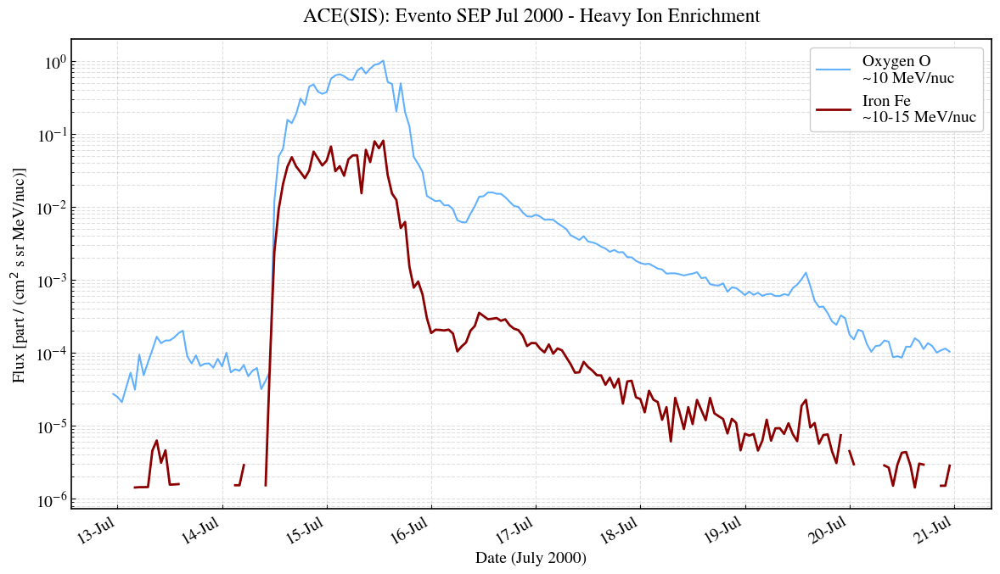


✅ Analisi completata. Il grafico mostra l'arricchimento di Ferro durante l'evento.


In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib as mpl
import numpy as np
import io
import os

# --- 1. CONFIGURAZIONE STILE PAPER ---
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.grid'] = True
mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'

# --- 2. CARICAMENTO DATI ---
# Percorso del file (raw string per evitare errori backslash)
filename = r"File_scaricati_eventiSEP\Evento JUL 2000\AC_H2_SIS_61995.txt" 

print(f"Leggo file: {filename}")

try:
    # A. TROVA HEADER E INIZIO DATI
    header_names = []
    start_data_row = 0
    
    with open(filename, 'r') as f:
        lines = f.readlines()
        
    for i, line in enumerate(lines):
        # Cerca la riga con i nomi delle colonne
        if line.strip().startswith('EPOCH'):
            raw_header = line.strip().split()
            # Sostituiamo 'EPOCH' (1 colonna) con 'Date' e 'Time' (2 colonne)
            # per allinearci con il formato reale dei dati MAVEN/ACE in ASCII
            header_names = ['Date', 'Time'] + raw_header[1:] 
            
            # I dati iniziano 2 righe dopo (salta riga header + riga unità)
            start_data_row = i + 2 
            break
    
    if not header_names:
        raise ValueError("Non ho trovato la riga 'EPOCH' nell'header!")

    print(f"Trovate {len(header_names)} colonne nell'header.")

    # B. LEGGI DATI IGNORANDO COMMENTI
    # sep=r'\s+' usa una raw string per evitare il SyntaxWarning
    # comment='#' dice a pandas di ignorare tutto ciò che segue un # (gestisce il footer)
    df = pd.read_csv(filename, 
                     skiprows=start_data_row, 
                     header=None, 
                     sep=r'\s+', 
                     names=header_names, 
                     comment='#', 
                     on_bad_lines='skip')
    
    print(f"Caricate {len(df)} righe di dati grezzi.")

    # --- 3. PULIZIA E FORMATTAZIONE ---
    
    # Gestione robusta delle date:
    # errors='coerce' trasforma in NaT le righe che non sono date (es. residui di footer)
    df['datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], dayfirst=True, errors='coerce')
    
    # Rimuovi le righe dove la data non è stata convertita (pulisce il footer residuo)
    df = df.dropna(subset=['datetime'])
    df.set_index('datetime', inplace=True)
    
    print(f"Righe valide dopo pulizia: {len(df)}")

    # --- 4. SELEZIONE CANALI (Smart Search) ---
    
    # Cerca colonna Ossigeno (~10-13 MeV)
    col_O_list = [c for c in df.columns if 'FLUX_O' in c and '10.0' in c]
    # Fallback se non trova esattamente 10.0
    if not col_O_list: col_O_list = [c for c in df.columns if 'FLUX_O' in c][0:1] 
    col_O = col_O_list[0]

    # Cerca colonna Ferro (~10-15 MeV)
    col_Fe_list = [c for c in df.columns if 'FLUX_FE' in c and '10.7' in c]
    # Fallback
    if not col_Fe_list: col_Fe_list = [c for c in df.columns if 'FLUX_FE' in c][0:1]
    col_Fe = col_Fe_list[0]
    
    print(f"Canale Ossigeno: {col_O}")
    print(f"Canale Ferro:    {col_Fe}")
    
    # Pulizia Zeri (per scala logaritmica)
    df[col_O] = pd.to_numeric(df[col_O], errors='coerce').replace(0.0, np.nan)
    df[col_Fe] = pd.to_numeric(df[col_Fe], errors='coerce').replace(0.0, np.nan)

    # --- 5. PLOT WORST CASE ---
    fig, ax = plt.subplots(figsize=(12, 7))
    
    # Plot Ossigeno
    ax.plot(df.index, df[col_O], 
            color='dodgerblue', alpha=0.7, linewidth=1.5, 
            label=f'Oxygen O\n~10 MeV/nuc')

    # Plot Ferro (Highlight)
    ax.plot(df.index, df[col_Fe], 
            color='darkred', linewidth=2.0, 
            label=f'Iron Fe \n~10-15 MeV/nuc')

    # Configurazione Assi
    ax.set_yscale('log')
    ax.set_ylabel(r'Flux [part / (cm$^2$ s sr MeV/nuc)]')
    ax.set_xlabel('Date (July 2000)')
    ax.set_title(r'ACE(SIS): Evento SEP Jul 2000 - Heavy Ion Enrichment', pad=15)
    
    # Formattazione Date
    date_fmt = mdates.DateFormatter('%d-%b')
    ax.xaxis.set_major_formatter(date_fmt)
    fig.autofmt_xdate()
    
    # Griglia e Legenda
    ax.grid(True, which="both", ls="--", alpha=0.4)
    ax.legend(loc='upper right', frameon=True, framealpha=1)
    
   
    plt.tight_layout()
    plt.show()
    
    print("\n✅ Analisi completata. Il grafico mostra l'arricchimento di Ferro durante l'evento.")

except Exception as e:
    print(f"❌ Errore: {e}")

--- INIZIO ANALISI ---
Leggo: File_scaricati_eventiSEP\Evento JUL 2000\AC_H2_SIS_61995.txt
✅ Dati caricati: 193 righe valide.
Ioni trovati: ['HE', 'C', 'O', 'FE']


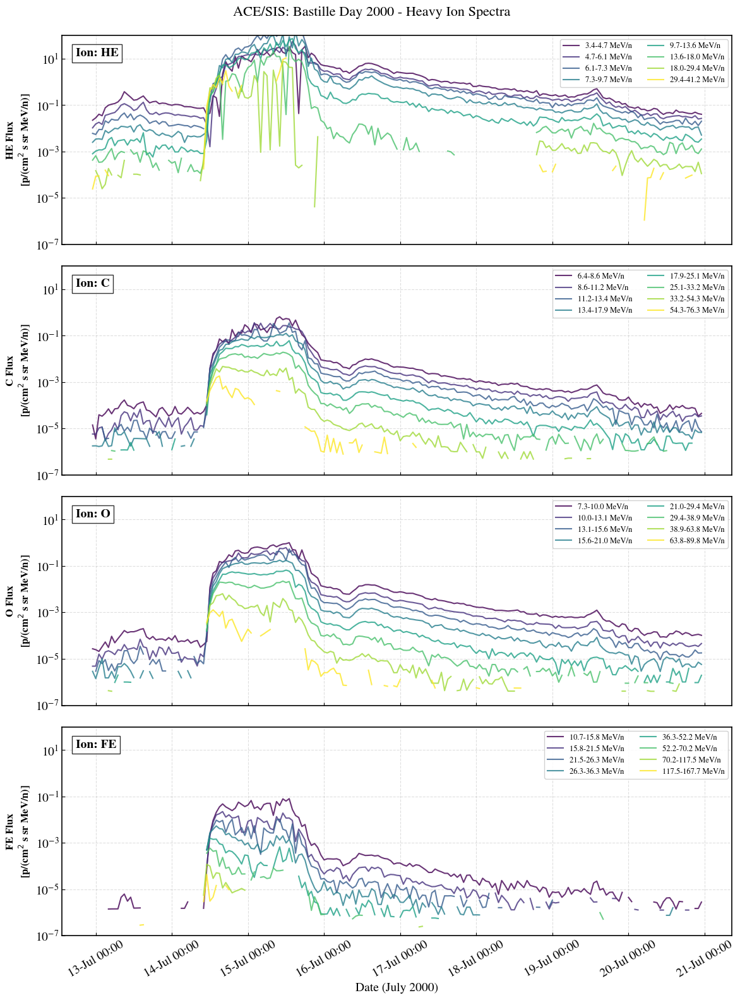


✅ Grafico generato con successo!
Visualizzati 4 ioni con tutti i canali energetici.


In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib as mpl
import numpy as np
import sys

# ==========================================
# 🛠️ CONFIGURAZIONE UTENTE
# ==========================================

# 1. Percorso del file (Usa r"" per evitare errori con i backslash di Windows)
FILENAME = r"File_scaricati_eventiSEP\Evento JUL 2000\AC_H2_SIS_61995.txt"

# 2. Limiti asse Y (Minimo, Massimo) per il flusso
# Modifica questi valori per zoomare verticalmente
Y_LIMITS = (1e-7, 1e2) 

# ==========================================

# --- Configurazione Stile ---
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.grid'] = True
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'

print(f"--- INIZIO ANALISI ---")
print(f"Leggo: {FILENAME}")

try:
    # --- 1. PARSING INTELLIGENTE DELL'HEADER ---
    header_names = []
    start_data_row = 0
    
    with open(FILENAME, 'r') as f:
        lines = f.readlines()
        
    for i, line in enumerate(lines):
        if line.strip().startswith('EPOCH'):
            raw_header = line.strip().split()
            # Corregge il disallineamento: EPOCH nel file diventa Date + Time
            header_names = ['Date', 'Time'] + raw_header[1:]
            start_data_row = i + 2 # Salta header e unità
            break
            
    if not header_names:
        raise ValueError("❌ Errore: Non trovo la riga 'EPOCH' nell'header.")

    # --- 2. CARICAMENTO DATI ---
    # sep=r'\s+' gestisce spazi multipli come separatori
    df = pd.read_csv(FILENAME, 
                     skiprows=start_data_row, 
                     header=None, 
                     sep=r'\s+', 
                     names=header_names, 
                     comment='#', # Ignora le righe di footer
                     on_bad_lines='skip')

    # Creazione indice temporale
    # errors='coerce' gestisce eventuali righe finali sporche trasformandole in NaT
    df['datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], dayfirst=True, errors='coerce')
    df = df.dropna(subset=['datetime']) # Rimuove righe non valide
    df.set_index('datetime', inplace=True)
    
    print(f"✅ Dati caricati: {len(df)} righe valide.")

    # --- 3. IDENTIFICAZIONE IONI E CANALI ---
    # Trova tutte le colonne di flusso (iniziano con FLUX_)
    flux_cols = [c for c in df.columns if c.startswith('FLUX_')]
    
    # Estrae i nomi unici degli ioni (es. da FLUX_HE_... estrae 'HE')
    # Set per unicità, poi lista ordinata
    available_ions = sorted(list(set([c.split('_')[1] for c in flux_cols])), key=lambda x: len(x))
    # Nota: l'ordinamento per lunghezza mette C, O, Fe, He in ordine quasi atomico o alfabetico
    # Forziamo un ordine logico se presenti: HE, C, O, FE
    preferred_order = ['HE', 'C', 'O', 'FE']
    available_ions = [ion for ion in preferred_order if ion in available_ions]
    
    print(f"Ioni trovati: {available_ions}")

    # --- 4. PLOT MULTIPLO (SUBPLOTS) ---
    # Crea una figura con tanti pannelli quanti sono gli ioni
    fig, axes = plt.subplots(nrows=len(available_ions), ncols=1, 
                             figsize=(12, 4 * len(available_ions)), 
                             sharex=True)
    
    # Se c'è un solo ione, axes non è una lista, lo rendiamo tale
    if len(available_ions) == 1: axes = [axes]

    # Colormap per distinguere i canali energetici
    cmap = mpl.colormaps['viridis']

    for ax, ion in zip(axes, available_ions):
        # Trova tutte le colonne per questo ione
        ion_cols = [c for c in flux_cols if f'_{ion}_' in c]
        
        # Colori: genera N colori graduati
        colors = [cmap(i) for i in np.linspace(0, 1, len(ion_cols))]
        
        for col, color in zip(ion_cols, colors):
            # Pulisci i dati: converte in numeri e rimuove zeri/errori
            series = pd.to_numeric(df[col], errors='coerce').replace(0.0, np.nan)
            
            # Estrai etichetta energia pulita (toglie FLUX_ION_)
            label_energy = col.replace(f"FLUX_{ion}_", "") + " MeV/n"
            
            ax.plot(df.index, series, label=label_energy, color=color, linewidth=1.5, alpha=0.8)
        
        # Stile del Sotto-Grafico
        ax.set_yscale('log')
        ax.set_ylim(Y_LIMITS) # <--- Applica il limite Y scelto da te
        ax.set_ylabel(f'{ion} Flux\n[p/(cm$^2$ s sr MeV/n)]', fontsize=12, fontweight='bold')
        ax.grid(True, which="both", ls="--", alpha=0.4)
        ax.legend(loc='upper right', fontsize=9, ncol=2, framealpha=0.9)
        
        # Titolo interno per capire che ione è
        ax.text(0.02, 0.9, f'Ion: {ion}', transform=ax.transAxes, 
                fontsize=14, fontweight='bold', bbox=dict(facecolor='white', alpha=0.8))

    # Formattazione Asse X (Solo sull'ultimo grafico in basso)
    axes[-1].set_xlabel('Date (July 2000)', fontsize=14)
    axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%d-%b %H:%M'))
    plt.xticks(rotation=30)
    
    fig.suptitle('ACE/SIS: Bastille Day 2000 - Heavy Ion Spectra', fontsize=16, y=0.99)
    plt.tight_layout()
    plt.show()
    
    print("\n✅ Grafico generato con successo!")
    print(f"Visualizzati {len(available_ions)} ioni con tutti i canali energetici.")

except Exception as e:
    print(f"\n❌ ERRORE DURANTE L'ESECUZIONE:")
    print(e)

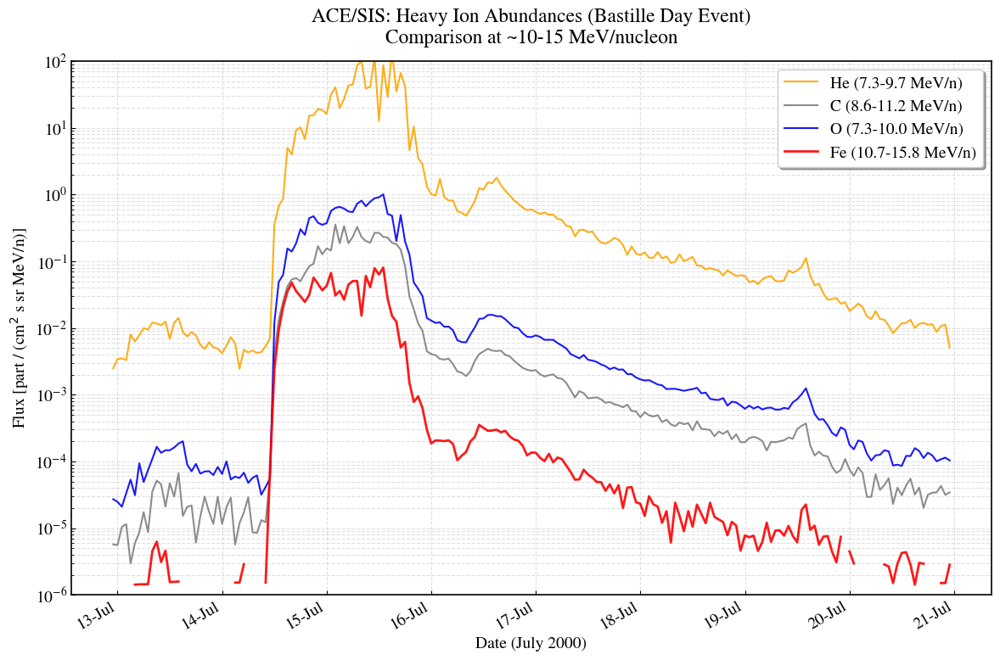

✅ Plot generato.
Nota: Il Ferro (Rosso) è più basso di O e He, ma ricorda che il danno (LET)
è proporzionale a Z^2. Il Ferro fa danni enormi anche a flussi bassi.


In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib as mpl
import numpy as np

# --- STILE ---
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.grid'] = True
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'

# --- FILE ---
filename = r"File_scaricati_eventiSEP\Evento JUL 2000\AC_H2_SIS_61995.txt"

try:
    # 1. Parsing Header
    header_names = []
    start_row = 0
    with open(filename, 'r') as f:
        lines = f.readlines()
    
    for i, line in enumerate(lines):
        if line.strip().startswith('EPOCH'):
            raw = line.strip().split()
            header_names = ['Date', 'Time'] + raw[1:]
            start_row = i + 2
            break
            
    # 2. Loading
    df = pd.read_csv(filename, skiprows=start_row, header=None, sep=r'\s+', 
                     names=header_names, comment='#', on_bad_lines='skip')
    
    df['datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], dayfirst=True, errors='coerce')
    df = df.dropna(subset=['datetime']).set_index('datetime')

    # 3. SELEZIONE CANALI "BEST MATCH" (~10-15 MeV/n)
    # Cerchiamo il canale più vicino a ~10 MeV/n per ogni specie
    
    targets = {
        'He': ('FLUX_HE', '9.7'),  # Cerca He attorno a 9.7-10 MeV
        'C':  ('FLUX_C', '11.2'),  # Cerca C attorno a 11 MeV
        'O':  ('FLUX_O', '10.0'),  # Cerca O attorno a 10 MeV
        'Fe': ('FLUX_FE', '10.7')  # Cerca Fe attorno a 10.7 MeV
    }
    
    plot_cols = {}
    
    for ion, (prefix, energy_key) in targets.items():
        candidates = [c for c in df.columns if prefix in c and energy_key in c]
        if candidates:
            plot_cols[ion] = candidates[0]
            # Pulisci dati
            df[candidates[0]] = pd.to_numeric(df[candidates[0]], errors='coerce').replace(0.0, np.nan)
        else:
            print(f"⚠️ Attenzione: Canale {ion} non trovato esattamente, cerco fallback...")
            # Fallback: prendi il primo canale disponibile per quello ione
            fallback = [c for c in df.columns if prefix in c]
            if fallback:
                plot_cols[ion] = fallback[0]
                df[fallback[0]] = pd.to_numeric(df[fallback[0]], errors='coerce').replace(0.0, np.nan)

    # 4. PLOT COMBINATO
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Colori standard per fisica particelle/spazio
    colors = {'He': 'orange', 'C': 'gray', 'O': 'blue', 'Fe': 'red'}
    
    for ion, col_name in plot_cols.items():
        # Estrai etichetta energia pulita
        energy_range = col_name.split('_')[-1] # es. "10.7-15.8"
        label = f"{ion} ({energy_range} MeV/n)"
        
        ax.plot(df.index, df[col_name], 
                label=label, 
                color=colors.get(ion, 'black'), 
                linewidth=2 if ion == 'Fe' else 1.5, # Evidenzia il Ferro
                alpha=0.9)

    ax.set_yscale('log')
    ax.set_ylim(1e-6, 1e2) # Zoom ottimizzato
    
    ax.set_ylabel(r'Flux [part / (cm$^2$ s sr MeV/n)]')
    ax.set_xlabel('Date (July 2000)')
    ax.set_title('ACE/SIS: Heavy Ion Abundances (Bastille Day Event)\nComparison at ~10-15 MeV/nucleon', pad=15)
    
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    fig.autofmt_xdate()
    
    ax.grid(True, which="both", ls="--", alpha=0.4)
    ax.legend(loc='upper right', frameon=True, shadow=True)
    
    plt.tight_layout()
    plt.show()
    
    print("✅ Plot generato.")
    print("Nota: Il Ferro (Rosso) è più basso di O e He, ma ricorda che il danno (LET)")
    print("è proporzionale a Z^2. Il Ferro fa danni enormi anche a flussi bassi.")

except Exception as e:
    print(e)

## protoni per confronto


GOES-8 



Header trovato alla riga: 454
Canali FLUSSO_PROTONI_CORRETTI trovati: ['p1_flux_c', 'p2_flux_c', 'p3_flux_c', 'p4_flux_c', 'p5_flux_c', 'p6_flux_c', 'p7_flux_c']


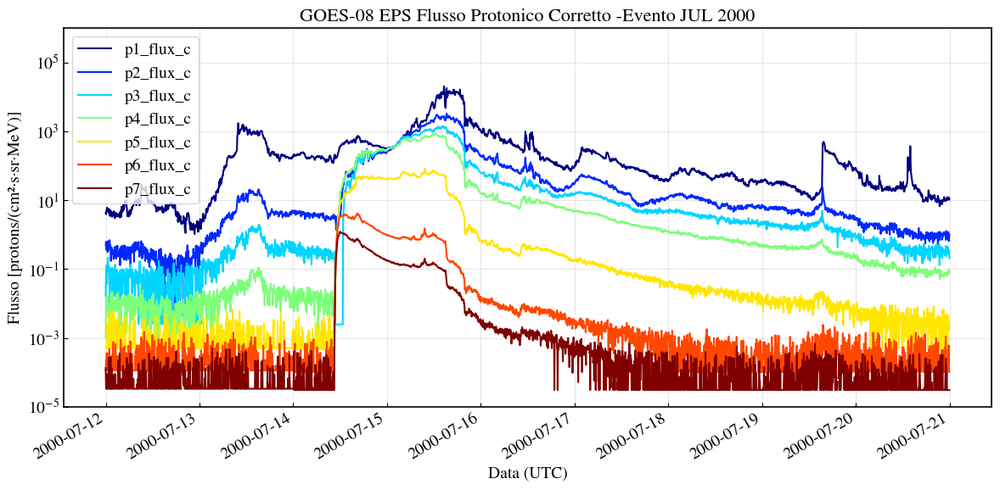

In [38]:
# Analisi dati GOES-11 EPS  5min

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np


file_path = "File_scaricati_eventiSEP/Evento JUL 2000/g08_eps_5m_20000701_20000731.csv"


#Cerca dinamica header che dovrebbe partire con "time_tag" riga 455
header_line_index = 0
column_names = []

with open(file_path, "r") as f:
    for i, line in enumerate(f):
        if "time_tag" in line and "p1_flux" in line:
            header_line_index = i
            column_names = line.strip().split(",")
            break

print(f"Header trovato alla riga: {header_line_index}")


# Dataset 

df = pd.read_csv(file_path, skiprows=header_line_index + 1, header=None, names=column_names)
# quick print
#print(df.head(10))


# PULIZIA DATI

df["time_tag"] = pd.to_datetime(df["time_tag"])
df = df.set_index("time_tag")

#Nan values fix
df = df.replace(-99999, np.nan)

# Scelgo solo i canali di FLUSSO DIFFERENZIALE CORRETTI  
#float p1_flux_c(record);
#p1_flux_c:description = "P1 Proton channel 0.6 - 4.0 MeV corrected.";

proton_cols = [c for c in df.columns if c.startswith("p") and c.endswith("_flux_c")]

print(f"Canali FLUSSO_PROTONI_CORRETTI trovati: {proton_cols}")

# PLOT EVENTO 

start = "2000-07-12"
end = "2000-07-20"
df_evento = df.loc[start:end]

# Colormap per distinguere le energie (dal rosso bassa energia -> al blu/viola alta energia)
colors = plt.cm.jet(np.linspace(0, 1, len(proton_cols)))

plt.figure (figsize=(12, 6))
for col, color in zip(proton_cols, colors):
    plt.plot(df_evento.index, df_evento[col], label=col, linewidth=1.5, color=color)
plt.yscale("log")
plt.ylim(1e-5, 1e6)
plt.title(f"GOES-08 EPS Flusso Protonico Corretto -Evento JUL 2000", fontsize=16)
plt.xlabel("Data (UTC)", fontsize=14)
plt.ylabel("Flusso [protons/(cm²·s·sr·MeV)]", fontsize=14)
plt.grid(alpha=0.3)
plt.legend()

ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m-%Y  %H:%M'))
plt.gcf().autofmt_xdate()

plt.tight_layout()
plt.show()

Header trovato alla riga: 454
Canali FLUSSO_PROTONI_CORRETTI trovati: ['p1_flux_c', 'p2_flux_c', 'p3_flux_c', 'p4_flux_c', 'p5_flux_c', 'p6_flux_c', 'p7_flux_c']


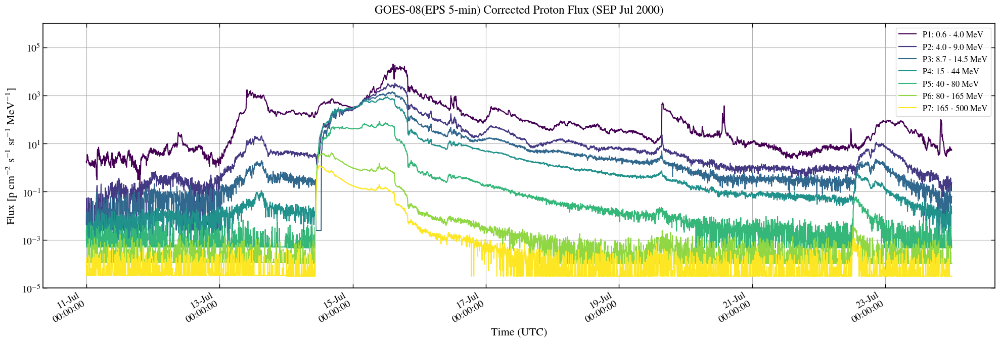

In [50]:
# Analisi dati GOES-11 EPS  5min

import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np


#font stile paper astrophysical journal AASTeX tipo LaTeX



# -----------------------------------------------------------------------

file_path = "File_scaricati_eventiSEP/Evento JUL 2000/g08_eps_5m_20000701_20000731.csv"


#Cerca dinamica header che dovrebbe partire con "time_tag" riga 455
header_line_index = 0
column_names = []

with open(file_path, "r") as f:
    for i, line in enumerate(f):
        if "time_tag" in line and "p1_flux" in line:
            header_line_index = i
            column_names = line.strip().split(",")
            break

print(f"Header trovato alla riga: {header_line_index}")


# Dataset 

df = pd.read_csv(file_path, skiprows=header_line_index + 1, header=None, names=column_names)
# quick print
#print(df.head(10))


# PULIZIA DATI

df["time_tag"] = pd.to_datetime(df["time_tag"])
df = df.set_index("time_tag")

#Nan values fix
df = df.replace(-99999, np.nan)

# Scelgo solo i canali di FLUSSO DIFFERENZIALE CORRETTI  
#float p1_flux_c(record);
#p1_flux_c:description = "P1 Proton channel 0.6 - 4.0 MeV corrected.";

proton_cols = [c for c in df.columns if c.startswith("p") and c.endswith("_flux_c")]

print(f"Canali FLUSSO_PROTONI_CORRETTI trovati: {proton_cols}")

# -----------------------------------------------------------------------
# -----------------------------------------------------------------------
# PLOT EVENTO 

#Etichette 
channel_map = {
    'p1_flux_c': 'P1: 0.6 - 4.0 MeV',
    'p2_flux_c': 'P2: 4.0 - 9.0 MeV',
    'p3_flux_c': 'P3: 8.7 - 14.5 MeV',
    'p4_flux_c': 'P4: 15 - 44 MeV',
    'p5_flux_c': 'P5: 40 - 80 MeV',
    'p6_flux_c': 'P6: 80 - 165 MeV',
    'p7_flux_c': 'P7: 165 - 500 MeV'
}


#Event range
start = "2000-07-11"
end = "2000-07-23"
df_evento = df.loc[start:end]

plt.figure(figsize=(20, 7))

# Usa una colormap (es. Viridis o Jet)
colors = plt.cm.viridis(np.linspace(0, 1, len(proton_cols)))

for col, color in zip(proton_cols, colors):
    label_text = channel_map.get(col, col) 
    
    plt.plot(df_evento.index, df_evento[col], 
             label=label_text, 
             color=color, 
             linewidth=1.5)

# --- 4. FORMATTAZIONE FINALE ---
plt.yscale('log')
plt.ylim(1e-5, 1e6) # Aggiusta se necessario

# Etichette assi con LaTeX
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
plt.xlabel('Time (UTC)')
plt.title(r'GOES-08(EPS 5-min) Corrected Proton Flux (SEP Jul 2000)', pad=15)

# Formattazione asse temporale
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b\n%H:%M:%S'))
plt.gcf().autofmt_xdate()

# Legenda Stile Paper (senza box pesante, font leggermente più piccolo se serve)
plt.legend(frameon=True, loc='upper right', fontsize=12, handlelength=2)

plt.grid()
plt.tight_layout()
plt.show()

### SEP Event MEASURED on CRUISE MAR 2012 

la navicella MSL con dentro rover curiosity è stata investita da una tempesta solare SEP 



Start: 2012-03-01

End: 2012-03-15



Visto sia da GOES che da dentro RAD 

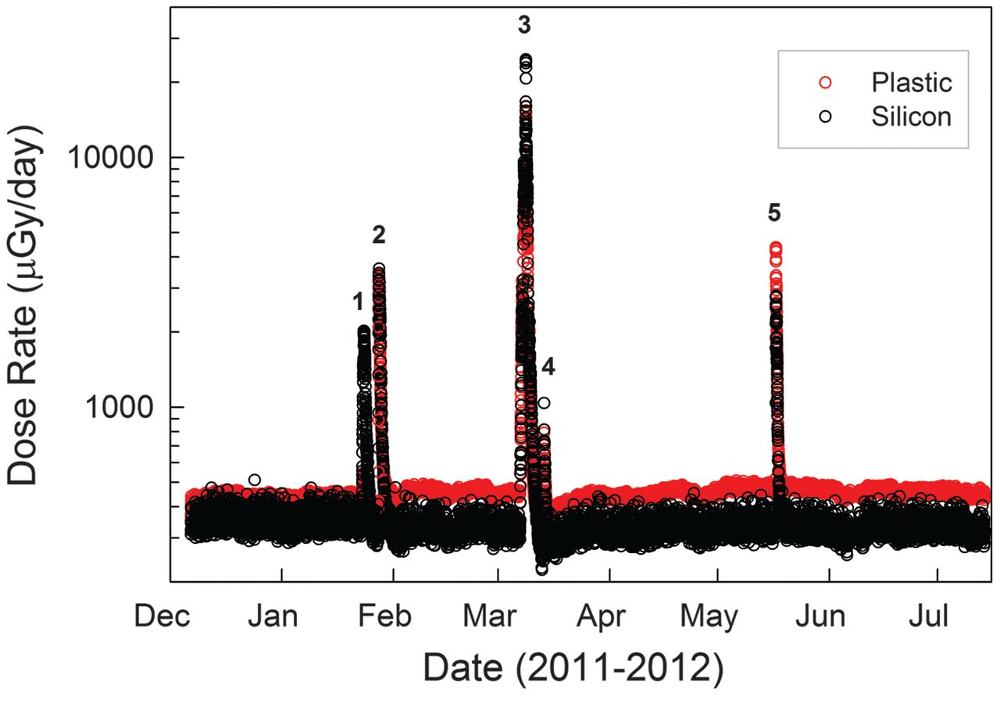

Paper: 

https://www.science.org/doi/full/10.1126/science.1235989



Durante il cruise verso marte 5 Eventi SEP 

23 29 JAN
7 15 MAR
17 MAY  also GLE on Earth

sono stati misurati da RAD su MSL 

GOES data:
https://www.ncei.noaa.gov/data/goes-space-environment-monitor/access/avg/2012/05/goes13/csv/

Lettura file: File_scaricati_eventiSEP/Evento MAY 2012/g13_epead_cpflux_5m_20120501_20120531.csv...
Dati filtrati (2012-05-15 00:00 - 2012-05-23 00:00): 2305 righe.


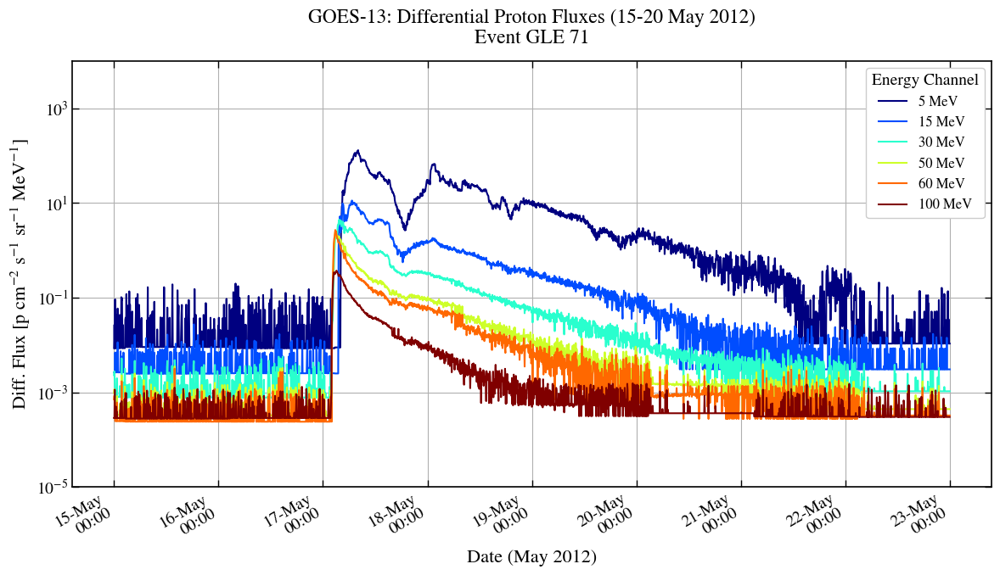

✅ Grafico salvato come: GOES13_DiffFlux_May2012.png


In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib as mpl
import numpy as np
import io

# ==========================================
# 🛠️ CONFIGURAZIONE
# ==========================================
FILE_NAME = 'File_scaricati_eventiSEP/Evento MAY 2012/g13_epead_cpflux_5m_20120501_20120531.csv' # Assicurati che abbia l'estensione giusta (.csv o .txt)
START_DATE = '2012-05-15 00:00'
END_DATE   = '2012-05-23 00:00' # Fino alla fine del 20 Maggio

# --- Stile Grafico ---
mpl.rcParams['font.family'] = 'STIXGeneral'
mpl.rcParams['font.size'] = 14
mpl.rcParams['axes.grid'] = True
mpl.rcParams['axes.linewidth'] = 1.2
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'

# ==========================================
# 1. CARICAMENTO DATI
# ==========================================
print(f"Lettura file: {FILE_NAME}...")

try:
    # Cerca la riga dove iniziano i dati (dopo "data:")
    header_row = 0
    with open(FILE_NAME, 'r') as f:
        for i, line in enumerate(f):
            if "data:" in line:
                header_row = i + 1 # L'header è la riga dopo "data:"
                break
    
    # Leggi il CSV
    df = pd.read_csv(FILE_NAME, skiprows=header_row, parse_dates=['time_tag'])
    
    # Imposta indice temporale
    df.set_index('time_tag', inplace=True)
    
    # Pulisci i dati (rimuovi -99999 che sono errori)
    df = df.replace(-99999.0, np.nan)

    # Filtra per il periodo richiesto
    df_event = df[START_DATE:END_DATE]
    print(f"Dati filtrati ({START_DATE} - {END_DATE}): {len(df_event)} righe.")

    # ==========================================
    # 2. SELEZIONE CANALI DIFFERENZIALI (ZPEQ)
    # ==========================================
    # I canali differenziali iniziano con ZPEQ.
    # Prendiamo quelli del sensore 'E' (East) che sono i primari.
    # ZPEQ5E  = ~5 MeV
    # ZPEQ15E = ~15 MeV
    # ZPEQ30E = ~30 MeV
    # ZPEQ50E = ~50 MeV
    # ZPEQ60E = ~60 MeV
    # ZPEQ100E = ~100 MeV
    
    diff_channels = {
        'ZPEQ5E':   '5 MeV',
        'ZPEQ15E':  '15 MeV',
        'ZPEQ30E':  '30 MeV',
        'ZPEQ50E':  '50 MeV',
        'ZPEQ60E':  '60 MeV',
        'ZPEQ100E': '100 MeV'
    }
    
    # Colormap per distinguere le energie (Jet o Viridis)
    colors = plt.cm.jet(np.linspace(0, 1, len(diff_channels)))

    # ==========================================
    # 3. PLOT
    # ==========================================
    fig, ax = plt.subplots(figsize=(12, 7))

    for (col, label), color in zip(diff_channels.items(), colors):
        if col in df_event.columns:
            ax.plot(df_event.index, df_event[col], label=label, color=color, linewidth=1.5)
        else:
            print(f"⚠️ Attenzione: Colonna {col} non trovata nel file.")

    # Configurazione Assi
    ax.set_yscale('log')
    ax.set_ylim(1e-5, 1e4) # Adatta i limiti se necessario
    
    ax.set_ylabel(r'Diff. Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]')
    ax.set_xlabel('Date (May 2012)')
    ax.set_title('GOES-13: Differential Proton Fluxes (15-20 May 2012)\nEvent GLE 71', pad=15)

    # Formattazione Date
    date_fmt = mdates.DateFormatter('%d-%b\n%H:%M')
    ax.xaxis.set_major_formatter(date_fmt)
    fig.autofmt_xdate()

    # Legenda
    ax.legend(loc='upper right', title='Energy Channel', frameon=True, framealpha=1)
    
    plt.tight_layout()
    
    # Salva o Mostra
    save_name = 'GOES13_DiffFlux_May2012.png'
    plt.savefig(save_name, dpi=300)
    plt.show()
    print(f"✅ Grafico salvato come: {save_name}")

except FileNotFoundError:
    print(f"❌ Errore: Il file '{FILE_NAME}' non è stato trovato.")
except Exception as e:
    print(f"❌ Errore generico: {e}")

In [1]:
plt.close('all')

NameError: name 'plt' is not defined

# Inizio analisi flussi -> Spettro 